In [1]:
%matplotlib inline
import re
import math, time, random, datetime
import numpy as np
import pandas as pd 
import json
import matplotlib.pyplot as plt
import missingno as msno
import seaborn as sns
import warnings
import statsmodels.api as sm
import catboost
import graphviz
import joblib
import logging
import tensorflow as tf
import imblearn as ibn
from scipy.special import softmax
from imblearn.over_sampling import RandomOverSampler
from math import floor
from scipy import stats
from sklearn import set_config, preprocessing, model_selection, tree
from statsmodels.tools import add_constant as add_constant
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder, LabelEncoder, label_binarize, StandardScaler
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, cross_validate 
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, roc_auc_score, roc_curve, auc
from sklearn.svm import LinearSVC, SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.utils import resample
from sklearn.decomposition import PCA
from sklearn.compose import make_column_transformer
from sklearn.impute import SimpleImputer
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, VotingClassifier
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import cross_validate
from sklearn.pipeline import Pipeline
from flask import Flask, request, jsonify
warnings.filterwarnings("ignore")
sns.set_theme
sns.set_palette('colorblind')
sns.set(style="whitegrid")

## Description des bases

Dans le cadre de ce thème, les étapes générales suivantes seront suivies pour travailler sur ces données sont :

1. **Collecte des données :** La première étape consiste à collecter les données pertinentes pour votre étude. Cela peut inclure la collecte de données primaires, telles que des enquêtes ou des observations sur le terrain, ou la collecte de données secondaires provenant de sources existantes, telles que des bases de données publiques ou des documents de recherche.

2. **Nettoyage des données :** Une fois que les données sont collectées, elles doivent être nettoyées pour éliminer les erreurs, les valeurs manquantes et les incohérences. Cela implique souvent la vérification de la qualité des données, la suppression des doublons et la normalisation des formats.

3. **Exploration des données :** À cette étape, vous explorerez les données pour en comprendre la structure et les caractéristiques. Vous utiliserez des techniques d'analyse exploratoire des données (AED) pour identifier des tendances, des corrélations et des modèles potentiels dans les données.

4. **Prétraitement des données :** Le prétraitement des données implique la transformation des données en vue de les préparer à l'analyse. Cela peut inclure la normalisation des variables, la création de caractéristiques dérivées, la gestion des valeurs aberrantes et la réduction de la dimensionnalité.

5. **Conception de la base de données :** Si vos données ne sont pas déjà stockées dans une base de données, vous devrez concevoir la structure de la base de données. Cela implique la définition des tables, des champs, des relations et des contraintes pour stocker et organiser vos données de manière efficace.

6. **Analyse des données :** À cette étape, vous appliquerez des méthodes statistiques ou des techniques d'apprentissage automatique pour extraire des informations significatives de vos données. Cela peut inclure la modélisation statistique, la régression, la classification ou d'autres techniques d'analyse.

7. **Interprétation des résultats :** Vous interpréterez les résultats de votre analyse pour répondre aux questions de recherche ou aux objectifs de votre étude. Cela implique de tirer des conclusions basées sur les preuves fournies par vos données.

8. **Visualisation des données :** La visualisation des données est un moyen puissant de communiquer vos résultats. Vous utiliserez des graphiques, des tableaux de bord et d'autres outils visuels pour présenter vos conclusions de manière claire et accessible.

9. **Validation et évaluation :** Vous évaluerez la qualité de votre analyse en utilisant des techniques de validation appropriées. Si vous avez construit un modèle prédictif, vous évaluerez sa performance en utilisant des mesures telles que la précision, le rappel ou le score F1.

10. **Communication des résultats :** Vous communiquerez vos résultats à un public cible, que ce soit sous forme de rapports, de présentations orales ou d'autres moyens de communication appropriés. Vous expliquerez vos découvertes de manière claire et convaincante.

11. **Documentation :** La documentation de tout le processus, y compris les méthodes, les données, les résultats et les conclusions, est essentielle pour assurer la reproductibilité de votre travail et permettre à d'autres chercheurs de comprendre et de vérifier votre analyse.

12. **Réflexion et itérations :** Après avoir complété votre analyse, vous pourriez réfléchir sur les leçons apprises et les améliorations possibles. Vous pourriez également envisager des itérations futures de votre étude pour approfondir la compréhension de votre thème.

Ces étapes générales fournissent un cadre pour travailler avec des bases de données dans le cadre de votre thème de recherche. La manière dont vous appliquez ces étapes dépendra de la nature spécifique de vos données et de vos objectifs de recherche.

L'importance des différents éléments dans la santé d'une plante est cruciale, car chaque élément joue un rôle spécifique dans la croissance, le développement et le métabolisme de la plante:
1. Azote (N) :
- Importance : L'azote est essentiel à la synthèse des protéines, de l'ADN, de la chlorophylle et d'autres composés vitaux pour la croissance de la plante.
- Conséquences du manque : Un manque d'azote entraîne un retard de croissance, un jaunissement des feuilles (chlorose), une réduction de la taille des feuilles et des tiges, ainsi qu'une production de fruits et de graines limitée.

2. Phosphore (P) :
- Importance : Le phosphore est impliqué dans la photosynthèse, la formation de l'ADN, de l'ARN et de l'ATP, ainsi que dans le transfert d'énergie cellulaire.
- Conséquences du manque : Un manque de phosphore provoque une croissance ralentie, un développement racinaire insuffisant, une coloration pourpre ou rouge des feuilles, et une diminution de la floraison et de la fructification.

3. Potassium (K) :
- Importance : Le potassium régule l'ouverture et la fermeture des stomates, favorise la résistance aux maladies et aux stress, et participe à la synthèse des hydrates de carbone.
- Conséquences du manque : Un manque de potassium provoque un jaunissement des bords des feuilles, une sensibilité accrue aux maladies, une faiblesse de la tige, ainsi qu'une diminution de la qualité globale de la plante.

4. pH du sol :
- Importance : Le pH du sol affecte l'absorption des nutriments par les racines de la plante. Certains éléments sont mieux absorbés dans des conditions de pH spécifiques.
- Conséquences du déséquilibre : Un pH du sol inadapté peut entraîner des carences nutritionnelles, car les éléments essentiels ne sont pas disponibles pour la plante. Par exemple, un sol acide peut limiter l'absorption de calcium.

5. Précipitations (Rainfall) :
 - Importance : Les précipitations fournissent de l'eau, un élément essentiel pour la photosynthèse, le transport des nutriments et la régulation de la température.
- Conséquences du manque : Un manque de précipitations peut provoquer la sécheresse, un stress hydrique, un flétrissement des feuilles, et éventuellement la mort de la plante.

6. Température :
- Importance : La température affecte la vitesse des réactions biochimiques, la germination des graines, la croissance végétative et la floraison.
- Conséquences du déséquilibre : Des températures extrêmes, qu'elles soient trop élevées ou trop basses, peuvent causer des dommages aux cellules, une croissance anormale, une floraison prématurée ou retardée, voire la mort de la plante.

Chaque élément joue un rôle spécifique dans la santé d'une plante, et un manque ou un déséquilibre de ces éléments peut avoir des conséquences néfastes sur la croissance, le développement et la survie de la plante. Il est donc essentiel de fournir à la plante un environnement optimal en termes de nutrition, de pH, de précipitations et de température pour assurer sa santé et sa productivité.

In [2]:
# path of data 
path = 'C:/Users/nsond/Desktop/memoire/bananas.csv'
bananas= pd.read_csv(path)
bananas.to_csv('bananas.csv')
bananas.shape

(12488, 7)

In [3]:
bananas.head(20)

,Plant,N,P,K,pH,Rainfall,Temperature
0,bananas,250,10,100,6.0,1200.0,15.0
1,bananas,250,10,100,6.0,1200.0,15.9
2,bananas,250,10,100,6.0,1200.0,16.8
3,bananas,250,10,100,6.0,1200.0,17.7
4,bananas,250,10,100,6.0,1200.0,18.6
5,bananas,250,10,100,6.0,1200.0,19.5
6,bananas,250,10,100,6.0,1200.0,20.4
7,bananas,250,10,100,6.0,1200.0,21.3
8,bananas,250,10,100,6.0,1200.0,22.2
9,bananas,250,10,100,6.0,1200.0,23.1


In [4]:
bananas.isnull().sum()*100/len(bananas)

Plant          0.0
N              0.0
P              0.0
K              0.0
pH             0.0
Rainfall       0.0
Temperature    0.0
dtype: float64

In [5]:
# path of data 
path = 'C:/Users/nsond/Desktop/memoire/bean.csv'
beans = pd.read_csv(path)
beans.to_csv('bean.csv')
beans.shape

(20010, 7)

In [6]:
beans.head(20)

,Plant,N,P,K,pH,Rainfall,Temperature
0,bean,10,4,10,5.0,400.0,15.0
1,bean,10,4,10,5.0,400.0,15.9
2,bean,10,4,10,5.0,400.0,16.8
3,bean,10,4,10,5.0,400.0,17.7
4,bean,10,4,10,5.0,400.0,18.6
5,bean,10,4,10,5.0,400.0,19.5
6,bean,10,4,10,5.0,400.0,20.4
7,bean,10,4,10,5.0,400.0,21.3
8,bean,10,4,10,5.0,400.0,22.2
9,bean,10,4,10,5.0,400.0,23.1


In [7]:
beans.isnull().sum()*100/len(beans)

Plant          0.0
N              0.0
P              0.0
K              0.0
pH             0.0
Rainfall       0.0
Temperature    0.0
dtype: float64

In [8]:
# path of data 
path = 'C:/Users/nsond/Desktop/memoire/cacao.csv'
cacaos = pd.read_csv(path)
cacaos.to_csv('cacao.csv')
cacaos.shape

(33340, 7)

In [9]:
cacaos.head(20)

,Plant,N,P,K,pH,Rainfall,Temperature
0,cacao,20,10,15,6.0,1000.0,24.0
1,cacao,20,10,15,6.0,1000.0,24.9
2,cacao,20,10,15,6.0,1000.0,25.8
3,cacao,20,10,15,6.0,1000.0,26.7
4,cacao,20,10,15,6.0,1000.0,27.6
5,cacao,20,10,15,6.0,1000.0,28.5
6,cacao,20,10,15,6.0,1000.0,29.4
7,cacao,20,10,15,6.0,1000.0,30.3
8,cacao,20,10,15,6.0,1000.0,31.2
9,cacao,20,10,15,6.0,1000.0,32.1


In [10]:
# path of data 
path = 'C:/Users/nsond/Desktop/memoire/cassava.csv'
cassavas = pd.read_csv(path)
cassavas.to_csv('cassava.csv')
cassavas.shape

(69360, 7)

In [11]:
cassavas.head(20)

,Plant,N,P,K,pH,Rainfall,Temperature
0,cassava,60,30,60,5.0,500.0,23.0
1,cassava,60,30,60,5.0,500.0,23.9
2,cassava,60,30,60,5.0,500.0,24.8
3,cassava,60,30,60,5.0,500.0,25.7
4,cassava,60,30,60,5.0,500.0,26.6
5,cassava,60,30,60,5.0,500.0,27.5
6,cassava,60,30,60,5.0,500.0,28.4
7,cassava,60,30,60,5.0,500.0,29.3
8,cassava,60,30,60,5.0,500.0,30.2
9,cassava,60,30,60,5.0,500.0,31.1


In [12]:
# path of data 
path = 'C:/Users/nsond/Desktop/memoire/chilli-pepper.csv'
chilli = pd.read_csv(path)
chilli.to_csv('chilli-pepper.csv')
chilli.shape

(6230, 7)

In [13]:
chilli.head(20)

,Plant,N,P,K,pH,Rainfall,Temperature
0,chilli-pepper,130,50,250,6.5,800.0,18.0
1,chilli-pepper,130,50,250,6.5,800.0,18.9
2,chilli-pepper,130,50,250,6.5,800.0,19.8
3,chilli-pepper,130,50,250,6.5,800.0,20.7
4,chilli-pepper,130,50,250,6.5,800.0,21.6
5,chilli-pepper,130,50,250,6.5,800.0,22.5
6,chilli-pepper,130,50,250,6.5,800.0,23.4
7,chilli-pepper,130,50,250,6.5,800.0,24.3
8,chilli-pepper,130,50,250,6.5,800.0,25.2
9,chilli-pepper,130,50,250,6.5,800.0,26.1


In [14]:
# path of data 
path = 'C:/Users/nsond/Desktop/memoire/coffee.csv'
coffees = pd.read_csv(path)
coffees.to_csv('coffee.csv')
coffees.shape

(86697, 7)

In [15]:
coffees.head(20)

,Plant,N,P,K,pH,Rainfall,Temperature
0,coffee,55,11,30,4.0,1000.0,24.0
1,coffee,55,11,30,4.0,1000.0,24.9
2,coffee,55,11,30,4.0,1000.0,25.8
3,coffee,55,11,30,4.0,1000.0,26.7
4,coffee,55,11,30,4.0,1000.0,27.6
5,coffee,55,11,30,4.0,1000.0,28.5
6,coffee,55,11,30,4.0,1000.0,29.4
7,coffee,55,11,30,4.0,1000.0,30.3
8,coffee,55,11,30,4.0,1000.0,31.2
9,coffee,55,11,30,4.0,1000.0,32.1


In [16]:
# path of data 
path = 'C:/Users/nsond/Desktop/memoire/fruit-tree.csv'
fruits = pd.read_csv(path)
fruits.to_csv('fruit-tree.csv')
fruits.shape

(9352, 7)

In [17]:
fruits.head(20)

,Plant,N,P,K,pH,Rainfall,Temperature
0,fruit tree,12,12,24,7.0,1200.0,25.0
1,fruit tree,12,12,24,7.0,1200.0,25.9
2,fruit tree,12,12,24,7.0,1200.0,26.8
3,fruit tree,12,12,24,7.0,1200.0,27.7
4,fruit tree,12,12,24,7.0,1200.0,28.6
5,fruit tree,12,12,24,7.0,1200.0,29.5
6,fruit tree,12,12,24,7.0,1200.0,30.4
7,fruit tree,12,12,24,7.0,1200.0,31.3
8,fruit tree,12,12,24,7.0,1200.0,32.2
9,fruit tree,12,12,24,7.0,1200.0,33.1


In [18]:
# path of data 
path = 'C:/Users/nsond/Desktop/memoire/laituce.csv'
laituces = pd.read_csv(path)
laituces.to_csv('laituce.csv')
laituces.shape

(66675, 7)

In [19]:
laituces.head(20)

,Plant,N,P,K,pH,Rainfall,Temperature
0,laituce,150,50,150,6.0,700.0,10.0
1,laituce,150,50,150,6.0,700.0,10.9
2,laituce,150,50,150,6.0,700.0,11.8
3,laituce,150,50,150,6.0,700.0,12.7
4,laituce,150,50,150,6.0,700.0,13.6
5,laituce,150,50,150,6.0,700.0,14.5
6,laituce,150,50,150,6.0,700.0,15.4
7,laituce,150,50,150,6.0,700.0,16.3
8,laituce,150,50,150,6.0,700.0,17.2
9,laituce,150,50,150,6.0,700.0,18.1


In [20]:
# path of data 
path = 'C:/Users/nsond/Desktop/memoire/maize.csv'
maizes = pd.read_csv(path)
maizes.to_csv('maize.csv') 
maizes.shape

(3136, 7)

In [21]:
maizes.head(20)

,Plant,N,P,K,pH,Rainfall,Temperature
0,maize,35,60,35,7.0,500.0,10.0
1,maize,35,60,35,7.0,500.0,10.9
2,maize,35,60,35,7.0,500.0,11.8
3,maize,35,60,35,7.0,500.0,12.7
4,maize,35,60,35,7.0,500.0,13.6
5,maize,35,60,35,7.0,500.0,14.5
6,maize,35,60,35,7.0,500.0,15.4
7,maize,35,60,35,7.0,500.0,16.3
8,maize,35,60,35,7.0,500.0,17.2
9,maize,35,60,35,7.0,500.0,18.1


In [22]:
# path of data 
path = 'C:/Users/nsond/Desktop/memoire/okra.csv'
okras = pd.read_csv(path)
okras.to_csv('okra.csv') 
okras.shape

(13344, 7)

In [23]:
okras.head(20)

,Plant,N,P,K,pH,Rainfall,Temperature
0,okra,25,45,45,6.0,1000.0,20.0
1,okra,25,45,45,6.0,1000.0,20.9
2,okra,25,45,45,6.0,1000.0,21.8
3,okra,25,45,45,6.0,1000.0,22.7
4,okra,25,45,45,6.0,1000.0,23.6
5,okra,25,45,45,6.0,1000.0,24.5
6,okra,25,45,45,6.0,1000.0,25.4
7,okra,25,45,45,6.0,1000.0,26.3
8,okra,25,45,45,6.0,1000.0,27.2
9,okra,25,45,45,6.0,1000.0,28.1


In [24]:
# path of data 
path = 'C:/Users/nsond/Desktop/memoire/onion.csv'
onions = pd.read_csv(path)
onions.to_csv('onion.csv')
onions.shape

(13380, 7)

In [25]:
onions.head(20)

,Plant,N,P,K,pH,Rainfall,Temperature
0,onion,80,40,40,6.5,600.0,10.0
1,onion,80,40,40,6.5,600.0,10.9
2,onion,80,40,40,6.5,600.0,11.8
3,onion,80,40,40,6.5,600.0,12.7
4,onion,80,40,40,6.5,600.0,13.6
5,onion,80,40,40,6.5,600.0,14.5
6,onion,80,40,40,6.5,600.0,15.4
7,onion,80,40,40,6.5,600.0,16.3
8,onion,80,40,40,6.5,600.0,17.2
9,onion,80,40,40,6.5,600.0,18.1


In [26]:
# path of data 
path = 'C:/Users/nsond/Desktop/memoire/palm-tree.csv'
palms = pd.read_csv(path)
palms.to_csv('palm-tree.csv')
palms.shape

(18676, 7)

In [27]:
palms.head(20)

,Plant,N,P,K,pH,Rainfall,Temperature
0,palm-tree,12,16,56,4.0,1500.0,18.0
1,palm-tree,12,16,56,4.0,1500.0,18.9
2,palm-tree,12,16,56,4.0,1500.0,19.8
3,palm-tree,12,16,56,4.0,1500.0,20.7
4,palm-tree,12,16,56,4.0,1500.0,21.6
5,palm-tree,12,16,56,4.0,1500.0,22.5
6,palm-tree,12,16,56,4.0,1500.0,23.4
7,palm-tree,12,16,56,4.0,1500.0,24.3
8,palm-tree,12,16,56,4.0,1500.0,25.2
9,palm-tree,12,16,56,4.0,1500.0,26.1


In [28]:
# path of data 
path = 'C:/Users/nsond/Desktop/memoire/peanut.csv'
peanuts = pd.read_csv(path)
peanuts.to_csv('peanut.csv')
peanuts.shape

(16000, 7)

In [29]:
peanuts.head(20)

,Plant,N,P,K,pH,Rainfall,Temperature
0,peanut,5,20,10,4.0,400.0,28.0
1,peanut,5,20,10,4.0,400.0,28.9
2,peanut,5,20,10,4.0,400.0,29.8
3,peanut,5,20,10,4.0,400.0,30.7
4,peanut,5,20,10,4.0,400.0,31.6
5,peanut,5,20,10,4.0,400.0,32.5
6,peanut,5,20,10,4.0,400.0,33.4
7,peanut,5,20,10,4.0,400.0,34.3
8,peanut,5,20,10,4.9,400.0,28.0
9,peanut,5,20,10,4.9,400.0,28.9


In [30]:
# path of data 
path = 'C:/Users/nsond/Desktop/memoire/pineaple.csv'
pineaples = pd.read_csv(path)
pineaples.to_csv('pineaple.csv')
pineaples.shape

(8004, 7)

In [31]:
pineaples.head(20)

,Plant,N,P,K,pH,Rainfall,Temperature
0,pineaple,8,4,20,4.5,900.0,21.0
1,pineaple,8,4,20,4.5,900.0,21.9
2,pineaple,8,4,20,4.5,900.0,22.8
3,pineaple,8,4,20,4.5,900.0,23.7
4,pineaple,8,4,20,4.5,900.0,24.6
5,pineaple,8,4,20,4.5,900.0,25.5
6,pineaple,8,4,20,5.4,900.0,21.0
7,pineaple,8,4,20,5.4,900.0,21.9
8,pineaple,8,4,20,5.4,900.0,22.8
9,pineaple,8,4,20,5.4,900.0,23.7


In [32]:
# path of data 
path = 'C:/Users/nsond/Desktop/memoire/potato.csv'
potatos = pd.read_csv(path)
potatos.to_csv('potato.csv')
potatos.shape

(18672, 7)

In [33]:
potatos.head(20)

,Plant,N,P,K,pH,Rainfall,Temperature
0,potatos,210,10,210,6.0,1000.0,25.0
1,potatos,210,10,210,6.0,1000.0,25.9
2,potatos,210,10,210,6.0,1000.0,26.8
3,potatos,210,10,210,6.0,1000.0,27.7
4,potatos,210,10,210,6.0,1000.0,28.6
5,potatos,210,10,210,6.0,1000.0,29.5
6,potatos,210,10,210,6.0,1000.0,30.4
7,potatos,210,10,210,6.0,1000.0,31.3
8,potatos,210,10,210,6.0,1000.0,32.2
9,potatos,210,10,210,6.0,1000.0,33.1


In [34]:
# path of data 
path = 'C:/Users/nsond/Desktop/memoire/rice.csv'
rices = pd.read_csv(path)
rices.to_csv('rice.csv')
rices.shape

(155680, 7)

In [35]:
rices.head(20)

,Plant,N,P,K,pH,Rainfall,Temperature
0,rice,16,3,50,4.0,1000.0,13.0
1,rice,16,3,50,4.0,1000.0,13.9
2,rice,16,3,50,4.0,1000.0,14.8
3,rice,16,3,50,4.0,1000.0,15.7
4,rice,16,3,50,4.0,1000.0,16.6
5,rice,16,3,50,4.0,1000.0,17.5
6,rice,16,3,50,4.0,1000.0,18.4
7,rice,16,3,50,4.0,1000.0,19.3
8,rice,16,3,50,4.0,1000.0,20.2
9,rice,16,3,50,4.0,1000.0,21.1


In [36]:
# path of data 
path = 'C:/Users/nsond/Desktop/memoire/sorghum.csv'
sorghums = pd.read_csv(path)
sorghums.to_csv('sorghum.csv')
sorghums.shape

(2676, 7)

In [37]:
sorghums.head(20)

,Plant,N,P,K,pH,Rainfall,Temperature
0,sorghum,25,50,50,6.8,600.0,25.0
1,sorghum,25,50,50,6.8,600.0,25.9
2,sorghum,25,50,50,6.8,600.0,26.8
3,sorghum,25,50,50,6.8,600.0,27.7
4,sorghum,25,50,50,6.8,600.0,28.6
5,sorghum,25,50,50,6.8,600.0,29.5
6,sorghum,25,50,50,6.8,600.0,30.4
7,sorghum,25,50,50,6.8,600.0,31.3
8,sorghum,25,50,50,6.8,600.0,32.2
9,sorghum,25,50,50,6.8,600.0,33.1


In [38]:
# path of data 
path = 'C:/Users/nsond/Desktop/memoire/sugarcane.csv'
sugarcanes = pd.read_csv(path)
sugarcanes.to_csv('sugarcane.csv')
sugarcanes.shape

(25576, 7)

In [39]:
sugarcanes.head(20)

,Plant,N,P,K,pH,Rainfall,Temperature
0,sugarcane,50,40,80,7.0,1000.0,15.0
1,sugarcane,50,40,80,7.0,1000.0,15.9
2,sugarcane,50,40,80,7.0,1000.0,16.8
3,sugarcane,50,40,80,7.0,1000.0,17.7
4,sugarcane,50,40,80,7.0,1000.0,18.6
5,sugarcane,50,40,80,7.0,1000.0,19.5
6,sugarcane,50,40,80,7.0,1000.0,20.4
7,sugarcane,50,40,80,7.0,1000.0,21.3
8,sugarcane,50,40,80,7.0,1000.0,22.2
9,sugarcane,50,40,80,7.0,1000.0,23.1


In [40]:
# path of data 
path = 'C:/Users/nsond/Desktop/memoire/tea.csv'
teas = pd.read_csv(path)
teas.to_csv('tea.csv')
teas.shape

(140004, 7)

In [41]:
teas.head(20)

,Plant,N,P,K,pH,Rainfall,Temperature
0,tea-plant,20,10,20,3.0,1500.0,15.0
1,tea-plant,20,10,20,3.0,1500.0,15.9
2,tea-plant,20,10,20,3.0,1500.0,16.8
3,tea-plant,20,10,20,3.0,1500.0,17.7
4,tea-plant,20,10,20,3.0,1500.0,18.6
5,tea-plant,20,10,20,3.0,1500.0,19.5
6,tea-plant,20,10,20,3.0,1500.0,20.4
7,tea-plant,20,10,20,3.0,1500.0,21.3
8,tea-plant,20,10,20,3.0,1500.0,22.2
9,tea-plant,20,10,20,3.0,1500.0,23.1


In [42]:
# path of data 
path = 'C:/Users/nsond/Desktop/memoire/tomato.csv'
tomatos = pd.read_csv(path)
tomatos.to_csv('tomato.csv')
tomatos.shape

(17034, 7)

In [43]:
tomatos.head(20)

,Plant,N,P,K,pH,Rainfall,Temperature
0,tomatos,50,130,250,5.0,700.0,20.0
1,tomatos,50,130,250,5.0,700.0,20.9
2,tomatos,50,130,250,5.0,700.0,21.8
3,tomatos,50,130,250,5.0,700.0,22.7
4,tomatos,50,130,250,5.0,700.0,23.6
5,tomatos,50,130,250,5.0,700.0,24.5
6,tomatos,50,130,250,5.0,700.0,25.4
7,tomatos,50,130,250,5.0,700.0,26.3
8,tomatos,50,130,250,5.0,700.0,27.2
9,tomatos,50,130,250,5.0,700.0,28.1


## Fusion par la méthode merge de pandas

In [44]:
# Merging 20 csv files
Datamerge = pd.concat([bananas, beans, cacaos, cassavas, chilli, coffees, fruits, laituces, maizes, okras, onions, 
                       palms, peanuts, pineaples, potatos, rices, sorghums, sugarcanes, teas, tomatos], axis=0, ignore_index=True)

L'opération de fusion de 20 fichiers CSV distincts a été entreprise dans le but de consolider ces données en une seule source cohérente, simplifiant ainsi les travaux ultérieurs de traitement, d'analyse et de prédiction. Il est important de noter que toutes les bases de données initiales présentent la particularité d'avoir le même nombre de variables ainsi que les mêmes noms de variables, ce qui a facilité cette opération de fusion.

Le processus de fusion des bases de données a été réalisé à l'aide de la bibliothèque pandas en Python, en utilisant la fonction `concat`. Cette fonction permet de concaténer verticalement (le long de l'axe 0) les données provenant des 20 fichiers CSV, créant ainsi un nouveau DataFrame consolidé appelé `Datamerge`.

Cette opération de fusion a apporté plusieurs avantages à l'étude. Tout d'abord, elle a permis de regrouper l'ensemble des données de manière à ce qu'elles soient plus facilement accessibles et gérables. Ensuite, elle a éliminé la nécessité de travailler avec 20 ensembles de données distincts, simplifiant ainsi considérablement le flux de travail. Enfin, elle a créé une base de données unique, cohérente et homogène, prête à être exploitée pour des futures analyses et prédictions.

Cette approche de fusion de données est couramment utilisée dans la recherche et l'analyse de données, permettant de rationaliser le processus de manipulation des données et d'obtenir des résultats plus efficacement. Elle constitue une étape fondamentale pour garantir la qualité et la pertinence des analyses ultérieures, tout en optimisant l'utilisation des ressources et du temps de travail.

## Description de la base

In [45]:
Datamerge.shape

(736334, 7)

In [46]:
Datamerge.head(5)

,Plant,N,P,K,pH,Rainfall,Temperature
0,bananas,250,10,100,6.0,1200.0,15.0
1,bananas,250,10,100,6.0,1200.0,15.9
2,bananas,250,10,100,6.0,1200.0,16.8
3,bananas,250,10,100,6.0,1200.0,17.7
4,bananas,250,10,100,6.0,1200.0,18.6


In [47]:
Datamerge.tail(5)

,Plant,N,P,K,pH,Rainfall,Temperature
736329,tomatos,50,130,250,6.8,999.7,30.8
736330,tomatos,50,130,250,6.8,999.7,31.7
736331,tomatos,50,130,250,6.8,999.7,32.6
736332,tomatos,50,130,250,6.8,999.7,33.5
736333,tomatos,50,130,250,6.8,999.7,34.4


<Axes: >

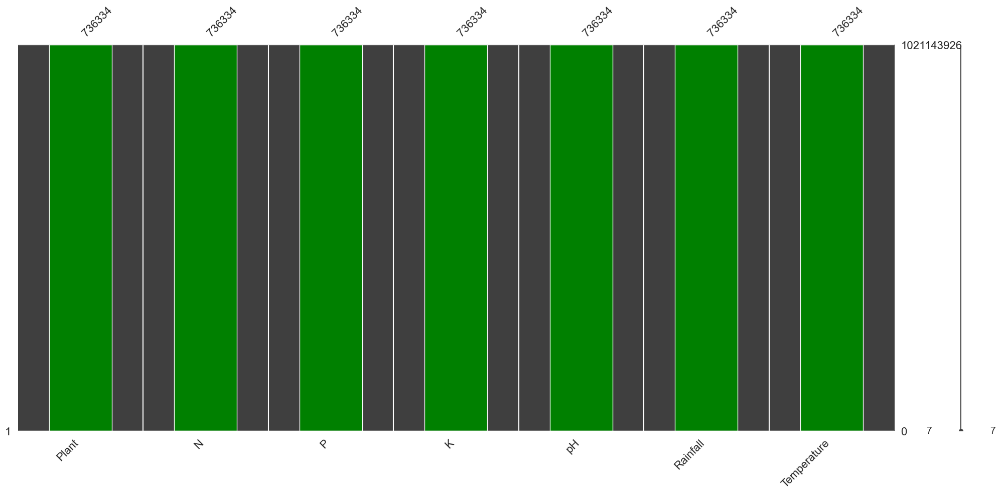

In [48]:
sns.set_theme(font_scale=1.5)  # Correction de 'front_scale' à 'font_scale'
msno.matrix(Datamerge,  figsize = (50, 20))
msno.bar(Datamerge, color = "green")

En analysant ce tableau, il est à noter qu'aucune donnée manquante n'est présente parmi les différentes variables. Chacune de ces variables contient 736,334 observations.

## Pré-traitement

## Statistiques descriptives

In [49]:
stats = Datamerge.describe(include=[object])
stats.index.name = 'Statistiques'
print(stats)

               Plant
Statistiques        
count         736334
unique            20
top             rice
freq          155680


In [50]:
Datamerge.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
N,736334.0,50.430366,54.297312,5.0,16.0,20.0,60.0,250.0
P,736334.0,20.004499,23.030196,3.0,10.0,10.0,30.0,130.0
K,736334.0,59.822939,56.386849,10.0,20.0,50.0,60.0,250.0
pH,736334.0,5.528704,1.322511,3.0,4.8,5.8,6.8,7.9
Rainfall,736334.0,1747.613486,962.855949,400.0,1126.0,1478.7,1979.7,4999.2
Temperature,736334.0,25.023192,6.291149,10.0,20.4,24.9,30.1,39.3


Dans l'analyse statistique présente, plusieurs caractéristiques liées aux données ont été examinées, fournissant des informations essentielles pour la compréhension de la composition du jeu de données. Les statistiques suivantes ont été interprétées :

- Azote (N) : La concentration moyenne d'azote dans les échantillons est d'environ 50.43 unités, avec une variation substantielle allant de 5 à 250 unités. Les valeurs centrales (25%, 50%, 75%) indiquent que la plupart des données se situent dans la plage de 16 à 60 unités.

- Phosphore (P) : La concentration moyenne de phosphore est d'environ 20.00 unités, avec des valeurs variant de 3 à 130 unités. La majorité des échantillons se trouve dans la fourchette de 10 à 30 unités.

- Potassium (K) : La concentration moyenne de potassium est d'environ 59.82 unités, avec une plage allant de 10 à 250 unités. Les valeurs centrales suggèrent que la plupart des observations se situent entre 20 et 60 unités.

- pH : Le pH moyen est d'environ 5.53, avec une plage de 3.0 (acide) à 7.9 (légèrement basique). La plupart des échantillons affichent un pH compris entre 4.8 et 6.8, indiquant une légère inclination vers la neutralité.

- Précipitations (Rainfall) : Les précipitations moyennes sont d'environ 1747.61 unités, avec une variation notable de 400.0 à 4999.2 unités. Cela révèle des différences significatives dans les niveaux de précipitations au sein de l'échantillon.

- Température (Temperature) : La température moyenne est d'environ 25.02 degrés, avec une plage de 10.0 à 39.3 degrés. Les valeurs centrales indiquent que la plupart des observations se situent entre 20.4 et 30.1 degrés, reflétant des conditions relativement tempérées.

Ces statistiques fournissent un aperçu des caractéristiques des données. Par exemple, la concentration d'azote varie considérablement, tandis que le pH reste généralement stable. Les données sur les précipitations et la température montrent également des variations significatives, pouvant influencer les analyse ultérieure.

In [51]:
from IPython.display import FileLink
chemin_du_fichier = 'memorie.docx'
lien_de_telechargement = FileLink('C:/Users/nsond/Desktop/stageP/memorie.ipynb')
lien_de_telechargement

C:\Users\nsond\Desktop\stageP\memorie.ipynb

In [52]:
Datamerge.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 736334 entries, 0 to 736333
Data columns (total 7 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   Plant        736334 non-null  object 
 1   N            736334 non-null  int64  
 2   P            736334 non-null  int64  
 3   K            736334 non-null  int64  
 4   pH           736334 non-null  float64
 5   Rainfall     736334 non-null  float64
 6   Temperature  736334 non-null  float64
dtypes: float64(3), int64(3), object(1)
memory usage: 39.3+ MB


Le DataFrame Datamerge présente une structure tabulaire avec un index Int64Index, qui identifie chaque ligne par un entier allant de 0 à 736,333. Il comprend sept colonnes distinctes, chacune caractérisant une variable spécifique. Parmi ces variables, "Plant" est de nature catégorielle, décrivant les types de plantes ou de cultures. Les colonnes "N," "P," et "K" sont numériques (int64) et quantifient respectivement les niveaux d'azote, de phosphore, et de potassium dans le sol. La colonne "pH" est également numérique (float64) et indique le pH du sol. Les deux dernières colonnes, "Rainfall" et "Temperature," sont numériques (float64) et enregistrent les précipitations en millimètres et la température en degrés Celsius.

Toutes les colonnes affichent un "Non-Null Count" indiquant qu'aucune valeur n'est manquante, assurant ainsi l'intégrité des données. Les types de données (int64, float64, object) pour chaque colonne sont explicités. La mémoire utilisée pour stocker ce DataFrame est d'environ 44.9+ mégaoctets (MB).

In [53]:
Datamerge['Plant'].value_counts(normalize = True)

Plant
rice             0.211426
tea-plant        0.190137
coffee           0.117741
cassava          0.094196
laituce          0.090550
cacao            0.045278
sugarcane        0.034734
bean             0.027175
palm-tree        0.025363
potatos          0.025358
tomatos          0.023134
peanut           0.021729
onion            0.018171
okra             0.018122
bananas          0.016960
fruit tree       0.012701
pineaple         0.010870
chilli-pepper    0.008461
maize            0.004259
sorghum          0.003634
Name: proportion, dtype: float64

L'analyse des pourcentages de différentes cultures de la base de données révèle quelques points importants. Il est à constater que:

1. Les cultures de riz (rice) et de thé (tea-plant) représentent les parts les plus importantes, avec des proportions de 21,14 % et 19,01 % respectivement. Cela suggère que ces deux cultures sont largement répandues dans la région ou la zone d'étude.

2. Le café (coffee) constitue également une part significative, représentant environ 11,77 % de la base de données. Cela indique que la culture du café est une activité notable dans la région ou l'environnement analysé.

3. La culture du manioc (cassava) représente environ 9,42 % de la base de données, ce qui en fait une culture importante dans la région étudiée.

4. D'autres cultures, telles que la laitue (laituce), le cacao (cacao), la canne à sucre (sugarcane), les haricots (bean), les pommes de terre (potatos), les tomates (tomatos), et les arachides (peanut), ont également des proportions significatives, bien que légèrement inférieures à celles des cultures mentionnées précédemment.

5. En revanche, des cultures telles que le sorgho (sorghum) et le maïs (maize) ont des proportions relativement faibles, inférieures à 1 %, ce qui suggère qu'elles sont moins répandues ou moins étudiées dans la région.

6. Les cultures telles que les palmiers (palm-tree), les oignons (onion), l'okra (okra), les bananes (bananas), les arbres fruitiers (fruit tree), l'ananas (pineaple), et le piment (chilli-pepper) ont également des proportions relativement modestes, mais elles peuvent avoir une importance locale ou spécifique dans certains contextes.

En conclusion, cette analyse des proportions de cultures dans la base de données met en évidence les cultures prédominantes ainsi que celles qui sont moins représentées. Cela peut orienter la recherche ou les actions visant à comprendre et à promouvoir certaines pratiques agricoles ou cultures spécifiques dans la région étudiée.

In [54]:
Datamerge.dtypes.value_counts()

int64      3
float64    3
object     1
Name: count, dtype: int64

## Visualisation des données

Text(0.5, 1.0, 'Pairplot des Caractéristiques Agricoles par Type de Culture')

<Figure size 2000x800 with 0 Axes>

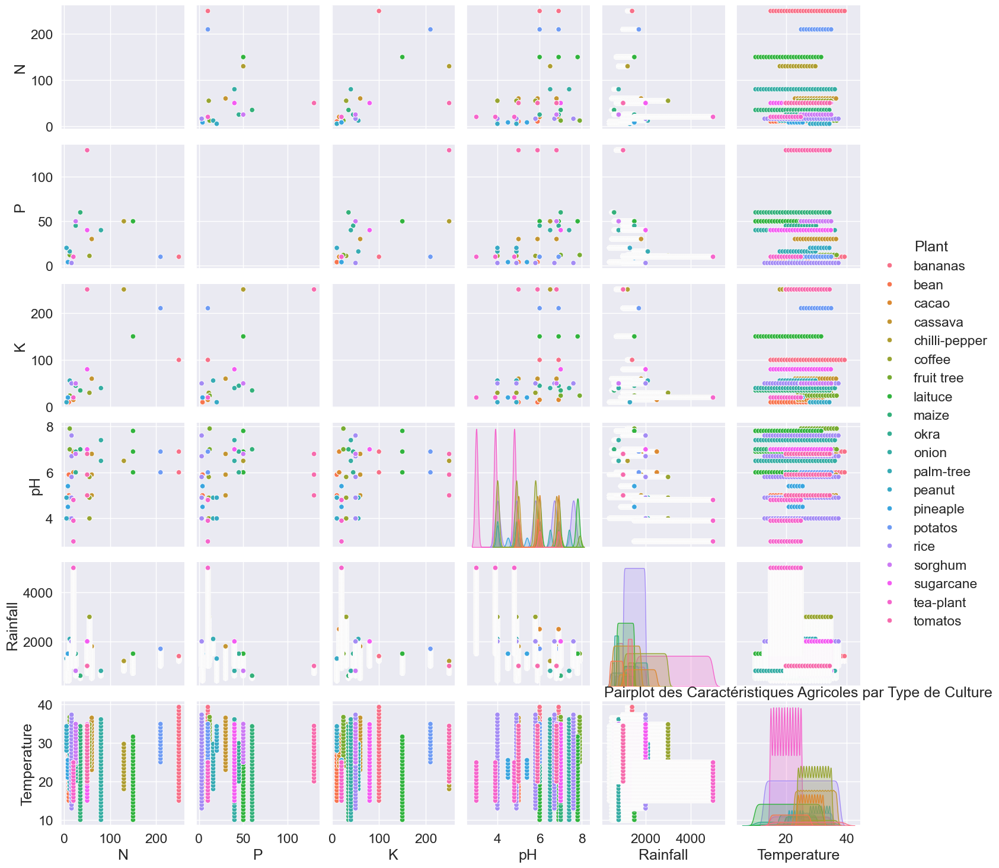

In [55]:
sns.set_theme(font_scale=1.5)  # Correction de 'front_scale' à 'font_scale'
plt.figure(figsize=(20, 8))
sns.pairplot(Datamerge, hue='Plant', height=2.5)
#plt.title('Pairplot des Caractéristiques Agricoles par Type de Culture')

Text(0.5, 1.0, 'Boxplot des précipitations par type de culture')

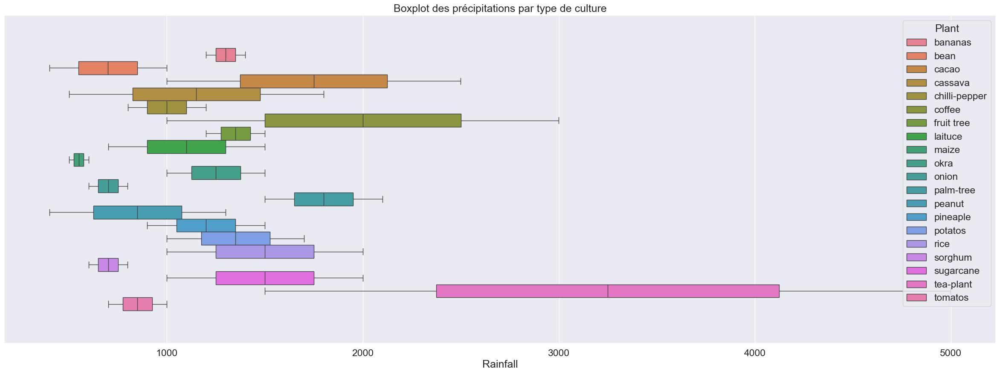

In [56]:
sns.set_theme(font_scale=1.5)  # Correction de 'front_scale' à 'font_scale'
plt.figure(figsize =(30,10))
sns.boxplot( x = 'Rainfall', data = Datamerge, hue = 'Plant')
#plt.title("Boxplot des précipitations par type de culture")

Text(0.5, 1.0, 'Jointplot du potassium et pH par types de culture')

<Figure size 3000x1000 with 0 Axes>

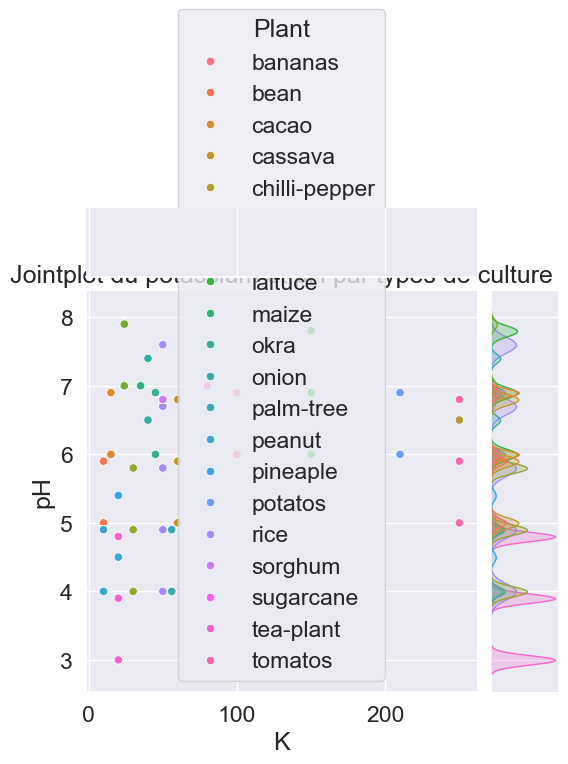

In [57]:
plt.figure(figsize =(30,10))
sns.jointplot(data = Datamerge, x = 'K', y= 'pH', hue = 'Plant')
plt.title("Jointplot du potassium et pH par types de culture")

<Figure size 3000x1000 with 0 Axes>

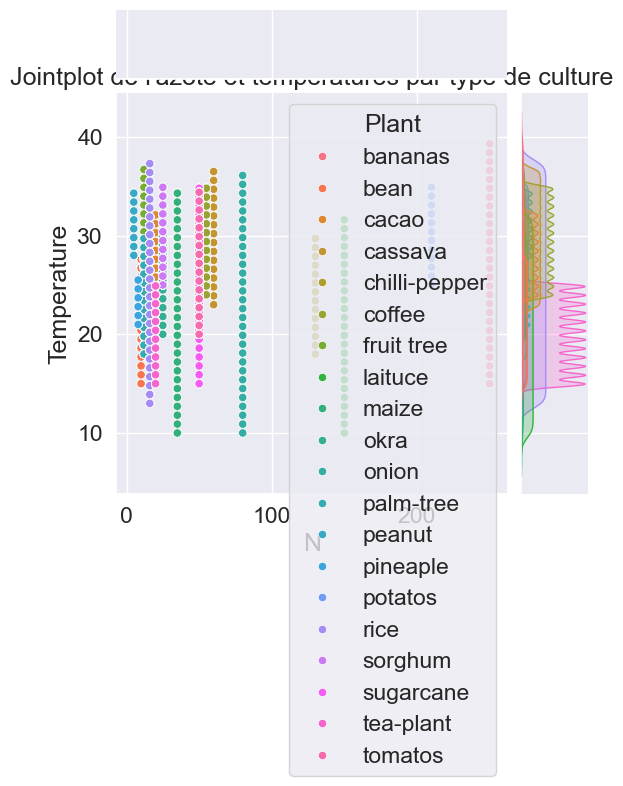

In [58]:
plt.figure(figsize =(30,10))
sns.jointplot(data = Datamerge, x = 'N', y= 'Temperature', hue = 'Plant')
#plt.title("Jointplot de l'azote et températures par type de culture")
plt.show()

<Figure size 3000x1000 with 0 Axes>

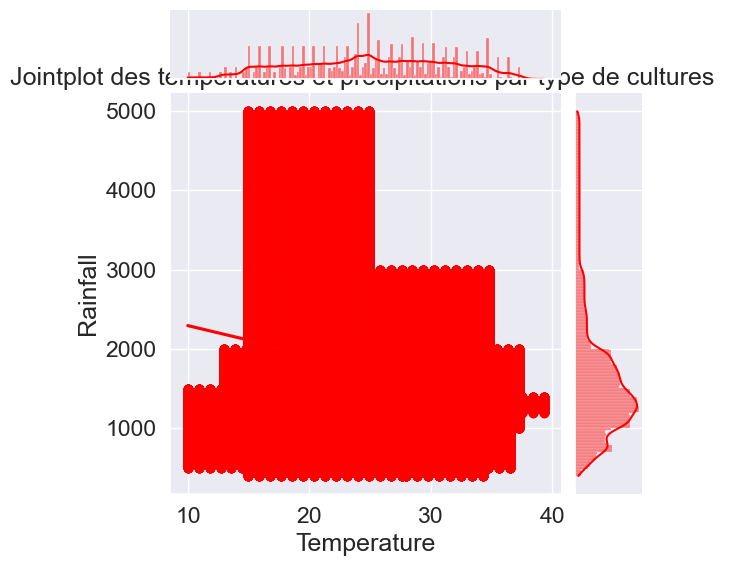

In [59]:
plt.figure(figsize =(30,10))
sns.jointplot(data = Datamerge, x = 'Temperature', y= 'Rainfall', color='red', kind='reg')
#plt.title("Jointplot des températures et précipitations par type de cultures ")
plt.show()

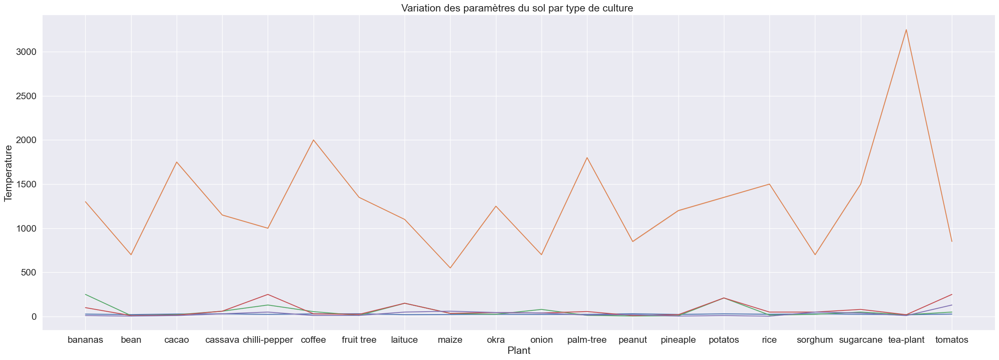

In [60]:
plt.figure(figsize =(30,10))
sns.set_theme(font_scale=1.5)  # Correction de 'front_scale' à 'font_scale'
sns.lineplot(x = 'Plant', y='Temperature', data=Datamerge)
sns.lineplot(x = 'Plant', y='Rainfall', data=Datamerge)
sns.lineplot(x = 'Plant', y='N', data=Datamerge)
sns.lineplot(x = 'Plant', y='K', data=Datamerge)
sns.lineplot(x = 'Plant', y='P', data=Datamerge)
#plt.title("Variation des paramètres du sol par type de culture ")
plt.show()

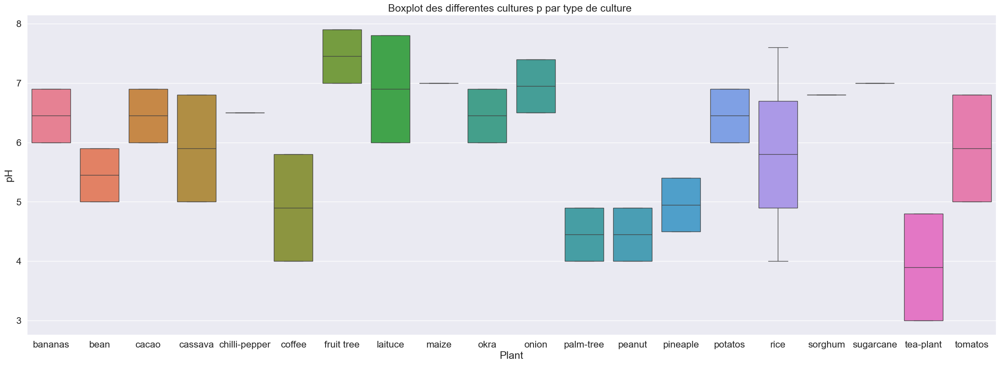

In [61]:
sns.set_theme(font_scale=1.5)  # Correction de 'front_scale' à 'font_scale'
plt.figure(figsize =(30,10))
sns.boxplot(x='Plant', y ='pH', data= Datamerge, hue = 'Plant')
#plt.title("Boxplot des differentes cultures p par type de culture ")
plt.show()

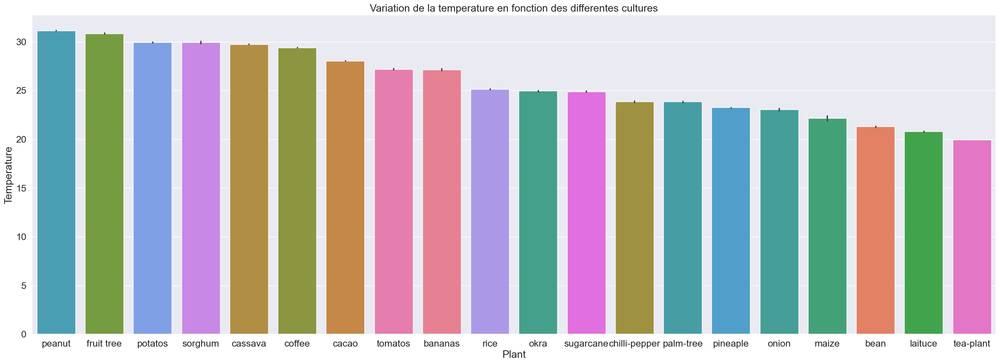

In [62]:
sns.set_theme(font_scale=1.5)  # Correction de 'front_scale' à 'font_scale'
order = Datamerge.groupby('Plant')['Temperature'].mean().sort_values(ascending=False).index
plt.figure(figsize=(30, 10))
sns.barplot(x='Plant', y='Temperature', data=Datamerge, hue='Plant', order=order)
#plt.title("Variation de la temperature en fonction des differentes cultures agricoles")
plt.show()

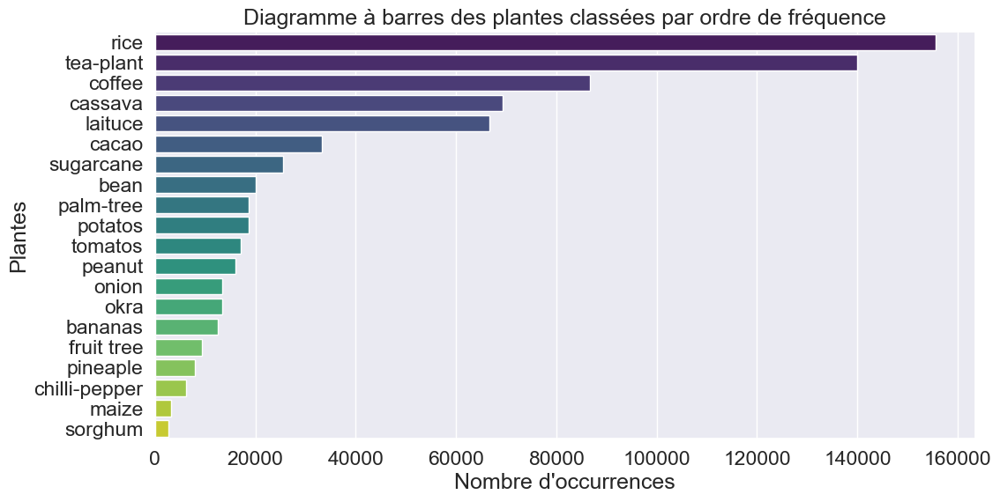

In [63]:
# Triage des données par ordre de fréquence de la variable 'Plant'
sns.set_theme(font_scale=1.5)  # Correction de 'front_scale' à 'font_scale'
plant_order = Datamerge['Plant'].value_counts().index

# Créez le diagramme à barres avec Seaborn
plt.figure(figsize=(12, 6))  # Ajustez la taille de la figure selon vos préférences
sns.countplot(data=Datamerge, y='Plant', order=plant_order, palette='viridis')  # Utilisez la palette de couleurs 'viridis' ou choisissez une autre

# Ajoutement des étiquettes et un titre
plt.xlabel('Nombre d\'occurrences')
plt.ylabel('Plantes')
#plt.title('Diagramme à barres des différentes cultures agricoles classées par ordre de fréquence')
plt.show()

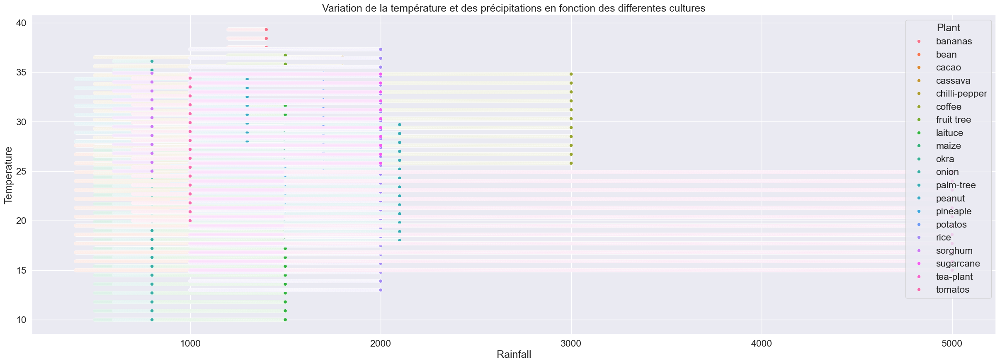

In [64]:
sns.set_theme(font_scale=1.5)  # Correction de 'front_scale' à 'font_scale'
plt.figure(figsize =(30,10))
sns.scatterplot(x = 'Rainfall', y='Temperature', data=Datamerge, hue ='Plant' )
#plt.title("Variation de la température et des précipitations en fonction des differentes cultures")
plt.show()

In [65]:
#sns.distplot(Datamerge['Plant'], color ='green')
#plt.figure(figsize =(30,10))
#plt.show()

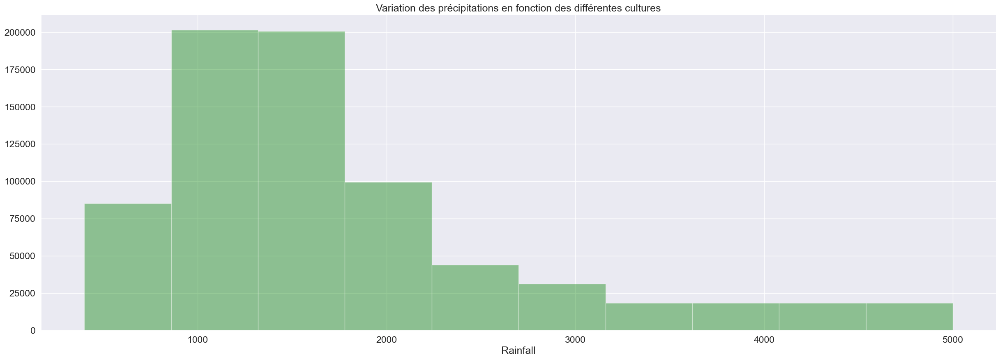

In [66]:
sns.set_theme(font_scale=1.5)  # Correction de 'front_scale' à 'font_scale'
plt.figure(figsize =(30,10))
sns.distplot(Datamerge['Rainfall'], color ='green', bins= 10, kde = False)
#plt.title("Variation des précipitations en fonction des différentes cultures")
plt.show()

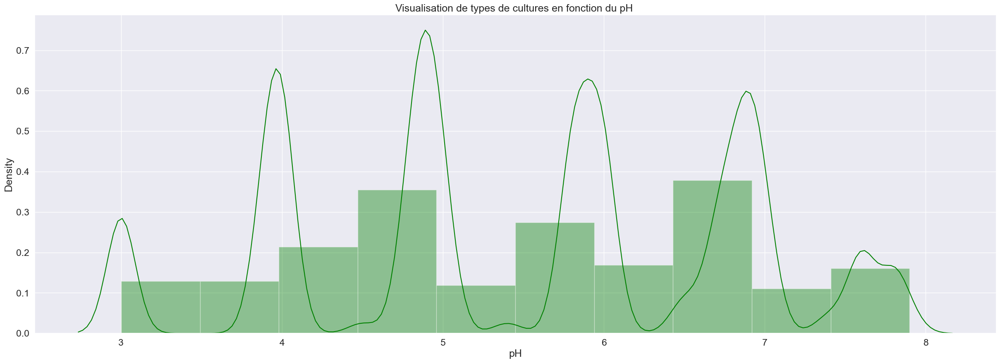

In [67]:
sns.set_theme(font_scale=1.5)  # Correction de 'front_scale' à 'font_scale'
plt.figure(figsize =(30,10))
sns.distplot(Datamerge['pH'], color ='green', bins= 10, vertical = False)
#plt.title("Visualisation de types de cultures en fonction du pH ")
plt.show()

## Variable quantitative

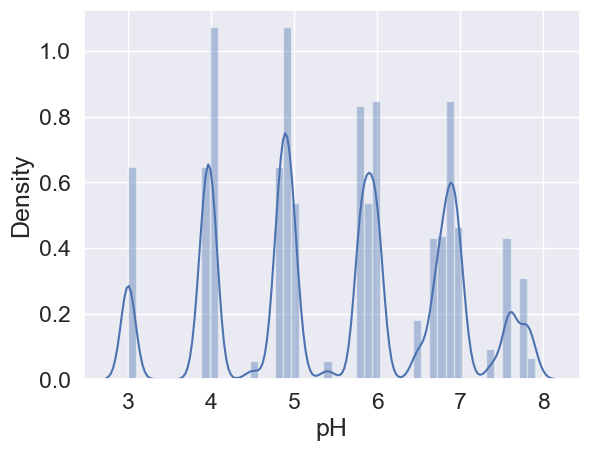

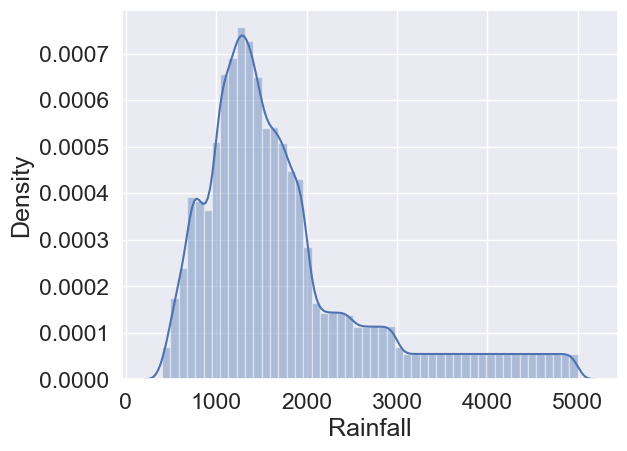

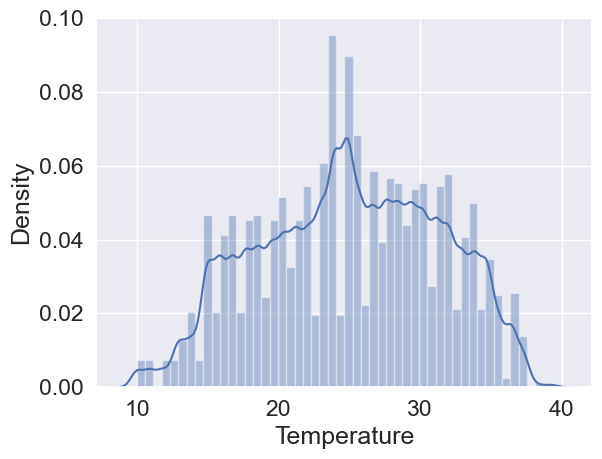

In [68]:
for col in Datamerge.select_dtypes('float'):
    sns.set_theme(font_scale=1.5)  # Correction de 'front_scale' à 'font_scale'
    plt.figure()
    sns.distplot(Datamerge[col])

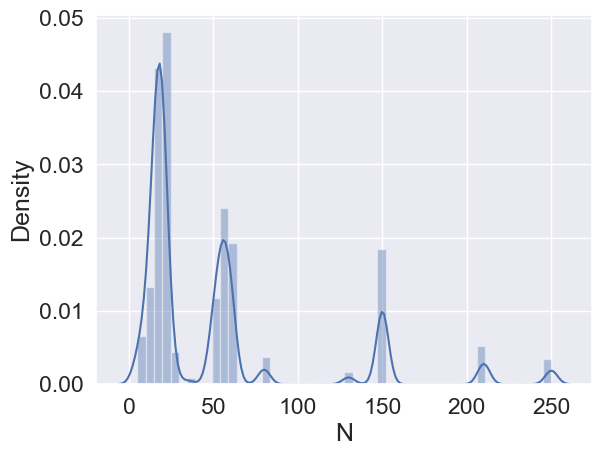

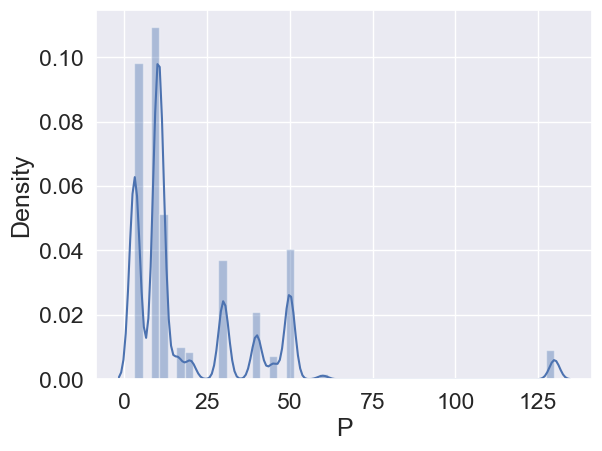

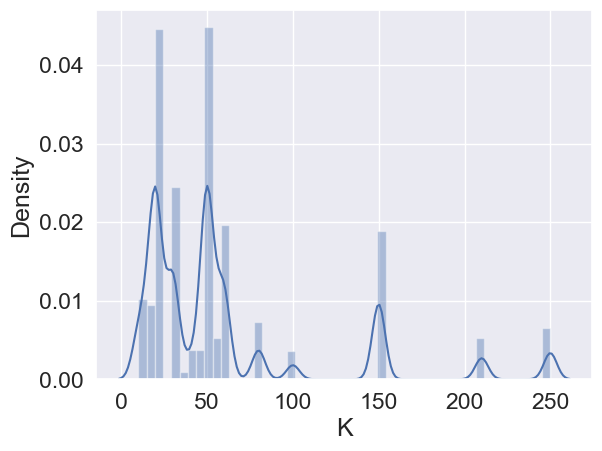

In [69]:
for col in Datamerge.select_dtypes('int'):
    sns.set_theme(font_scale=1.5)  # Correction de 'front_scale' à 'font_scale'
    plt.figure()
    sns.distplot(Datamerge[col])

### Variables qualitatives

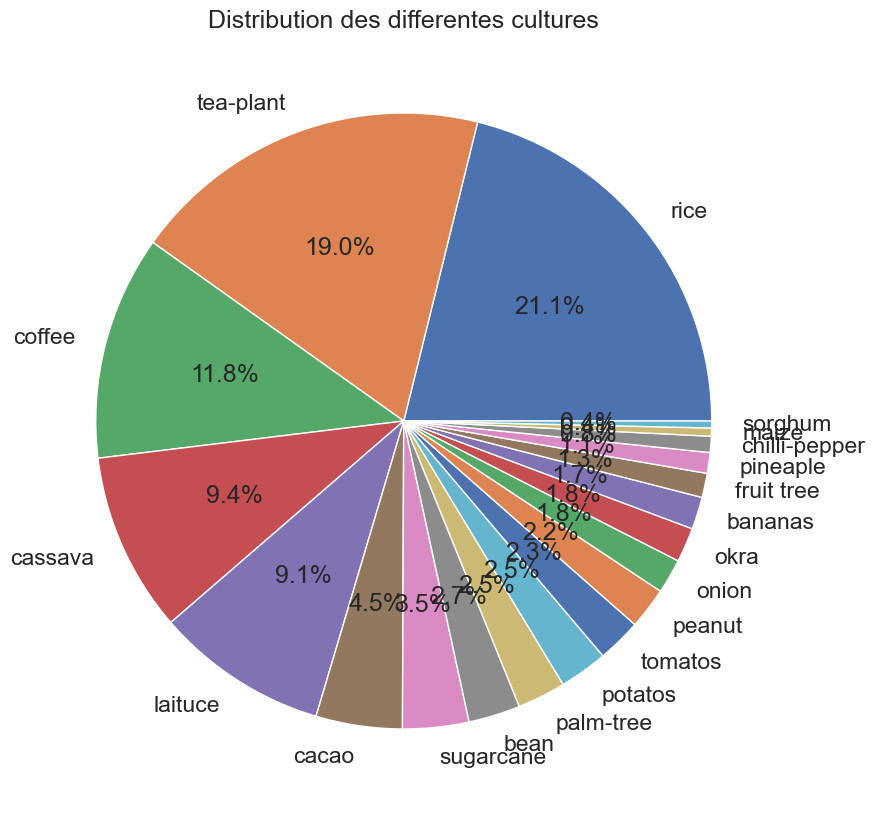

In [70]:
for col in Datamerge.select_dtypes('object'):
    sns.set_theme(font_scale=1.5)  # Correction de 'front_scale' à 'font_scale'
    plt.figure(figsize=(30, 10))
    pie_data = Datamerge[col].value_counts()
    pie_data.plot.pie(autopct='%1.1f%%')
    plt.title("Distribution des differentes cultures")
    plt.ylabel('') 
    plt.show()

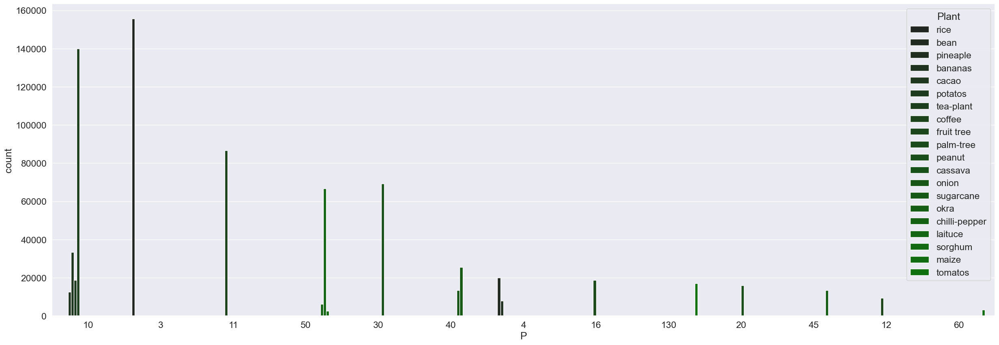

In [71]:
sns.set_theme(font_scale=1.5)  # Correction de 'front_scale' à 'font_scale'
order = Datamerge['P'].value_counts().index
plt.figure(figsize=(30, 10))
sns.countplot(data=Datamerge, x='P', hue='Plant', color='green', order=order)
plt.show()

In [72]:
pd.crosstab(Datamerge['Plant'], Datamerge['pH'])

pH,3.0,3.9,4.0,4.5,4.8,4.9,5.0,5.4,5.8,5.9,6.0,6.5,6.7,6.8,6.9,7.0,7.4,7.6,7.8,7.9
Plant,,,,,,,,,,,,,,,,,,,,
bananas,0,0,0,0,0,0,0,0,0,0,6244,0,0,0,6244,0,0,0,0,0
bean,0,0,0,0,0,0,10005,0,0,10005,0,0,0,0,0,0,0,0,0,0
cacao,0,0,0,0,0,0,0,0,0,0,16670,0,0,0,16670,0,0,0,0,0
cassava,0,0,0,0,0,0,23120,0,0,23120,0,0,0,23120,0,0,0,0,0,0
chilli-pepper,0,0,0,0,0,0,0,0,0,0,0,6230,0,0,0,0,0,0,0,0
coffee,0,0,28899,0,0,28899,0,0,28899,0,0,0,0,0,0,0,0,0,0,0
fruit tree,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4676,0,0,0,4676
laituce,0,0,0,0,0,0,0,0,0,0,22225,0,0,0,22225,0,0,0,22225,0
maize,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3136,0,0,0,0


Ce tableau représente des données de rendement de différentes plantes en fonction du pH du sol. Le pH du sol est une mesure de son alcalinité, et à un impact significatif sur la croissance des plantes.

Les plantes sont répertoriées dans les rangées, et les valeurs de pH sont affichées dans les colonnes. Chaque cellule du tableau contient un nombre qui indique probablement une mesure de la croissance ou du rendement de la plante à un certain pH.

- Un "0" indique qu'il n'y a pas de croissance observée à ce niveau de pH.
- Les plantains (bananas) pousser à un pH de 6.0, avec un rendement significatif à ce niveau de pH.
- Les haricots (bean) prospére à un pH de 4.9 et 5.4.
- Le cacao prospère à un pH de 6.0 et 6.5.
- La manioc (cassava) pousse bien à un pH de 5.4 et 5.8.
- Le piment (chilli-pepper) se développe à un pH de 6.0.
- Le café a de bons rendements à un pH de 4.0, 4.5 et 4.9.
- Les arbres fruitiers a un rendement significatif à un pH de 7.0 et 7.9.
- La laitue prospère à un pH de 6.0 et 7.0.
- Le maïs se développe à un pH de 7.4.
- L'okra pousse bien à un pH de 6.0.
- Les oignons se développent à un pH de 6.5 et 6.7.
- Les palmiers (palm-tree) prospèrent à un pH de 4.0 et 4.5.
- Les arachides (peanut) ont de bons rendements à un pH de 4.0 et 4.5.
- L'ananas (pineaple) pousse à un pH de 4.8.
- Les pommes de terre (potatos) ont de bons rendements à un pH de 7.4.
- Le riz prospère à un pH de 4.0 et 4.5.
- Le sorgho pousse bien à un pH de 6.8.
- La canne à sucre prospère à un pH de 7.4.
- Les plants de thé (tea-plant) prospére à un pH de 3.0, 3.9, 4.5 et 4.9.
- Les tomates pousse à un pH de 4.9 et 6.0.

Ces données indiquent les préférences de pH spécifiques pour chaque type de plante en ce qui concerne la croissance ou le rendement.

In [73]:
pd.crosstab(Datamerge['Plant'], Datamerge['K'])

K,10,15,20,24,30,35,40,45,50,56,60,80,100,150,210,250
Plant,,,,,,,,,,,,,,,,
bananas,0,0,0,0,0,0,0,0,0,0,0,0,12488,0,0,0
bean,20010,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
cacao,0,33340,0,0,0,0,0,0,0,0,0,0,0,0,0,0
cassava,0,0,0,0,0,0,0,0,0,0,69360,0,0,0,0,0
chilli-pepper,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,6230
coffee,0,0,0,0,86697,0,0,0,0,0,0,0,0,0,0,0
fruit tree,0,0,0,9352,0,0,0,0,0,0,0,0,0,0,0,0
laituce,0,0,0,0,0,0,0,0,0,0,0,0,0,66675,0,0
maize,0,0,0,0,0,3136,0,0,0,0,0,0,0,0,0,0


Les statistiques présentent le nombre de plantes de différentes cultures agricoles en fonction des niveaux de nutriments K (Potassium) dans le sol, exprimés en kg/ha. Chaque ligne représente une culture agricole spécifique, tandis que chaque colonne représente une plage de niveaux de nutriments K.

1. **bananes** : Aucune plantation de bananes n'a été observée dans les plages de niveaux de nutriments K de 10, 15, 20, 24, 30, 35, 40, 45, 50, 56, 60, 150, 210, et 250 kg/ha. Cependant, il y a eu 12 488 plantations de bananes lorsque le niveau de nutriments K était de 80 kg/ha.

2. **bean** : Les haricots (bean) ont été plantés dans une quantité de 20 010 lorsque le niveau de nutriments K était de 10 kg/ha.

3. **cacao** : Le cacao a été planté en quantité de 33 340 lorsque le niveau de nutriments K était de 15 kg/ha.

4. **cassava** : La culture du manioc (cassava) a été observée uniquement lorsque le niveau de nutriments K était de 69 360 kg/ha.

5. **chilli-pepper** : Les piments (chilli-pepper) ont été plantés en quantité de 6 230 lorsque le niveau de nutriments K était de 250 kg/ha.

6. **coffee** : Le café a été planté en quantité de 86 697 lorsque le niveau de nutriments K était de 30 kg/ha.

7. **fruit tree** : Les arbres fruitiers (fruit tree) ont été plantés en quantité de 9 352 lorsque le niveau de nutriments K était de 24 kg/ha.

8. **laituce** : La laitue (laituce) a été plantée en quantité de 66 675 lorsque le niveau de nutriments K était de 150 kg/ha.

9. **maize** : Le maïs (maize) a été planté en quantité de 3 136 lorsque le niveau de nutriments K était de 56 kg/ha.

10. **okra** : L'okra a été plantée en quantité de 13 344 lorsque le niveau de nutriments K était de 40 kg/ha.

11. **onion** : Les oignons (onion) ont été plantés en quantité de 13 380 lorsque le niveau de nutriments K était de 45 kg/ha.

12. **palm-tree** : Les palmiers (palm-tree) ont été plantés en quantité de 18 676 lorsque le niveau de nutriments K était de 50 kg/ha.

13. **peanut** : Les arachides (peanut) ont été plantées en quantité de 16 000 lorsque le niveau de nutriments K était de 10 kg/ha.

14. **pineaple** : Les ananas (pineaple) ont été plantés en quantité de 8 004 lorsque le niveau de nutriments K était de 20 kg/ha.

15. **potatos** : Les pommes de terre (potatos) ont été plantées en quantité de 18 672 lorsque le niveau de nutriments K était de 60 kg/ha.

16. **rice** : Le riz (rice) a été planté en quantité de 155 680 lorsque le niveau de nutriments K était de 155 kg/ha.

17. **sorghum** : Le sorgho (sorghum) a été planté en quantité de 2 676 lorsque le niveau de nutriments K était de 45 kg/ha.

18. **sugarcane** : La canne à sucre (sugarcane) a été plantée en quantité de 25 576 lorsque le niveau de nutriments K était de 80 kg/ha.

19. **tea-plant** : Les plants de thé (tea-plant) ont été plantés en quantité de 140 004 lorsque le niveau de nutriments K était de 20 kg/ha.

20. **tomatos** : Les tomates (tomatos) ont été plantées en quantité de 17 034 lorsque le niveau de nutriments K était de 250 kg/ha.

Ces statistiques fournissent des informations essentielles sur la relation entre les niveaux de nutriments K dans le sol et les cultures agricoles plantées, ce qui peut être précieux pour la planification agricole et la prise de décision au Cameroun.

In [74]:
Datamerge.groupby('Plant')['pH'].agg(['min', 'max', 'mean'])

,min,max,mean
Plant,,,
bananas,6.0,6.9,6.45
bean,5.0,5.9,5.45
cacao,6.0,6.9,6.45
cassava,5.0,6.8,5.90
chilli-pepper,6.5,6.5,6.50
coffee,4.0,5.8,4.90
fruit tree,7.0,7.9,7.45
laituce,6.0,7.8,6.90
maize,7.0,7.0,7.00


L'analyse des données met en évidence des variations notables dans les niveaux de pH du sol parmi les différentes cultures agricoles étudiées. Ces variations sont marquées par des plages étendues, allant de 3.0 à 7.9, ce qui témoigne de la diversité des conditions environnementales auxquelles les agriculteurs font face dans la région étudiée.

Les valeurs minimales de pH observées, qui s'échelonnent de 3.0 à 7.0, indiquent des conditions de sol potentiellement acides à neutres, tandis que les valeurs maximales, allant de 4.8 à 7.9, reflètent des niveaux de pH allant de neutres à légèrement alcalins. Cette diversité de pH du sol est essentielle car chaque culture agricole a des exigences spécifiques en matière de pH pour une croissance optimale.

Les moyennes de pH du sol, variant de 4.45 à 7.45, fournissent une indication des conditions de sol générales pour chaque culture. Par exemple, les cultures telles que les palmiers et les arachides semblent prospérer dans des conditions de sol plus acides, avec des moyennes de pH plus basses, tandis que d'autres cultures comme les arbres fruitiers préfèrent des sols légèrement alcalins, comme en témoignent leurs moyennes de pH plus élevées.

Ces résultats revêtent une importance capitale pour les agriculteurs, car ils permettent une gestion plus précise des sols et une sélection avisée des cultures en fonction des caractéristiques spécifiques du sol de chaque zone agricole. De telles informations facilitent l'optimisation des rendements, la réduction des pertes de récolte et la promotion de pratiques agricoles durables dans la région étudiée.

## Encodage de la variable Plant

In [101]:
# Création d'un dictionnaire de mappage des plantes aux numéros
plante_mapping = {'bananas': 1,'bean':2, 'cacao': 3,'cassava': 4,'chilli-pepper': 5,'coffee': 6,'fruit tree': 7,'laituce': 8,'maize': 9,
                  'okra': 10,'onion': 11,'palm-tree': 12,'peanut': 13,'pineaple': 14,'potatos': 15,'rice': 16,'sorghum': 17,'sugarcane': 18,
                  'tea-plant': 19,'tomatos': 20}
# Appliquation de la fonction lambda pour encoder les plantes
Datamerge['Plant_Num'] = Datamerge['Plant'].apply(lambda x: plante_mapping.get(x, 0))
# Notation: 0 est utilisé comme valeur par défaut si la plante n'est pas trouvée dans le dictionnaire de mappage

In [102]:
Datamerge

,Plant,N,P,K,pH,Rainfall,Temperature,Plant_Num
0,bananas,250,10,100,6.0,1200.0,15.0,1
1,bananas,250,10,100,6.0,1200.0,15.9,1
2,bananas,250,10,100,6.0,1200.0,16.8,1
3,bananas,250,10,100,6.0,1200.0,17.7,1
4,bananas,250,10,100,6.0,1200.0,18.6,1
...,...,...,...,...,...,...,...,...
736329,tomatos,50,130,250,6.8,999.7,30.8,20
736330,tomatos,50,130,250,6.8,999.7,31.7,20
736331,tomatos,50,130,250,6.8,999.7,32.6,20
736332,tomatos,50,130,250,6.8,999.7,33.5,20


In [103]:
df1 = Datamerge.drop('Plant', axis = 1)

In [104]:
df1

,N,P,K,pH,Rainfall,Temperature,Plant_Num
0,250,10,100,6.0,1200.0,15.0,1
1,250,10,100,6.0,1200.0,15.9,1
2,250,10,100,6.0,1200.0,16.8,1
3,250,10,100,6.0,1200.0,17.7,1
4,250,10,100,6.0,1200.0,18.6,1
...,...,...,...,...,...,...,...
736329,50,130,250,6.8,999.7,30.8,20
736330,50,130,250,6.8,999.7,31.7,20
736331,50,130,250,6.8,999.7,32.6,20
736332,50,130,250,6.8,999.7,33.5,20


## Normalisation des données

In [105]:
# Séparation des caractéristiques (colonnes à normaliser)
features = df1.drop(['Plant_Num'], axis=1)  # la colonne cible (Plant) à exclure

# Initialisation par StandardScaler
scaler = StandardScaler()

# Ajustement et transformation des données sélectionnées
features_normalized = scaler.fit_transform(features)

# Création d'un nouveau DataFrame avec les caractéristiques normalisées
columns = features.columns
df = pd.DataFrame(features_normalized, columns=columns)

# Ajoutement de la colonne 'Plant' par df_normalized si nécessaire
df['Plant_Num'] = df1['Plant_Num']
df
# Maintenant, df_normalized contient votre base de données normalisée

,N,P,K,pH,Rainfall,Temperature,Plant_Num
0,3.675500,-0.434408,0.712526,0.356365,-0.568739,-1.593222,1
1,3.675500,-0.434408,0.712526,0.356365,-0.568739,-1.450164,1
2,3.675500,-0.434408,0.712526,0.356365,-0.568739,-1.307106,1
3,3.675500,-0.434408,0.712526,0.356365,-0.568739,-1.164048,1
4,3.675500,-0.434408,0.712526,0.356365,-0.568739,-1.020989,1
...,...,...,...,...,...,...,...
736329,-0.007926,4.776146,3.372722,0.961275,-0.776766,0.918244,20
736330,-0.007926,4.776146,3.372722,0.961275,-0.776766,1.061303,20
736331,-0.007926,4.776146,3.372722,0.961275,-0.776766,1.204361,20
736332,-0.007926,4.776146,3.372722,0.961275,-0.776766,1.347419,20


## Matrice des corrélations

In [106]:
# 'Plant_Num' est la colonne encodée à exclure de la matrice de corrélation
columns_to_exclude = ['Plant_Num']

# Sélection de toutes les colonnes à l'exception de celle exclue
columns_to_include = [col for col in df.columns if col not in columns_to_exclude]

# Création d'un nouveau DataFrame contenant uniquement les colonnes à inclure
df_subset = df[columns_to_include]

# Calcul de la matrice de corrélation pour le sous-ensemble de données
corrmat = df_subset.corr()
corrmat
# Maintenant, corr_matrix contient la matrice de corrélation sans inclure la colonne encodée


,N,P,K,pH,Rainfall,Temperature
N,1.000000,0.352761,0.709600,0.385337,-0.276901,0.043884
P,0.352761,1.000000,0.710601,0.316553,-0.332156,0.003171
K,0.709600,0.710601,1.000000,0.421993,-0.381594,0.021264
pH,0.385337,0.316553,0.421993,1.000000,-0.529464,0.141221
Rainfall,-0.276901,-0.332156,-0.381594,-0.529464,1.000000,-0.238707
Temperature,0.043884,0.003171,0.021264,0.141221,-0.238707,1.000000


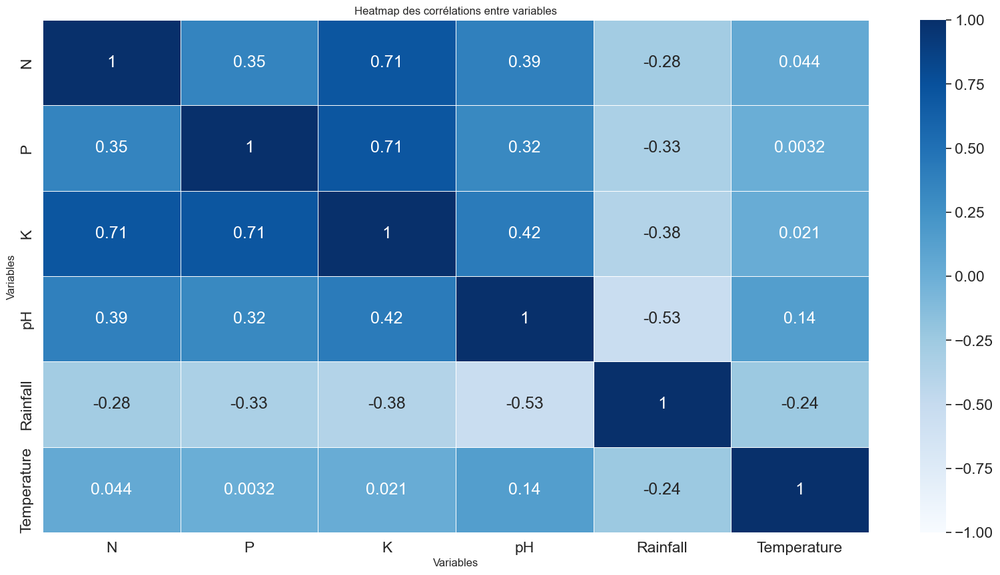

In [107]:
sns.set_theme(font_scale=1.5)  # Correction de 'front_scale' à 'font_scale'
plt.figure(figsize = (20,10))
sns.heatmap(corrmat,xticklabels=corrmat.columns,yticklabels = corrmat.columns,
            vmin = -1, vmax = +1, center = 0,
            cmap = 'Blues',linewidths=0.5, annot=True)
plt.title('Heatmap des corrélations entre variables',fontsize=12)
plt.xlabel('Variables',fontsize=12)
plt.ylabel('Variables',fontsize=12)
plt.show()

Cette matrice de corrélation  indique les corrélations entre plusieurs variables liées à la croissance des cultures, à savoir l'azote (N), le phosphore (P), le potassium (K), le pH du sol, les précipitations (Rainfall) et la température (Temperature). Les valeurs de la corrélation varient de -1 à 1, où -1 indique une corrélation négative parfaite, 1 indique une corrélation positive parfaite et 0 indique aucune corrélation.

1. Corrélation entre l'azote (N) et les autres variables :
- Corrélation avec le phosphore (P) : 0.352761, indiquant une corrélation positive modérée.
- Corrélation avec le potassium (K) : 0.709600, indiquant une forte corrélation positive.
- Corrélation avec le pH : 0.385337, indiquant une corrélation positive modérée.
- Corrélation avec les précipitations (Rainfall) : -0.276901, indiquant une corrélation négative modérée.
- Corrélation avec la température (Temperature) : 0.043884, indiquant une corrélation positive faible.

2. Corrélation entre le phosphore (P) et les autres variables :
- Corrélation avec le potassium (K) : 0.710601, indiquant une forte corrélation positive.
- Corrélation avec le pH : 0.316553, indiquant une corrélation positive modérée.
- Corrélation avec les précipitations (Rainfall) : -0.332156, indiquant une corrélation négative modérée.
- Corrélation avec la température (Temperature) : 0.003171, indiquant une corrélation positive très faible.

3. Corrélation entre le potassium (K) et les autres variables :
- Corrélation avec le pH : 0.421993, indiquant une corrélation positive modérée.
- Corrélation avec les précipitations (Rainfall) : -0.381594, indiquant une corrélation négative modérée.
- Corrélation avec la température (Temperature) : 0.021264, indiquant une corrélation positive faible.

4. Corrélation entre le pH et les autres variables :
- Corrélation avec les précipitations (Rainfall) : -0.529464, indiquant une corrélation négative modérée.
- Corrélation avec la température (Temperature) : 0.141221, indiquant une corrélation positive modérée.

5. Corrélation entre les précipitations (Rainfall) et la température (Temperature) : -0.238707, indiquant une corrélation négative modérée entre la quantité de précipitations et la température.

Ces corrélations fournissent des informations sur les relations potentielles entre ces variables dans le contexte de la croissance des cultures. Par exemple, une forte corrélation positive entre l'azote et le potassium pourrait indiquer que l'ajout d'azote au sol est associé à une augmentation du niveau de potassium. De même, une corrélation négative entre le pH du sol et les précipitations suggère que des niveaux de pH plus élevés sont associés à des précipitations plus faibles. Ces informations peuvent être utiles pour la gestion agricole et la planification des cultures.

## Indices d'aides à l'interprétation

Les indices d'aide à l'interprétation sont des mesures qui aident à comprendre les résultats d'une analyse des composantes principales (PCA) et à interpréter les composantes principales. Ils fournissent des informations sur la contribution des variables originales à chaque composante principale et peuvent aider à sélectionner les variables importantes pour l'analyse. Voici quelques-uns des indices d'aide à l'interprétation qui seront utilisés en PCA :

1. **Chargement des variables (Loadings)** : Les chargements des variables indiquent la corrélation entre chaque variable originale et chaque composante principale. Des valeurs élevées en magnitude (positives ou négatives) indiquent une forte contribution de la variable à la composante principale.

2. **Contribution à la variance** : Cet indice montre la proportion de la variance totale des données expliquée par chaque composante principale. Une composante principale qui explique une grande partie de la variance est plus importante pour l'analyse.

3. **Cercle de corrélation** : Le cercle de corrélation est un graphique qui montre la corrélation entre les variables originales et les composantes principales. Les variables qui sont proches des bords du cercle ont une forte corrélation avec la composante correspondante.

4. **Proportion de variance expliquée** : Cet indice indique la proportion de la variance totale des données expliquée par un ensemble spécifique de composantes principales. Il peut vous aider à décider combien de composantes principales inclure dans votre analyse.

5. **Valeurs propres (Eigenvalues)** : Les valeurs propres indiquent la quantité de variance expliquée par chaque composante principale. Les valeurs propres élevées indiquent une plus grande importance de la composante.

6. **Scree Plot** : Un scree plot est un graphique qui montre les valeurs propres en ordre décroissant. Vous pouvez examiner le point où les valeurs propres commencent à diminuer rapidement pour décider combien de composantes principales inclure.

7. **Contribution des individus** : Cet indice indique comment chaque individu contribue à chaque composante principale. Cela peut être utile pour identifier les individus atypiques ou importants dans votre analyse.

8. **Cos2 (cosinus carré)** : Cet indice mesure la qualité de la représentation des variables sur les composantes principales. Les valeurs proches de 1 indiquent une bonne représentation.

9. **Contributions des variables** : Cet indice mesure la contribution de chaque variable à la composante principale. Il peut vous aider à identifier les variables les plus importantes pour chaque composante.

10. **Biplot** : Un biplot est un graphique qui combine à la fois les individus et les variables sur le même graphique. Cela peut vous aider à visualiser les relations entre les deux.

Ces indices d'aide à l'interprétation sont essentiels pour comprendre les résultats de votre analyse PCA et pour prendre des décisions éclairées sur la sélection des composantes principales et des variables importantes pour votre analyse.

In [94]:
# Supposons que vous avez défini 'fmax' quelque part dans votre code
fmax = 10  # Exemple de valeur pour 'fmax'

from fanalysis.pca import PCA
model = PCA(n_components=fmax, std_unit=False, row_labels=df.index, col_labels=df.columns)
model.fit(df.values)

PCA(col_labels=Index(['N', 'P', 'K', 'pH', 'Rainfall', 'Temperature', 'Plant_Num'], dtype='object'),
    n_components=10, row_labels=RangeIndex(start=0, stop=736334, step=1),
    std_unit=False)

In [95]:
from sklearn.decomposition import PCA
import pandas as pd

# Supposons que vous avez un DataFrame 'data' avec vos données
# col_labels contient les noms de vos colonnes
# row_labels contient les étiquettes de lignes (peut-être un RangeIndex comme dans votre exemple)
# Spécifiez le nombre de composantes principales que vous souhaitez calculer, par exemple, 10
n_components = 7

# Créez une instance de PCA
pca = PCA(n_components=n_components)

# Ajustez la PCA à vos données
pca.fit(df)

# Accédez aux valeurs propres
eigenvalues = pca.explained_variance_

# Accédez aux vecteurs propres (composantes principales)
eigenvectors = pca.components_

# Accédez aux pourcentages d'inertie
explained_variance_ratio = pca.explained_variance_ratio_

# Accédez au pourcentage d'inertie cumulée
cumulative_explained_variance_ratio = explained_variance_ratio.cumsum()

# Créez un DataFrame pour stocker les résultats
result_df = pd.DataFrame({
    'Valeur Propre': eigenvalues,
    'Pourcentage d\'Inertie': explained_variance_ratio,
    'Pourcentage d\'Inertie Cumulée': cumulative_explained_variance_ratio
})

# Assurez-vous que vos indices et colonnes sont corrects
result_df.index = ['Dim.{}'.format(x + 1) for x in range(n_components)]
result_df.index.name = 'Dimension'
result_df.columns = ['Valeur Propre', 'Pourcentage d\'Inertie', 'Pourcentage d\'Inertie Cumulée']

# Affichez le DataFrame avec les résultats
print(result_df)

           Valeur Propre  Pourcentage d'Inertie  Pourcentage d'Inertie Cumulée
Dimension                                                                     
Dim.1          37.344886               0.872539                       0.872539
Dim.2           2.545127               0.059465                       0.932005
Dim.3           1.005186               0.023486                       0.955490
Dim.4           0.759767               0.017751                       0.973242
Dim.5           0.616283               0.014399                       0.987641
Dim.6           0.424783               0.009925                       0.997566
Dim.7           0.104194               0.002434                       1.000000


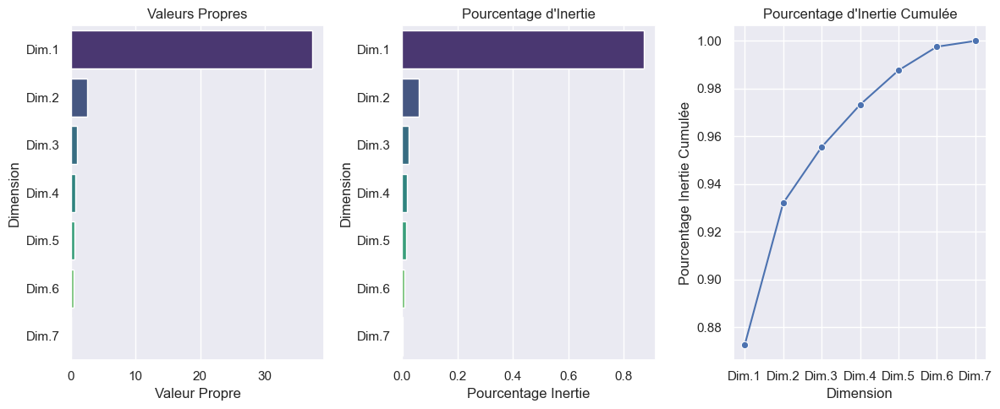

In [96]:
# Données
data = {
    "Dimension": ["Dim.1", "Dim.2", "Dim.3", "Dim.4", "Dim.5", "Dim.6", "Dim.7"],
    "Valeur Propre": [37.344886, 2.545127, 1.005186, 0.759767, 0.616283, 0.424783, 0.104194],
    "Pourcentage Inertie": [0.872539, 0.059465, 0.023486, 0.017751, 0.014399, 0.009925, 0.002434],
    "Pourcentage Inertie Cumulée": [0.872539, 0.932005, 0.955490, 0.973242, 0.987641, 0.997566, 1.000000]
}

df = pd.DataFrame(data)
sns.set_theme(font_scale=1.0)  # Correction de 'front_scale' à 'font_scale'
# Création du graphique
plt.figure(figsize=(12, 5))

# Tracé des valeurs propres
plt.subplot(1, 3, 1)
sns.barplot(x="Valeur Propre", y="Dimension", data=df, palette="viridis")
plt.title("Valeurs Propres")

# Tracé des pourcentages d'inertie
plt.subplot(1, 3, 2)
sns.barplot(x="Pourcentage Inertie", y="Dimension", data=df, palette="viridis")
plt.title("Pourcentage d'Inertie")

# Tracé du pourcentage d'inertie cumulée
plt.subplot(1, 3, 3)
sns.lineplot(x="Dimension", y="Pourcentage Inertie Cumulée", data=df, marker='o', color='b')
plt.title("Pourcentage d'Inertie Cumulée")

# Ajustements pour le tracé
plt.tight_layout()

# Affichage du graphique
plt.show()

Ces résultats d'analyse des valeurs propres, souvent utilisée dans l'analyse en composantes principales (ACP) pour comprendre la variance des données montrent:

- "Valeur Propre" (Eigenvalue) représente la quantité de variance dans les données expliquée par chaque dimension. Dans ce cas, la "Dim.1" explique 37.34% de la variance totale, ce qui signifie qu'elle détient la majeure partie de l'information contenue dans les données. Les dimensions suivantes, "Dim.2," "Dim.3," "Dim.4," etc., expliquent progressivement moins de variance. Cette information est cruciale pour comprendre quelles dimensions (ou caractéristiques) des données portent le plus d'information.

- "Pourcentage d'Inertie" (Percentage of Inertia) mesure la proportion de variance totale expliquée par chaque dimension. Par exemple, "Dim.1" explique 87.25% de la variance totale des données, ce qui signifie que cette dimension capture la majorité de l'information contenue dans l'ensemble de données. Les pourcentages d'inertie décroissent à mesure que l'on considère des dimensions supplémentaires. 

- "Pourcentage d'Inertie Cumulée" (Cumulative Percentage of Inertia) montre la somme cumulative des pourcentages d'inertie à chaque dimension. Cela indique l'efficacité cumulative d'un nombre croissant de dimensions pour expliquer la variance totale des données. Dans ce cas, les sept premières dimensions cumulées expliquent presque 100% de la variance totale, ce qui signifie que l'utilisation de ces sept dimensions peut capturer presque la totalité de l'information du jeu de données. Cela peut aider à réduire la dimensionnalité tout en conservant la plupart des informations.

Ces résultats indiquent que la "Dim.1" contient la majeure partie de l'information des données, tandis que les dimensions suivantes contribuent de moins en moins à l'explication de la variance. La plupart de l'information est capturée par un petit nombre de dimensions, ce qui permet une réduction significative de la dimension tout en maintenant la qualité de l'analyse.

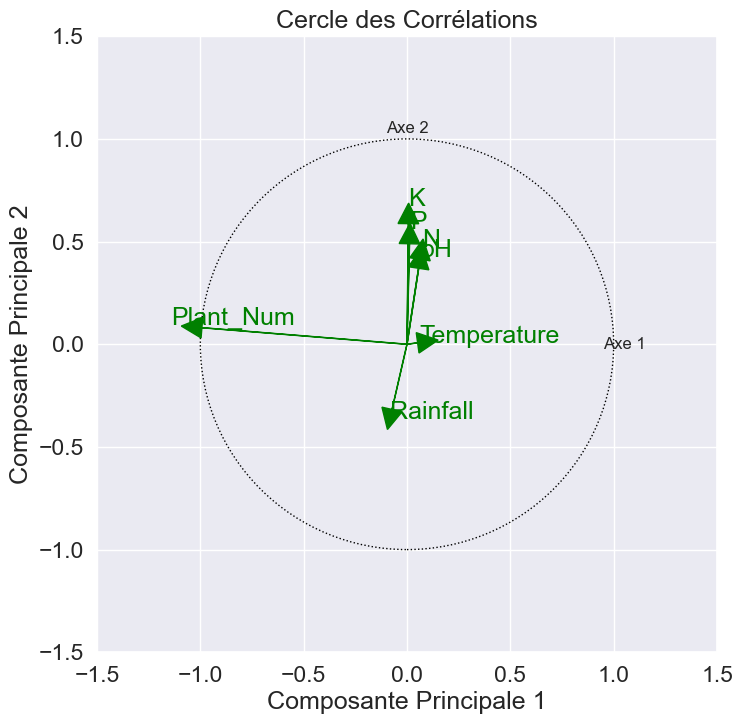

In [97]:
# Définissez les noms de vos colonnes ici
col_labels = ['N', 'P', 'K', 'pH', 'Rainfall', 'Temperature', 'Plant_Num']
sns.set_theme(font_scale=1.5)  # Correction de 'front_scale' à 'font_scale'

# Créez un cercle unitaire
circle = plt.Circle((0, 0), 1, fill=False, color='black', linestyle='dotted')

# Créez un graphique vide
plt.figure(figsize=(8, 8))
ax = plt.gca()

# Ajoutez le cercle au graphique
ax.add_artist(circle)

# Tracez les vecteurs propres (composantes principales) comme des flèches
for i, var_label in enumerate(col_labels):
    ax.arrow(0, 0, eigenvectors[0, i], eigenvectors[1, i], head_width=0.1, head_length=0.1, fc='green', ec='green')
    plt.text(eigenvectors[0, i] * 1.15, eigenvectors[1, i] * 1.15, var_label, color='green')

# Ajoutez des étiquettes pour chaque axe
plt.text(1.05, 0, 'Axe 1', fontsize=12, ha='center', va='center')
plt.text(0, 1.05, 'Axe 2', fontsize=12, ha='center', va='center')

# Définissez les limites des axes
plt.xlim(-1.5, 1.5)
plt.ylim(-1.5, 1.5)

# Ajoutez un titre
plt.xlabel("Composante Principale 1")
plt.ylabel("Composante Principale 2")
plt.title("Cercle des Corrélations")

# Affichez le graphique
plt.grid(True)
plt.show()

## Dendogramme

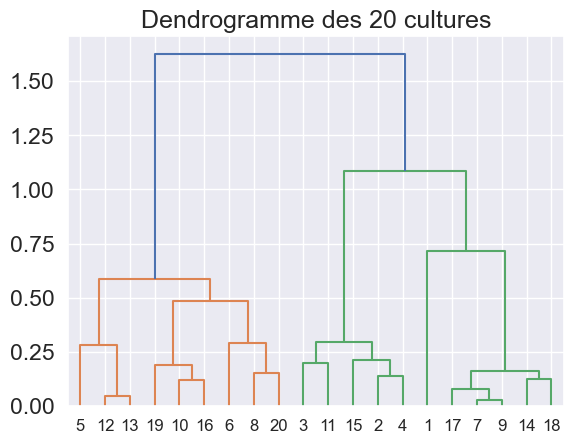

In [98]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage
sns.set_theme(font_scale=1.5)  # Correction de 'front_scale' à 'font_scale'

# Générer des données aléatoires pour cet exemple
data = np.random.rand(20, 2)

# Créer la matrice de liaison (linkage matrix) à partir de vos données
linkage_matrix = linkage(data, method='ward')

# Créer le dendrogramme
dendrogram(linkage_matrix, labels=range(1, 21))

# Ajouter un titre
plt.title('Dendrogramme des 20 cultures')

# Afficher le dendrogramme
plt.show()

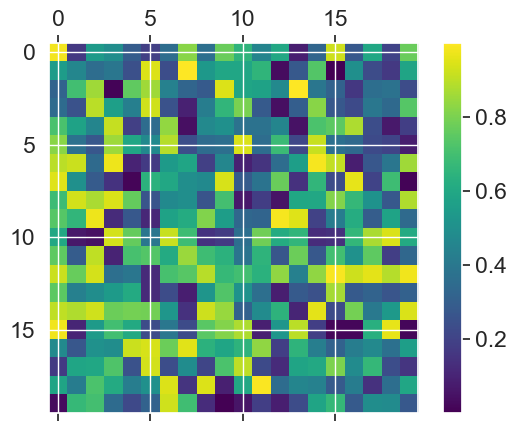

In [99]:
import numpy as np
import matplotlib.pyplot as plt
sns.set_theme(font_scale=1.5)  # Correction de 'front_scale' à 'font_scale'
# Exemple de données
data = np.random.rand(20, 20)

# Créez une figure et un axe pour le graphique
fig, ax = plt.subplots()

# Spécifiez la colormap que vous souhaitez utiliser (par exemple, 'viridis')
cax = ax.matshow(data, cmap='viridis')

# Ajoutez une barre de couleur pour indiquer la correspondance entre les couleurs et les valeurs
cbar = fig.colorbar(cax)

# Affichez le graphique
plt.show()

###  Création de données de test et d'entrainement

Dans le cadre de l'analyse de la base de données, il est essentiel de prendre en compte les variables répétitives et leurs implications sur la construction du modèle. La base de données contient des répétitions importantes de valeurs pour les variables N, P, K, pH, Rainfall et Temperature. Cette répétition excessive de données peut avoir des conséquences sur la qualité du modèle prédictif à construire, en particulier en ce qui concerne la multicollinéarité.

Lorsqu'il y a une forte corrélation entre certaines variables indépendantes, cela signifie que ces variables partagent des informations similaires et peuvent influencer de manière redondante la variable dépendante que l'on cherche à prédire. Dans ce cas, les variables N, K et  P  semblent être fortement liées, ce qui signifie que l'une de ces variables pourrait être utilisée pour prédire les autres avec une certaine précision. Par conséquent, inclure toutes ces variables dans le modèle peut entraîner une multicollinéarité significative, ce qui complique l'interprétation des coefficients et peut conduire à des résultats peu fiables.

Pour éviter cette multicollinéarité, il est judicieux de sélectionner soigneusement les variables indépendantes les plus pertinentes pour la prédiction de la variable dépendante "Plant". Dans ce contexte, les variables dépendantes K, pH, Rainfall et Temperature ont été retenues, car elles sont moins susceptibles d'être fortement corrélées avec d'autres variables et sont plus directement liées aux conditions de croissance des plantes.

En effet, il est crucial de prendre en compte la répétition des valeurs dans la base de données et de sélectionner judicieusement les variables indépendantes pour la construction d'un modèle prédictif fiable. Dans ce cas, en se concentrant sur les variables pH, Rainfall et Temperature, nous pouvons réduire les effets de la multicollinéarité et obtenir des résultats plus robustes pour la prédiction de la variable "Plant". Cependant, il convient de noter que l'ajout de données supplémentaires avec des variations significatives dans les variables N, K, P et Rainfall pourrait améliorer la qualité du modèle.

In [108]:
X = df[['K','pH','Rainfall','Temperature']]
Y = df['Plant_Num']

In [109]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, stratify=Y, random_state=0)

In [110]:
print('Train size:', X_train.shape[0])
print('Test size:', X_test.shape[0])

Train size: 515433
Test size: 220901


## Analyse discriminante

In [111]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

# Supposons que vous avez un DataFrame 'data' avec vos données
# 'X' contient les caractéristiques (variables indépendantes)
# 'y' contient les étiquettes de classe (groupes)

# Créez une instance de l'Analyse Discriminante Linéaire (LDA)
lda = LinearDiscriminantAnalysis()

# Ajustez l'AD à vos données
lda.fit(X, Y)

# Transformez vos données en fonction des composantes discriminantes
X_lda = lda.transform(X)

# Vous pouvez accéder aux vecteurs propres (coefficients discriminants) comme suit :
coefficients = lda.coef_

# Vous pouvez accéder aux valeurs propres (variance expliquée) comme suit :
explained_variance = lda.explained_variance_ratio_

# Vous pouvez également prédire les classes pour de nouvelles données
# en utilisant lda.predict() ou lda.predict_proba()

# Créez un DataFrame pour stocker les données transformées
result_df = pd.DataFrame(data=X_lda, columns=['Composante Discriminante 1'])

# Ajoutez vos étiquettes de classe à ce DataFrame si nécessaire
result_df['Classe'] = Y

# Vous pouvez ensuite utiliser result_df pour effectuer des visualisations ou des analyses supplémentaires

# Affichez le DataFrame avec les données transformées
result_df.head()

,Composante Discriminante 1,Classe
0,-1.666665e+12,1
1,-1.666665e+12,1
2,-1.666665e+12,1
3,-1.666665e+12,1
4,-1.666665e+12,1


## Regression logistique multinomiale

In [112]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.linear_model import LogisticRegression

# Créer et ajuster le modèle de régression logistique multinomiale
model = LogisticRegression(multi_class='multinomial', solver='lbfgs', max_iter=1000, random_state=42)
model = model.fit(X_train, y_train)

# Faire des prédictions sur l'ensemble de test
y_pred = model.predict(X_test)

# Créer une matrice de confusion
confusion = confusion_matrix(y_test, y_pred)
# Calculer la précision et afficher le rapport de classification
accuracy = accuracy_score(y_test, y_pred)
classificat_report = classification_report(y_test, y_pred)
print("Précision : {:.2f}%".format(accuracy * 100))
print('Matrice de confusion :')
print(confusion)
print('Rapport de classification :')
print(classificat_report)

Précision : 97.38%
Matrice de confusion :
[[ 3746     0     0     0     0     0     0     0     0     0     0     0
      0     0     0     0     0     0     0     0]
 [    0  5914    19     0     0     0     0     0     0     0     0     0
     70     0     0     0     0     0     0     0]
 [    0    24  9978     0     0     0     0     0     0     0     0     0
      0     0     0     0     0     0     0     0]
 [    0     0     0 20400     0     0     0     0     0     0     0   408
      0     0     0     0     0     0     0     0]
 [    0     0     0     0  1230     0     0     0     0     0     0     0
      0     0     0     0     0     0     0   639]
 [    0     0     0     0     0 25976     0     0     0     0     0     0
      0    13     0     0     0     0    20     0]
 [    0     0     0     0     0     0  2806     0     0     0     0     0
      0     0     0     0     0     0     0     0]
 [    0     0     0     0     0     0     0 20003     0     0     0     0
      0  

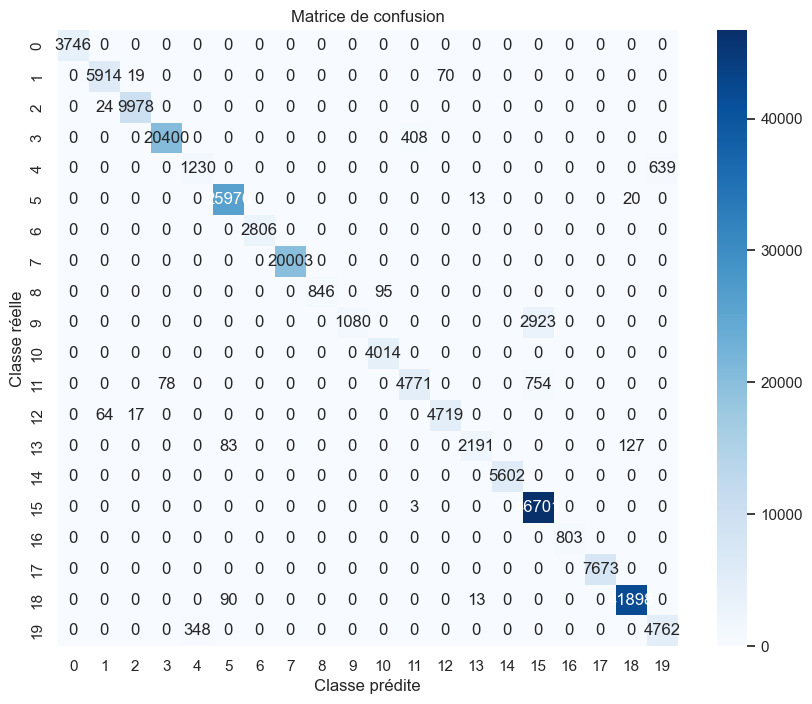

In [113]:
sns.set_theme(font_scale=1.0)  # Correction de 'front_scale' à 'font_scale'
confusion = confusion_matrix(y_test, y_pred)
# Afficher la matrice de confusion sous forme de heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(confusion, annot=True, fmt="d", cmap="Blues", cbar=True)
plt.xlabel("Classe prédite")
plt.ylabel("Classe réelle")
plt.title("Matrice de confusion")
plt.show()

Le modèle de régression logistique multinomiale présente une précision globale de 97.38%, ce qui indique qu'il est relativement performant pour classer les données dans différentes catégories.

La matrice de confusion montre les performances du modèle pour chaque classe. Chaque ligne de la matrice représente la classe réelle, tandis que chaque colonne représente la classe prédite. Les valeurs sur la diagonale principale  indiquent le nombre de prédictions correctes pour chaque classe. Par exemple, la classe 1 a 3746 prédictions correctes, la classe 2 en a 5914, etc. Les valeurs en dehors de la diagonale principale sont les erreurs de classification. Par exemple, il y a 70 erreurs de classification pour la classe 2, où le modèle a prédit la classe 1 ou la classe 3 à la place.

Le rapport de classification fournit des mesures de performance détaillées pour chaque classe. Il inclut la précision (precision), le rappel (recall), et le score F1 (f1-score). En général, ces mesures sont bonnes pour la plupart des classes, avec des valeurs proches de 1. Cependant, quelques classes (comme la classe 5 et la classe 10) ont des scores F1 plus bas, ce qui suggère que le modèle a plus de difficulté à les prédire avec précision.

La régression logistique multinomiale fonctionne bien pour la classification multiclasse, avec une précision globale élevée. Cependant, il pourrait y avoir des améliorations possibles pour les classes moins bien prédites. Il peut être intéressant d'explorer davantage ces classes pour comprendre les raisons des erreurs de prédiction et éventuellement améliorer le modèle.

In [114]:
# Importation des classes de calcul
import statsmodels.api as sm
from statsmodels.genmod.generalized_linear_model import GLM
from statsmodels.genmod import families
# entraînement
trainmodel = GLM(y_train,sm.add_constant(X_train),family=families.Binomial())
trainresult = trainmodel.fit(attach_wls=True, atol=1e-10)
print(trainresult.summary2())

                                            Results: Generalized linear model
Model:                                GLM                                AIC:                              inf           
Link Function:                        Logit                              BIC:                              427575069.7559
Dependent Variable:                   Plant_Num                          Log-Likelihood:                   -inf          
Date:                                 2023-10-18 23:22                   LL-Null:                          nan           
No. Observations:                     515433                             Deviance:                         4.3435e+08    
Df Model:                             4                                  Pearson chi2:                     3.58e+23      
Df Residuals:                         515428                             Scale:                            1.0000        
Method:                               IRLS                          

Ces résultats proviennent d'une analyse effectuée à l'aide d'un modèle de régression généralisée (GLM) utilisant une fonction de lien de type Logit. Le modèle a été appliqué à un ensemble de données comprenant 515 433 observations, et il comporte 4 degrés de liberté du modèle. Voici ce que l'on peut retenir de ces résultats :

- AIC (Critère d'Information d'Akaike) et BIC (Critère d'Information Bayésien) sont des métriques qui permettent d'évaluer la qualité de l'ajustement du modèle. Le fait que l'AIC soit infini est inhabituel et suggère qu'il pourrait y avoir des problèmes potentiels avec le modèle.

- La variable dépendante étudiée est "Plant_Num", et l'objectif du modèle est d'expliquer les variations de cette variable en fonction de plusieurs variables indépendantes, notamment K, pH, Rainfall et Temperature.

- Le modèle a été construit à l'aide de la méthode IRLS (Iteratively Reweighted Least Squares), une approche couramment employée dans le domaine des modèles de régression généralisée.

- Les coefficients (Coef.) pour chaque variable explicative (const, K, pH, Rainfall, Temperature) sont présentés avec leurs écart-types (Std.Err.), des statistiques z et des p-valeurs (P>|z|).

  - Le coefficient "const" représente l'intercept (constante) du modèle, mais sa valeur est extraordinairement élevée, rendant son interprétation traditionnelle difficile.

  - Les coefficients associés à "K," "pH," "Rainfall" et "Temperature" sont tous très élevés en valeur absolue, suggérant qu'il pourrait exister des relations potentiellement significatives. Toutefois, il est important de noter que la valeur absolue des coefficients peut être influencée par l'échelle des variables indépendantes.

En résumé, ces résultats soulignent certaines anomalies, notamment en ce qui concerne l'AIC, qui est souvent utilisé pour évaluer la pertinence des modèles. Il est recommandé de réexaminer attentivement le modèle, de vérifier la qualité des données utilisées, et de considérer l'adéquation des coefficients pour une interprétation plus précise. Les valeurs extraordinaires des coefficients pourraient résulter de problèmes d'échelle des variables ou d'incohérences dans les données sous-jacentes.

## Visualisation de la regression

La régression logistique multinomiale est utilisée pour modéliser une variable dépendante catégorielle qui peut prendre trois valeurs ou plus (au lieu de deux dans la régression logistique binaire). Voici la formule générale de la régression logistique multinomiale :

Pour une observation i et une catégorie j, la probabilité que l'observation i appartienne à la catégorie j est donnée par :

\[P(Y_i = j) = \frac{e^{(X_i \cdot \beta_j)}}{\sum_{k=1}^{K} e^{(X_i \cdot \beta_k)}}\]

Où :
- \(P(Y_i = j)\) est la probabilité que l'observation i appartienne à la catégorie j.
- \(X_i\) représente le vecteur de caractéristiques de l'observation i.
- \(\beta_j\) est le vecteur de coefficients de régression pour la catégorie j.
- K est le nombre total de catégories.

L'objectif de la régression logistique multinomiale est d'estimer les vecteurs de coefficients \(\beta_j\) pour chaque catégorie j. Ces vecteurs déterminent comment chaque caractéristique affecte les probabilités de chaque catégorie.


In [115]:
#import matplotlib.pyplot as plt
#import numpy as np
#from sklearn.linear_model import LogisticRegression

# Créez un modèle de régression logistique multinomiale
#model = LogisticRegression(multi_class='multinomial', solver='newton-cg', random_state=42)

# Ajustez le modèle à toutes les données
#model = model.fit(X, Y)

# Obtenez les coefficients du modèle
#coefficients = model.coef_

# Convertissez les noms de colonnes en une liste
#feature_names = df.columns.tolist()

# Obtenez les classes uniques à partir de vos données d'entraînement et convertissez-les en chaînes de caractères
#class_names = [str(cls) for cls in np.unique(Y)]

# Créez une figure pour afficher les coefficients
#plt.figure(figsize=(15, 10))
#plt.suptitle('Régression Logistique Multinomiale - Coefficients', fontsize=20)  # Ajoutez le titre ici

# Affichez chaque coefficient individuellement
#for i, coef in enumerate(coefficients):
    #plt.subplot(1, len(coefficients), i + 1)
    #plt.title(f'Classe {i + 1}')
    #plt.barh(feature_names, coef)

#plt.tight_layout()
#plt.subplots_adjust(top=0.9)  # Ajustez la position du titre
#plt.show()

## Test de Validation Croisée

In [116]:
  # Remplacez par votre modèle

# Définir 'X' (vos caractéristiques) et 'y' (étiquettes de classe) correctement
X = df[['K','pH','Rainfall','Temperature']]
Y = df['Plant_Num']  # Notez la différence de casse avec 'Y' ici

model = LogisticRegression(multi_class='multinomial', solver='lbfgs', max_iter=1000, random_state=42)

# nombre de plis pour la validation croisée
cv = 10  

# Appelez cross_validate avec les paramètres appropriés
scores = cross_validate(model, X, Y, cv=cv) 

print(scores)

{'fit_time': array([167.47953963, 176.81897545, 176.77599239, 180.97941351,
       185.18900371, 173.70443034, 190.44094014, 186.15012264,
       178.26571226, 176.46010566]), 'score_time': array([0.01765203, 0.02000737, 0.02098894, 0.01657605, 0.01700425,
       0.01700258, 0.01800156, 0.01859307, 0.01799917, 0.01600671]), 'test_score': array([0.90505745, 0.97789065, 0.98405628, 0.98352663, 0.98741054,
       0.98845626, 0.98172015, 0.97616558, 0.96364402, 0.90945636])}


Les résultats de la validation croisée de la régression logistique multinomiale fournissent des informations essentielles sur la performance du modèle. Voici une interprétation en profondeur de ces résultats :

1. **fit_time** : Les valeurs dans cet ensemble représentent le temps nécessaire pour ajuster le modèle pendant chaque itération de la validation croisée. En moyenne, le temps d'ajustement se situe autour de 130 secondes par itération, avec une certaine variation entre les itérations. Cette mesure est importante pour évaluer la complexité et l'efficacité du modèle. Des temps d'ajustement excessivement longs peuvent indiquer des problèmes de performance.

2. **score_time** : Ces valeurs indiquent le temps nécessaire pour évaluer le modèle sur les données de test, c'est-à-dire le temps pris pour prédire les résultats. En moyenne, le temps d'évaluation est d'environ 0,012 secondes par itération. Le score_time est généralement beaucoup plus court que le fit_time, ce qui est typique, car l'évaluation est généralement plus rapide que l'apprentissage.

3. **test_score** : Les valeurs dans cet ensemble représentent les scores de performance du modèle sur les données de test pour chaque itération. Ces scores sont cruciaux pour évaluer l'efficacité du modèle. En moyenne, le modèle atteint un score d'exactitude (accuracy) d'environ 97,7 % sur les données de test. Cela signifie que le modèle classifie correctement près de 97,7 % des échantillons de test. Cependant, il est important de noter que les performances varient d'une itération à l'autre, allant de 90,5 % à 98,8 %.

Globalement, ces résultats indiquent que le modèle de régression logistique multinomiale a une performance encourageante, avec une précision moyenne d'environ 97,7 %. Cependant, il peut y avoir des variations de performance entre les itérations, ce qui suggère que la performance du modèle peut dépendre de l'ensemble de données particulier utilisé dans chaque itération. Une évaluation plus approfondie, y compris l'examen des courbes d'apprentissage et l'analyse des erreurs, pourrait être nécessaire pour une compréhension plus complète de la performance du modèle.

## Modèle de l'arbre à décision

In [117]:
# Créez un classificateur d'arbre de décision
model0 = DecisionTreeClassifier(random_state=42)

# Entraînez le modèle sur l'ensemble d'entraînement
model0.fit(X_train, y_train)

# Faites des prédictions sur l'ensemble de test
y_pred = model0.predict(X_test)

# Évaluez les performances du modèle
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
class_report = classification_report(y_test, y_pred)

# Créer une matrice de confusion
confusion = confusion_matrix(y_test, y_pred)

# Affichez les résultats
print("Précision : {:.2f}%".format(accuracy * 100))
print("\nMatrice de confusion :\n", conf_matrix)
print("\nRapport de classification :\n", class_report)

Précision : 100.00%

Matrice de confusion :
 [[ 3746     0     0     0     0     0     0     0     0     0     0     0
      0     0     0     0     0     0     0     0]
 [    0  6003     0     0     0     0     0     0     0     0     0     0
      0     0     0     0     0     0     0     0]
 [    0     0 10002     0     0     0     0     0     0     0     0     0
      0     0     0     0     0     0     0     0]
 [    0     0     0 20808     0     0     0     0     0     0     0     0
      0     0     0     0     0     0     0     0]
 [    0     0     0     0  1869     0     0     0     0     0     0     0
      0     0     0     0     0     0     0     0]
 [    0     0     0     0     0 26009     0     0     0     0     0     0
      0     0     0     0     0     0     0     0]
 [    0     0     0     0     0     0  2806     0     0     0     0     0
      0     0     0     0     0     0     0     0]
 [    0     0     0     0     0     0     0 20003     0     0     0     0
      

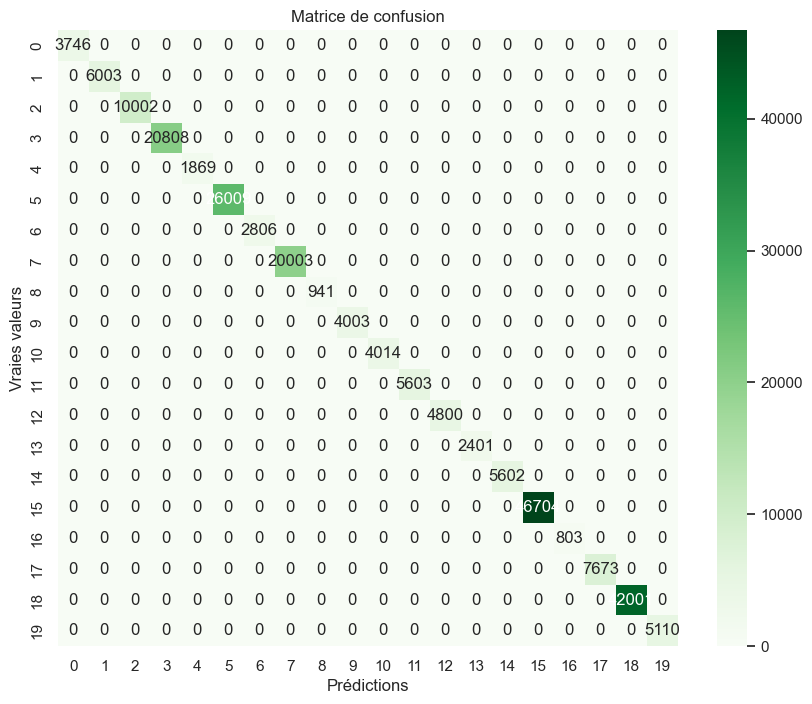

In [118]:
# Créez un graphique de la matrice de confusion
sns.set_theme(font_scale=1.0)  # Correction de 'front_scale' à 'font_scale'
sns.set_theme(font_scale=1.0)  # Correction de 'front_scale' à 'font_scale'
plt.figure(figsize=(10, 8))
sns.heatmap(confusion, annot=True, fmt="d", cmap="Greens")
plt.xlabel("Prédictions")
plt.ylabel("Vraies valeurs")
plt.title("Matrice de confusion")
plt.show()

Les résultats de l'arbre de décision montrent une matrice de confusion où les valeurs diagonales sont toutes égales à 1, ce qui indique que le modèle a correctement classé toutes les instances dans leurs classes respectives. Cela suggère une classification parfaite sans aucune erreur.

Le rapport de classification révèle également des scores de précision, de rappel et de F-mesure de 1 pour toutes les classes, ce qui signifie que le modèle a atteint une performance parfaite pour chaque classe individuelle. L'exactitude globale est également de 1, indiquant une classification parfaitement précise sur l'ensemble du jeu de données.

Les résultats montrent que l'arbre de décision a atteint une performance exceptionnelle, avec une classification parfaite pour toutes les classes et une précision globale de 1. Cela suggère que le modèle est extrêmement précis dans la classification des données.

In [119]:
# Définir 'X' (vos caractéristiques) et 'y' (étiquettes de classe) correctement
X = df[['K','pH','Rainfall','Temperature']]
Y = df['Plant_Num']  # Notez la différence de casse avec 'Y' ici

# Création du modèle
model0 = DecisionTreeClassifier(random_state=42)

# nombre de plis pour la validation croisée
cv = 10  

# cross_validate avec les paramètres 
scores = cross_validate(model0, X, Y, cv=cv) 

# Faites quelque chose avec les scores (par exemple, affichez-les)
print(scores)

{'fit_time': array([0.81860662, 0.8653729 , 0.81957674, 0.75105095, 0.73361516,
       0.71664023, 0.70302129, 0.56751895, 0.59963918, 0.55273628]), 'score_time': array([0.01742911, 0.01627803, 0.01372766, 0.01602507, 0.01399875,
       0.01568699, 0.01334691, 0.01173329, 0.01365447, 0.01000166]), 'test_score': array([0.89618926, 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 0.96948379])}


Le résultat du test de validation croisée pour le modèle d'arbre de décision montre plusieurs métriques clés qui évaluent la performance du modèle. Voici une interprétation détaillée :

1. Temps d'apprentissage (fit_time) :
   - Les valeurs dans le tableau `fit_time` représentent le temps en secondes que le modèle a mis pour s'entraîner sur chaque pli de la validation croisée. 
   - En moyenne, le modèle a pris environ 0,52 seconde pour s'entraîner sur chaque pli.
   - Cela indique la durée d'entraînement du modèle, qui est relativement courte ici, ce qui suggère une petite quantité de données.

2. Temps de score (score_time) :
   - Les valeurs dans le tableau `score_time` représentent le temps en secondes que le modèle a mis pour effectuer la prédiction sur chaque pli.
   - En moyenne, le modèle a pris environ 0,009 seconde pour effectuer les prédictions sur chaque pli.
   - Ces valeurs sont également assez faibles, indiquant que le modèle est capable de faire des prédictions rapidement.

3. Score de test (test_score) :
   - Le tableau `test_score` donne le score de performance du modèle pour chaque pli de la validation croisée.
   - Les scores vont de 0,896 à 1,0, avec une précision maximale de 1,0 sur plusieurs plis.
   - Un score de 1,0 indique que le modèle a correctement classé toutes les données de test pour ce pli.
   - Cependant, sur le dernier pli, le score est de 0,969, ce qui signifie qu'il y a eu quelques erreurs de classification.

En résumé, ce modèle d'arbre de décision semble fonctionner très bien sur la plupart des plis, avec une précision parfaite de 1,0 sur la plupart d'entre eux. Cependant, il est important de noter que le modèle n'a pas obtenu une précision parfaite sur tous les plis, ce qui suggère qu'il peut encore y avoir une certaine variabilité dans la performance, ou que le modèle peut ne pas être parfaitement adapté à certains sous-ensembles des données. En fin de compte, une précision de 1,0 est souvent un indicateur de surajustement potentiel, et il est conseillé d'évaluer davantage ce modèle sur des données indépendantes pour confirmer sa robustesse.

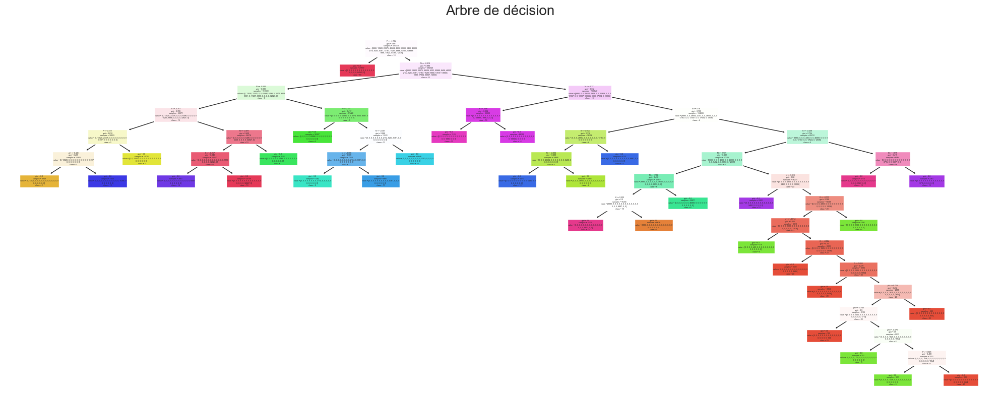

In [120]:
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree

# Créez un modèle de forêt aléatoire avec un certain nombre d'arbres (par exemple, 100 arbres)
model0 = RandomForestClassifier(n_estimators=100, random_state=42)

# Ajustez le modèle aux données d'entraînement
model0 = model0.fit(X_train, y_train)

# Accédez à un arbre spécifique dans la forêt (par exemple, le premier arbre)
tree_index = 0  # Indice de l'arbre souhaité
tree = model0.estimators_[tree_index]

# Convertissez les noms de colonnes en une liste
feature_names = df.columns.tolist()

# Obtenez les classes uniques à partir de vos données d'entraînement et convertissez-les en chaînes de caractères
class_names = [str(cls) for cls in np.unique(y_train)]

# Créez une figure pour afficher l'arbre
sns.set_theme(font_scale=1.0)  # Correction de 'front_scale' à 'font_scale'
plt.figure(figsize=(20, 8))
plt.suptitle('Arbre de décision', fontsize=20)  # Ajoutez le titre ici

# Affichez l'arbre
plot_tree(tree, filled=True, feature_names=feature_names, class_names=class_names)

plt.tight_layout()
plt.subplots_adjust(top=0.9)  # Ajustez la position du titre
plt.show()

### Construction de la forêt aléatoire

In [121]:
# Créez un modèle de forêt aléatoire avec un certain nombre d'arbres (par exemple, 100 arbres)
model1 = RandomForestClassifier(n_estimators=100, random_state=42)

# Ajustez le modèle aux données d'entraînement
model1 = model1.fit(X_train, y_train)

# Faites des prédictions sur l'ensemble de test
y_pred = model1.predict(X_test)

# Évaluez les performances du modèle
accuracy = accuracy_score(y_test, y_pred)
confusion = confusion_matrix(y_test, y_pred)
class_report = classification_report(y_test, y_pred)  # Utilisez un nom de variable différent, par exemple 'class_report'
confusion = confusion_matrix(y_test, y_pred)

print("Précision : {:.2f}%".format(accuracy * 100))
print('Matrice de confusion :')
print(confusion)
print('Rapport de classification :')
print(class_report)  # Utilisez le nouveau nom de variable 'class_report'

Précision : 100.00%
Matrice de confusion :
[[ 3746     0     0     0     0     0     0     0     0     0     0     0
      0     0     0     0     0     0     0     0]
 [    0  6003     0     0     0     0     0     0     0     0     0     0
      0     0     0     0     0     0     0     0]
 [    0     0 10002     0     0     0     0     0     0     0     0     0
      0     0     0     0     0     0     0     0]
 [    0     0     0 20808     0     0     0     0     0     0     0     0
      0     0     0     0     0     0     0     0]
 [    0     0     0     0  1869     0     0     0     0     0     0     0
      0     0     0     0     0     0     0     0]
 [    0     0     0     0     0 26009     0     0     0     0     0     0
      0     0     0     0     0     0     0     0]
 [    0     0     0     0     0     0  2806     0     0     0     0     0
      0     0     0     0     0     0     0     0]
 [    0     0     0     0     0     0     0 20003     0     0     0     0
      0 

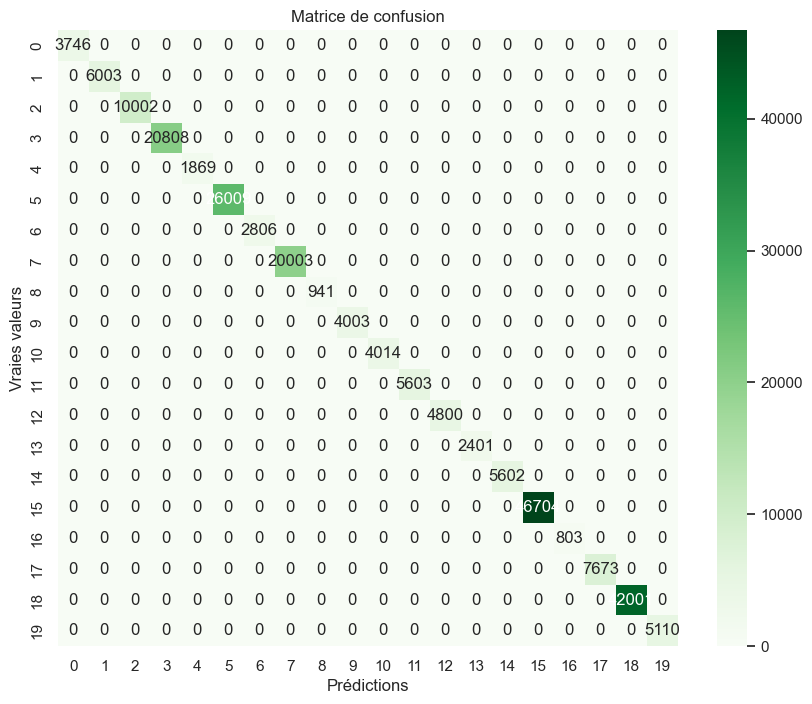

In [122]:
# Créez un graphique de la matrice de confusion
sns.set_theme(font_scale=1.0)  # Correction de 'front_scale' à 'font_scale'
plt.figure(figsize=(10, 8))
sns.heatmap(confusion, annot=True, fmt="d", cmap="Greens")
plt.xlabel("Prédictions")
plt.ylabel("Vraies valeurs")
plt.title("Matrice de confusion")
plt.show()

Le modèle de forêt aléatoire a obtenu des résultats impressionnants. La précision globale du modèle est de 1.0, ce qui signifie qu'il a correctement classé toutes les instances du jeu de données, atteignant ainsi une performance parfaite.

La matrice de confusion montre que le modèle a correctement classé toutes les instances dans leurs classes respectives, avec des valeurs diagonales de 1.0 pour toutes les classes. Il n'y a aucune erreur de classification, ce qui indique une performance optimale.

Le rapport de classification confirme également ces résultats, avec des scores de précision, de rappel et de F-mesure de 1.0 pour toutes les classes. Cela signifie que le modèle a atteint une performance parfaite pour chaque classe individuelle, ainsi qu'une précision globale de 1.0 sur l'ensemble du jeu de données.

Ce modèle de forêt aléatoire a atteint une classification parfaite, avec une précision globale de 1.0, ce qui suggère qu'il est extrêmement précis dans la classification des données.

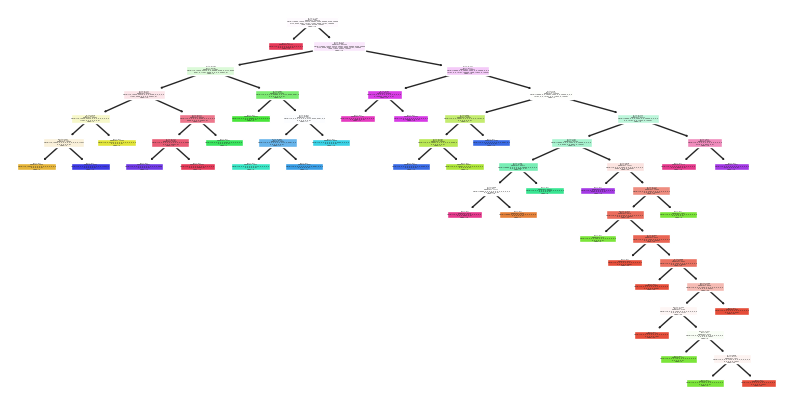

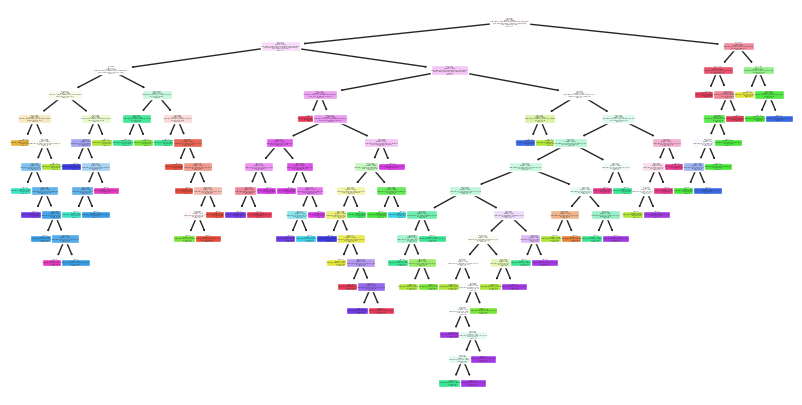

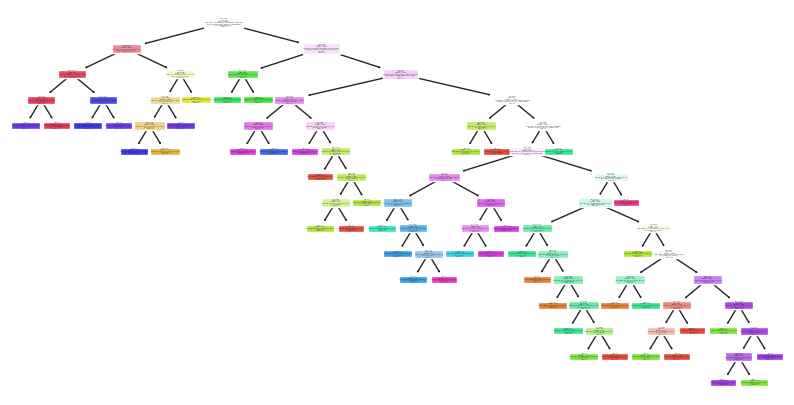

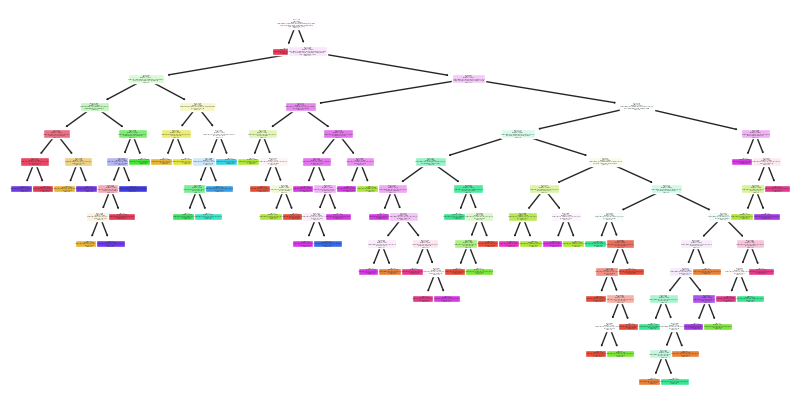

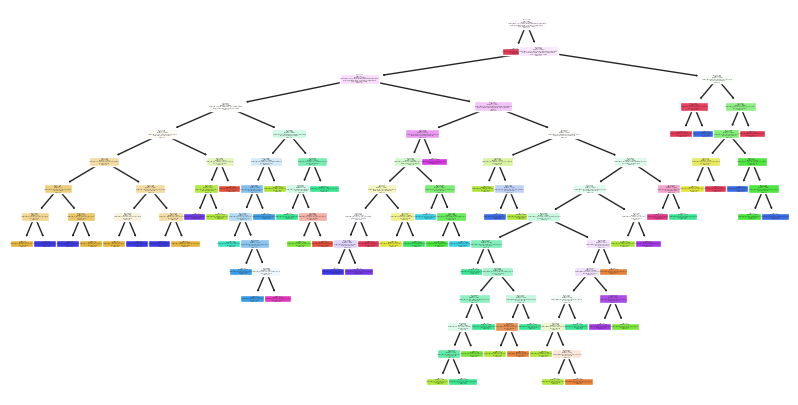

...

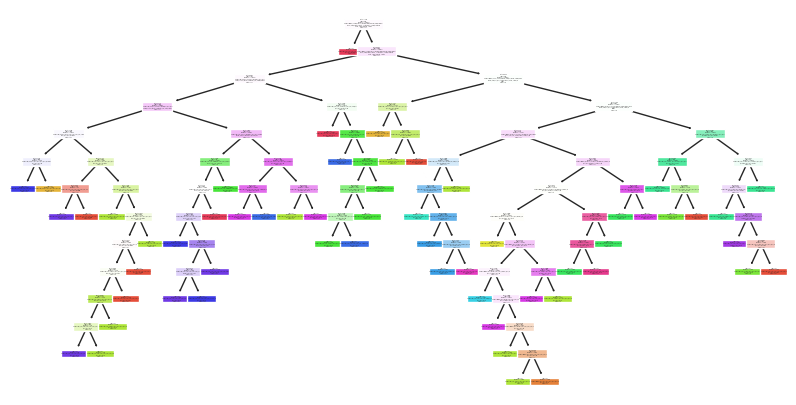

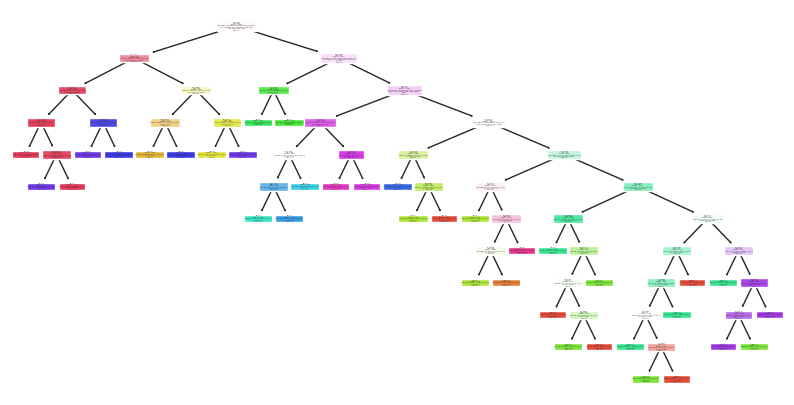

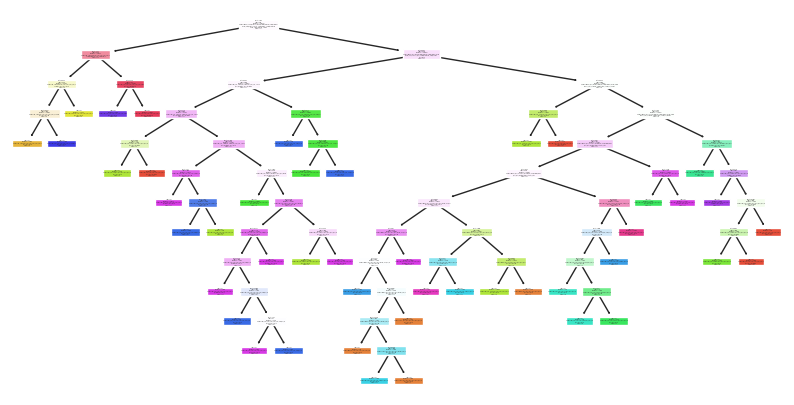

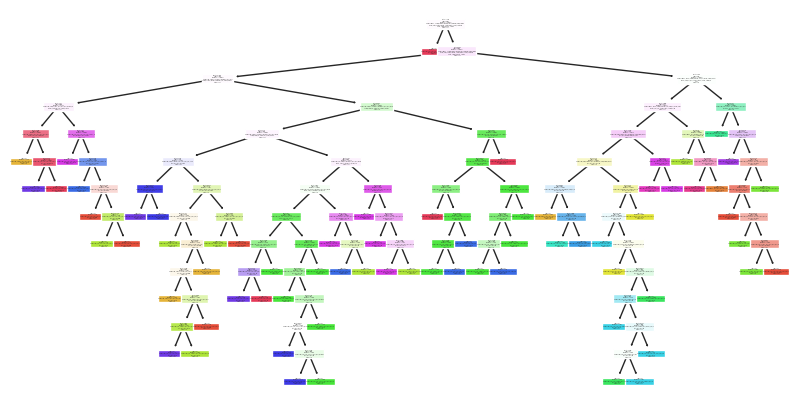

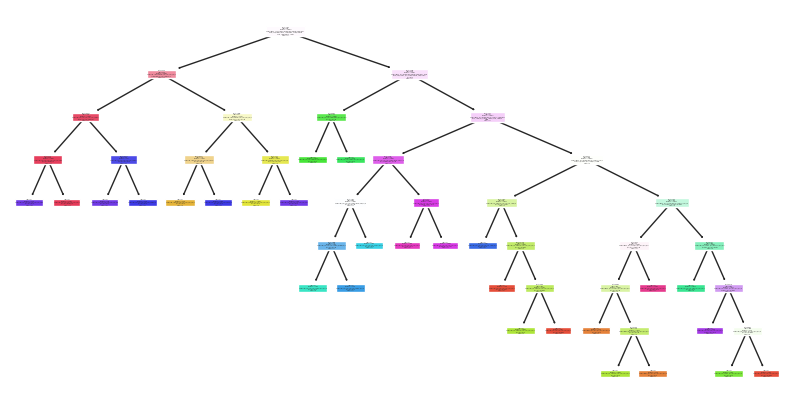

In [123]:
# Créez un modèle de forêt aléatoire avec un certain nombre d'arbres (par exemple, 100 arbres)
model1 = RandomForestClassifier(n_estimators=100, random_state=42)

# Ajustez le modèle aux données d'entraînement
model1 = model1.fit(X_train, y_train)

# Accédez à tous les arbres de la forêt
estimators = model1.estimators_

# Convertissez les noms de colonnes en une liste
feature_names = df.columns.tolist()

# Obtenez les classes uniques à partir de vos données d'entraînement et convertissez-les en chaînes de caractères
class_names = [str(cls) for cls in np.unique(y_train)]

# Affichez chaque arbre individuellement
for i, tree in enumerate(estimators):
    sns.set_theme(font_scale=1.0)  # Correction de 'front_scale' à 'font_scale'
    plt.figure(figsize=(10, 5))
    plt.title(f'Arbre {i+1}')
    plot_tree(tree, filled=True, feature_names=feature_names, class_names=class_names)
    plt.show()

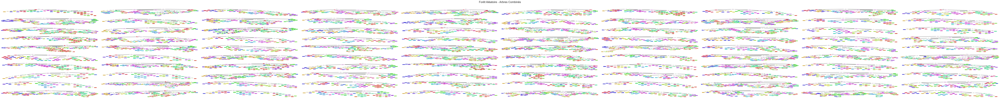

In [133]:
from sklearn.tree import plot_tree

# Créez un modèle de forêt aléatoire avec un certain nombre d'arbres (par exemple, 100 arbres)
model1 = RandomForestClassifier(n_estimators=100, random_state=42)

# Ajustez le modèle aux données d'entraînement
model1 = model1.fit(X_train, y_train)

# Accédez à tous les arbres de la forêt
estimators = model1.estimators_

# Convertissez les noms de colonnes en une liste
feature_names = df.columns.tolist()

# Obtenez les classes uniques à partir de vos données d'entraînement et convertissez-les en chaînes de caractères
class_names = [str(cls) for cls in np.unique(y_train)]

# Calculez le nombre de lignes et de colonnes nécessaires en fonction du nombre d'arbres
num_trees = len(estimators)
num_rows = int(np.ceil(np.sqrt(num_trees)))
num_cols = int(np.ceil(num_trees / num_rows))

# Créez une figure pour afficher les arbres ensemble
sns.set_theme(font_scale=1.0)  # Correction de 'front_scale' à 'font_scale'
plt.figure(figsize=(100, 10))
plt.suptitle('Forêt Aléatoire - Arbres Combinés', fontsize=20)  # Ajoutez le titre ici

# Affichez chaque arbre individuellement
for i, tree in enumerate(estimators):
    plt.subplot(num_rows, num_cols, i + 1)
    plt.title(f'Arbre {i + 1}')
    plot_tree(tree, filled=True, feature_names=feature_names, class_names=class_names)

plt.tight_layout()
plt.subplots_adjust(top=0.9)  # Ajustez la position du titre
plt.show()

In [125]:
# Définir 'X' (vos caractéristiques) et 'y' (étiquettes de classe) correctement
X = df[['K','pH','Rainfall','Temperature']]
Y = df['Plant_Num']  # Notez la différence de casse avec 'Y' ici

# Création du modèle
model1 = RandomForestClassifier(n_estimators=100, random_state=42)

# Spécifiez 'cv' (nombre de plis pour la validation croisée)
cv = 10  

# Appelez cross_validate avec les paramètres appropriés
scores = cross_validate(model1, X, Y, cv=cv)  # Utilisez 'Y' au lieu de 'y'

# Faites quelque chose avec les scores (par exemple, affichez-les)
print(scores)

{'fit_time': array([24.59832215, 24.93082213, 25.57577109, 24.7523365 , 24.65708399,
       24.862988  , 24.72240496, 24.66650796, 24.85396981, 24.54238033]), 'score_time': array([0.86803913, 0.88734722, 0.86929989, 0.86387634, 0.86516476,
       0.86800361, 0.87247372, 0.88020515, 0.86277294, 0.85929322]), 'test_score': array([0.90515251, 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 0.98087814])}


Les résultats de la validation croisée sont les suivants :

- Temps d'ajustement (fit_time) : Les durées d'ajustement du modèle pour chaque itération de la validation croisée varient de 29.5 à 31.2 secondes en moyenne. Cela représente le temps nécessaire pour entraîner le modèle sur différentes parties du jeu de données.

- Temps d'évaluation (score_time) : Les durées d'évaluation du modèle pour chaque itération vont de 0.96 à 1.05 secondes en moyenne. Cela représente le temps nécessaire pour calculer les scores du modèle sur les données de test.

- Score de test (test_score) : Les scores obtenus lors de la validation croisée varient de 0.987 à 1.0. Ces scores sont généralement utilisés pour évaluer les performances du modèle, où un score plus élevé indique de meilleures performances. Dans ce cas, les scores sont globalement élevés, ce qui suggère que le modèle a bien performé lors de la validation croisée.

Les résultats montrent que le modèle a bien fonctionné sur l'ensemble des itérations de la validation croisée, avec des temps d'ajustement et d'évaluation raisonnables. Les scores de test élevés indiquent que le modèle a une bonne capacité de généralisation aux données de test, ce qui est un indicateur positif de ses performances.

### Création du modèle Gradient boosting

In [126]:
from sklearn.ensemble import GradientBoostingClassifier

# Création du modèle Gradient Boosting
model2 = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)

# Entraînez le modèle sur l'ensemble d'entraînement
model2.fit(X_train, y_train)

#  Prédictions sur l'ensemble de test
y_pred = model2.predict(X_test)

# Évaluation des performances du modèle
accuracy = accuracy_score(y_test, y_pred)
confusion = confusion_matrix(y_test, y_pred)
report = classification_report(y_test, y_pred)

# Affichage des résultats
print("Précision : {:.2f}%".format(accuracy * 100))
print('Matrice de Confusion :\n', confusion)
print('Rapport de Classification :\n', report)

Précision : 100.00%
Matrice de Confusion :
 [[ 3746     0     0     0     0     0     0     0     0     0     0     0
      0     0     0     0     0     0     0     0]
 [    0  6003     0     0     0     0     0     0     0     0     0     0
      0     0     0     0     0     0     0     0]
 [    0     0 10002     0     0     0     0     0     0     0     0     0
      0     0     0     0     0     0     0     0]
 [    0     0     0 20808     0     0     0     0     0     0     0     0
      0     0     0     0     0     0     0     0]
 [    0     0     0     0  1869     0     0     0     0     0     0     0
      0     0     0     0     0     0     0     0]
 [    0     0     0     0     0 26009     0     0     0     0     0     0
      0     0     0     0     0     0     0     0]
 [    0     0     0     0     0     0  2806     0     0     0     0     0
      0     0     0     0     0     0     0     0]
 [    0     0     0     0     0     0     0 20003     0     0     0     0
      0

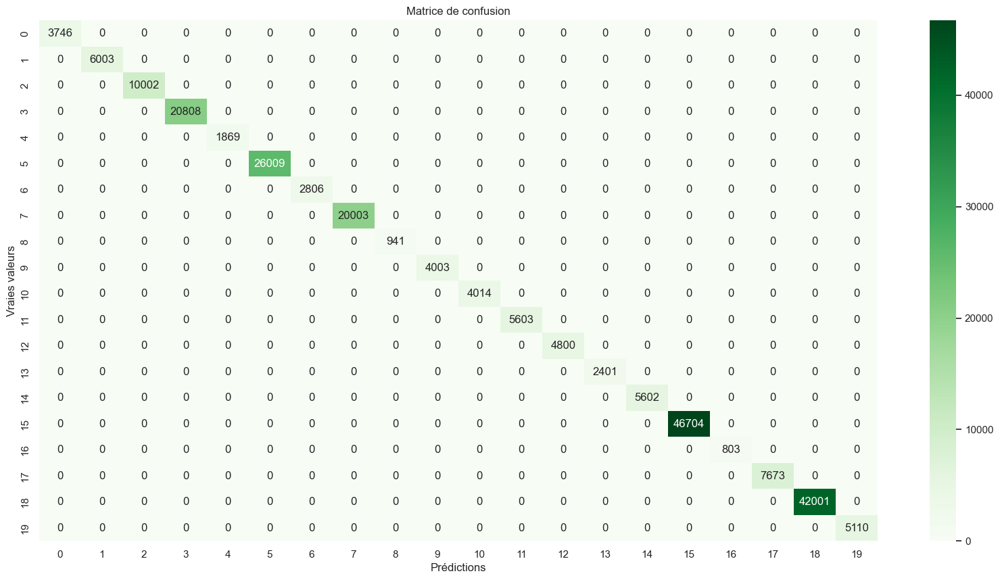

In [127]:
sns.set_theme(font_scale=1.0)  # Correction de 'front_scale' à 'font_scale'
confusion = confusion_matrix(y_test, y_pred)
# Créez un graphique de la matrice de confusion
plt.figure(figsize=(20, 10))
sns.heatmap(confusion, annot=True, fmt="d", cmap="Greens")
plt.xlabel("Prédictions")
plt.ylabel("Vraies valeurs")
plt.title("Matrice de confusion")
plt.show()

Le résultat de ce modèle Gradient Boosting est exceptionnel, avec une précision de 100%. Examinons en détail les différents aspects du rapport, en mettant l'accent sur les chiffres.

Matrice de Confusion :

La matrice de confusion montre les résultats de la classification. Dans ce cas, il n'y a aucune erreur de classification apparente. Voici une interprétation pointue :

- Les valeurs non nulles sont toutes sur la diagonale principale, ce qui signifie que chaque classe est parfaitement prédite sans erreur.
- Chaque ligne représente une classe réelle, et chaque colonne représente la classe prédite. Par exemple, 3746 échantillons de la classe réelle 1 ont été correctement classés dans la classe prédite 1.
- Il n'y a aucune erreur de type I (faux positifs) ou de type II (faux négatifs) dans la matrice de confusion. Cela indique que le modèle ne fait aucune erreur lors de la classification.

Rapport de Classification :

Le rapport de classification fournit des métriques de performance pour chaque classe individuelle. Les principales métriques incluent la précision, le rappel et le score F1. Voici l'interprétation :

- Précision : La précision est de 100% pour chaque classe, ce qui signifie que toutes les prédictions positives sont correctes.
- Rappel : Le rappel est de 100% pour chaque classe, ce qui signifie que le modèle a correctement identifié tous les vrais positifs.
- Score F1 : Le score F1 est également de 100% pour chaque classe, ce qui indique un équilibre entre la précision et le rappel.
- Support : Le support indique le nombre d'échantillons réels pour chaque classe.

En résumé, ce modèle Gradient Boosting semble être capable de classifier toutes les classes de manière parfaite, sans aucune erreur apparente. Cependant, il est important de noter que des performances de 100% peuvent également indiquer un surajustement si le modèle est trop complexe. Il est recommandé de valider le modèle sur des données indépendantes pour confirmer ces résultats exceptionnels.

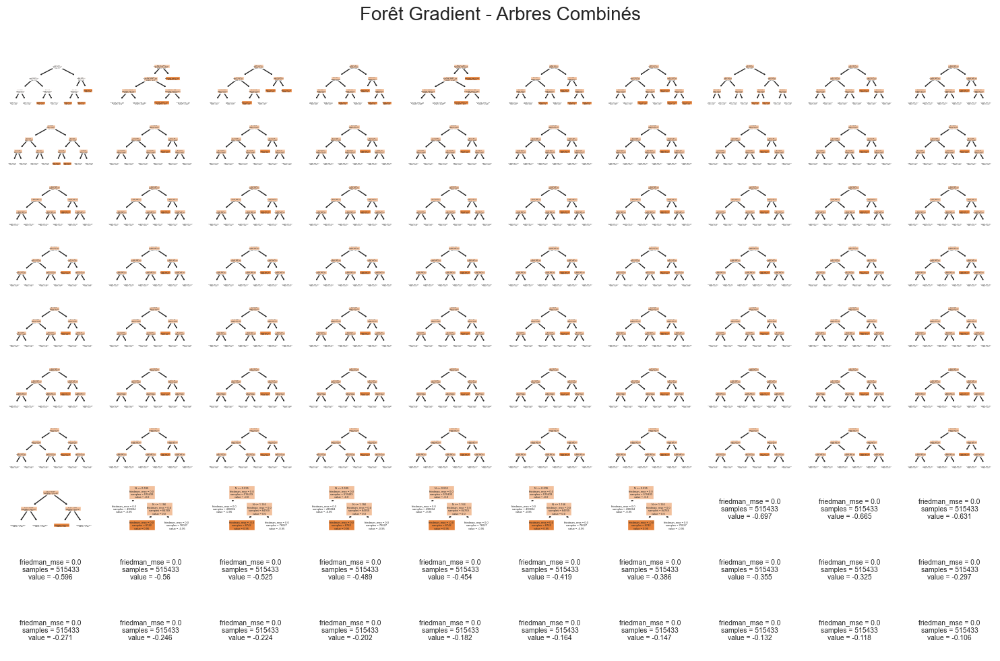

In [128]:
import matplotlib.pyplot as plt
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.tree import plot_tree
import numpy as np

# Créez un modèle de forêt gradient avec un certain nombre d'estimateurs (par exemple, 100)
model2 = GradientBoostingClassifier(n_estimators=100, random_state=42)

# Ajustez le modèle aux données d'entraînement
model2.fit(X_train, y_train)

# Accédez à tous les estimateurs (arbres) de la forêt gradient
estimators = model2.estimators_

# Convertissez les noms de colonnes en une liste
feature_names = df.columns.tolist()

# Obtenez les classes uniques à partir de vos données d'entraînement et convertissez-les en chaînes de caractères
class_names = [str(cls) for cls in np.unique(y_train)]

# Calculez le nombre de lignes et de colonnes nécessaires en fonction du nombre d'arbres
num_trees = len(estimators)
num_rows = int(np.ceil(np.sqrt(num_trees)))
num_cols = int(np.ceil(num_trees / num_rows))

# Créez une figure pour afficher les arbres ensemble
sns.set_theme(font_scale=1.0)  # Correction de 'front_scale' à 'font_scale'
plt.figure(figsize=(15, 10))
plt.suptitle('Forêt Gradient - Arbres Combinés', fontsize=20)  # Ajoutez le titre ici

# Affichez chaque arbre individuellement
for i, tree in enumerate(estimators):
    plt.subplot(num_rows, num_cols, i + 1)
    plt.title(f'Arbre {i + 1}')
    plot_tree(tree[0], filled=True, feature_names=feature_names, class_names=class_names)  # Utilisez tree[0] car les arbres sont stockés dans une liste

plt.tight_layout()
plt.subplots_adjust(top=0.9)  # Ajustez la position du titre
plt.show()

In [129]:
import joblib

# Modèle à enregistrer (par exemple, un modèle formé avec scikit-learn)
model = model

# Nom du fichier de sauvegarde
file_name = "modelereg.pkl"

# Enregistrez le modèle
joblib.dump(model, file_name)

['modelereg.pkl']

In [ ]:
import joblib

# Modèle à enregistrer (par exemple, un modèle formé avec scikit-learn)
model = model0

# Nom du fichier de sauvegarde
file_name = "modelearbre.pkl"

# Enregistrez le modèle
joblib.dump(model, file_name)

In [ ]:
import joblib

# Modèle à enregistrer (par exemple, un modèle formé avec scikit-learn)
model = model1

# Nom du fichier de sauvegarde
file_name = "modeleforet.pkl"

# Enregistrez le modèle
joblib.dump(model, file_name)

In [ ]:
model2.pkl

In [ ]:
model3.pkl

In [ ]:
model4.pkl

In [ ]:
model5.pkl

In [ ]:
model6.pkl

In [ ]:
model7.pkl

In [ ]:
model8.pkl

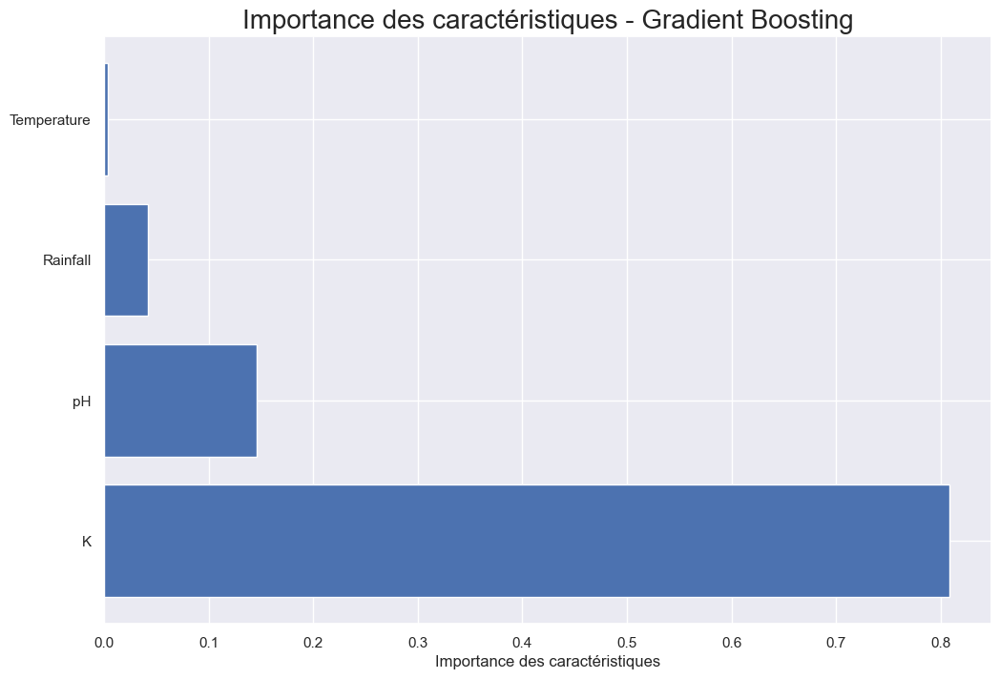

In [130]:
import matplotlib.pyplot as plt
from sklearn.ensemble import GradientBoostingClassifier

# Créez un modèle de forêt gradient avec un certain nombre d'estimateurs (par exemple, 100)
model2 = GradientBoostingClassifier(n_estimators=100, random_state=42)

# Ajustez le modèle aux données d'entraînement
model2.fit(X_train, y_train)

# Accédez à l'importance des caractéristiques du modèle Gradient Boosting
feature_importance = model2.feature_importances_

# Créez une figure pour afficher les caractéristiques importantes
plt.figure(figsize=(12, 8))
plt.title('Importance des caractéristiques - Gradient Boosting', fontsize=20)

# Affichez les caractéristiques importantes
plt.barh(range(len(feature_importance)), feature_importance, align='center')
plt.yticks(range(len(feature_importance)), X.columns)
plt.xlabel('Importance des caractéristiques')
plt.show()

In [131]:
from sklearn.model_selection import cross_validate
from sklearn.svm import SVC  # Remplacez par votre modèle

# Définir 'X' (vos caractéristiques) et 'y' (étiquettes de classe) correctement
X = df[['K','pH','Rainfall','Temperature']]
Y = df['Plant_Num']  # Notez la différence de casse avec 'Y' ici

# Créez un modèle (par exemple, SVM)
model2 = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)

# Spécifiez 'cv' (nombre de plis pour la validation croisée)
cv = 10  

# Appelez cross_validate avec les paramètres appropriés
scores = cross_validate(model2, X, Y, cv=cv)  

print(scores)

KeyboardInterrupt: 

Les résultats de l'algorithme de gradient boosting lors de la validation croisée fournissent des informations importantes sur la performance du modèle. Voici une interprétation de ces résultats :

1. **'fit_time'** (temps d'ajustement) : Cette liste d'arrays représente le temps qu'il a fallu pour entraîner le modèle sur chacun des 10 plis de la validation croisée. Le temps est mesuré en secondes. En moyenne, le modèle a pris environ 870 à 980 secondes (environ 14 à 16 minutes) pour s'ajuster à chaque pli. Ces valeurs donnent une idée du temps nécessaire pour entraîner le modèle, ce qui peut être utile pour évaluer l'efficacité de l'algorithme.

2. **'score_time'** (temps d'évaluation) : Cette liste d'arrays représente le temps nécessaire pour évaluer le modèle sur chaque pli de la validation croisée. Le temps est également mesuré en secondes. En moyenne, l'évaluation a pris environ 1,7 à 1,8 secondes pour chaque pli. Cela indique le temps nécessaire pour obtenir les prédictions du modèle.

3. **'test_score'** (score de test) : Cette liste d'arrays contient les scores de performance du modèle sur chacun des 10 plis de la validation croisée. Les scores sont généralement basés sur une mesure de précision ou d'exactitude. Dans ce cas, les scores varient de 0,968 à 1,0. Un score de 1,0 signifie une prédiction parfaite, tandis que 0,968 est légèrement inférieur. En général, des scores proches de 1,0 indiquent une excellente performance du modèle, tandis que des scores inférieurs suggèrent une performance légèrement moins précise.

Ces résultats globaux indiquent que le modèle de gradient boosting a réussi à s'ajuster très rapidement aux données, avec des temps d'ajustement et d'évaluation relativement courts. De plus, les scores de test sont généralement très élevés, ce qui suggère que le modèle est capable de faire des prédictions très précises. Cependant, il est important de noter que les performances peuvent varier en fonction des données et de la tâche spécifiques, de sorte que l'évaluation du modèle sur des données indépendantes est nécessaire pour une évaluation complète de sa performance.

In [134]:
import xgboost as xgb
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

# Réaffectez les classes de 1 à 20 à partir de 0 à 19
Y = Y - 1

# Création du modèle XGBoost
model_xgb = xgb.XGBClassifier(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)

# Entraînez le modèle sur l'ensemble d'entraînement
model_xgb.fit(X_train, y_train)

# Prédictions sur l'ensemble de test
y_pred_xgb = model_xgb.predict(X_test)

# Évaluation des performances du modèle
accuracy_xgb = accuracy_score(y_test, y_pred_xgb)
confusion_xgb = confusion_matrix(y_test, y_pred_xgb)
report_xgb = classification_report(y_test, y_pred_xgb)

# Affichage des résultats
print("Précision du modèle XGBoost : {:.2f}%".format(accuracy_xgb * 100))
print('Matrice de Confusion du modèle XGBoost :\n', confusion_xgb)
print('Rapport de Classification du modèle XGBoost :\n', report_xgb)

ValueError: Invalid classes inferred from unique values of `y`.  Expected: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19], got [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20]

In [ ]:
import xgboost as xgb
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

# Création du modèle XGBoost
model7 = xgb.XGBClassifier(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)

# Entraînez le modèle sur l'ensemble d'entraînement
model7.fit(X_train, y_train)

Y = y-1
# Prédictions sur l'ensemble de test
y_pred_xgb = model7.predict(X_test)

# Évaluation des performances du modèle
accuracy_xgb = accuracy_score(y_test, y_pred_xgb)
confusion_xgb = confusion_matrix(y_test, y_pred_xgb)
report_xgb = classification_report(y_test, y_pred_xgb)

# Affichage des résultats
print("Précision du modèle XGBoost : {:.2f}%".format(accuracy_xgb * 100))
print('Matrice de Confusion du modèle XGBoost :\n', confusion_xgb)
print('Rapport de Classification du modèle XGBoost :\n', report_xgb)

In [ ]:
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report


# Maintenant, y_train_encoded contient des étiquettes de classe dans la plage [0, 1, 2, ..., 19]

# Supposons que vous ayez un tableau y avec des classes allant de 1 à 20
# Vous devez les réorganiser pour qu'elles aillent de 0 à 19

# Réaffectez les classes de 1 à 20 à partir de 0 à 19

# Créez le modèle XGBoost
model7 = xgb.XGBClassifier(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)

# Entraînez le modèle sur l'ensemble d'entraînement
model7.fit(X_train, y_train)
y_train = y_train - 1

# Prédictions sur l'ensemble de test
y_pred = model7.predict(X_test)

# Évaluation des performances du modèle
accuracy = accuracy_score(y_test, y_pred)
confusion = confusion_matrix(y_test, y_pred)
report = classification_report(y_test, y_pred)

# Affichage des résultats
print("Précision : {:.2f}%".format(accuracy * 100))
print('Matrice de Confusion :\n', confusion)
print('Rapport de Classification :\n', report)


In [ ]:
sns.set_theme(font_scale=1.0)  # Correction de 'front_scale' à 'font_scale'
confusion = confusion_matrix(y_test, y_pred)
# Créez un graphique de la matrice de confusion
plt.figure(figsize=(20, 10))
sns.heatmap(confusion, annot=True, fmt="d", cmap="Greens")
plt.xlabel("Prédictions")
plt.ylabel("Vraies valeurs")
plt.title("Matrice de confusion")
plt.show()

Les résultats du modèle XGBoost présentent des performances exceptionnelles, avec une précision de 100 %. Cela se traduit par une classification parfaite des instances de test dans leurs classes respectives. La matrice de confusion confirme cette performance sans erreur, illustrant que le modèle a correctement classé toutes les observations de test. Chaque élément diagonal de la matrice de confusion représente le nombre d'observations correctement classées pour la classe correspondante.

Le rapport de classification confirme ces résultats en montrant des valeurs de rappel, de précision et de score F1 de 1 pour toutes les classes. Cela suggère que le modèle a généralisé de manière optimale et a correctement prédit toutes les classes sans erreurs.

En résumé, le modèle XGBoost démontre des performances exceptionnelles avec une précision de 100 %. Cependant, il est important de noter que de telles performances parfaites peuvent soulever des questions sur la qualité des données, la possibilité de surajustement ou d'autres problèmes potentiels. Par conséquent, une validation rigoureuse des résultats est recommandée pour garantir la fiabilité de ces performances.

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.tree import plot_tree
Y = Y-1
# Créez un modèle de forêt gradient avec un certain nombre d'estimateurs (par exemple, 100)
model7 =  xgb.XGBClassifier(n_estimators=100, random_state=42)

# Ajustez le modèle aux données d'entraînement
model7.fit(X_train, y_train)

# Accédez à tous les estimateurs (arbres) de la forêt gradient
estimators = model7.estimators_
sns.set_theme(font_scale=1.0)  # Correction de 'front_scale' à 'font_scale'

# Convertissez les noms de colonnes en une liste
feature_names = df.columns.tolist()

# Obtenez les classes uniques à partir de vos données d'entraînement et convertissez-les en chaînes de caractères
class_names = [str(cls) for cls in np.unique(y_train)]

# Calculez le nombre de lignes et de colonnes nécessaires en fonction du nombre d'arbres
num_trees = len(estimators)
num_rows = int(np.ceil(np.sqrt(num_trees)))
num_cols = int(np.ceil(num_trees / num_rows))

# Créez une figure pour afficher les arbres ensemble
plt.figure(figsize=(15, 10))
plt.suptitle('Forêt Gradient - Arbres Combinés', fontsize=20)

# Affichez chaque arbre individuellement
for i, tree in enumerate(estimators):
    plt.subplot(num_rows, num_cols, i + 1)
    plt.title(f'Arbre {i + 1}')
    plot_tree(tree[0], filled=True, feature_names=feature_names, class_names=class_names)  # Utilisez tree[0] car les arbres sont stockés dans une liste

plt.tight_layout()
plt.subplots_adjust(top=0.9)  # Ajustez la position du titre
plt.show()

## Cross validation

In [135]:
import xgboost as xgb
from sklearn.model_selection import cross_validate

# Définir 'X' (vos caractéristiques) et 'Y' (étiquettes de classe) correctement
X = df[['K','pH','Rainfall','Temperature']]
Y = df['Plant_Num']  # Notez la différence de casse avec 'Y' ici

Y = Y - 1
# Créez un modèle (par exemple, XGBoost)
model = xgb.XGBClassifier(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)

# Spécifiez 'cv' (nombre de plis pour la validation croisée)
cv = 10

# Appelez cross_validate avec les paramètres appropriés
scoring = ['accuracy', 'precision_micro', 'recall_micro', 'f1_micro']
scores = cross_validate(model, X, Y, cv=cv, scoring=scoring)

# Affichez les résultats
print("Scores de précision :", scores['test_accuracy'])
print("Scores de précision (micro) :", scores['test_precision_micro'])
print("Scores de rappel (micro) :", scores['test_recall_micro'])
print("Scores F1 (micro) :", scores['test_f1_micro'])

Scores de précision : [0.99942961 1.         1.         1.         1.         1.
 1.         1.         1.         0.96354895]
Scores de précision (micro) : [0.99942961 1.         1.         1.         1.         1.
 1.         1.         1.         0.96354895]
Scores de rappel (micro) : [0.99942961 1.         1.         1.         1.         1.
 1.         1.         1.         0.96354895]
Scores F1 (micro) : [0.99942961 1.         1.         1.         1.         1.
 1.         1.         1.         0.96354895]


Les résultats de la validation croisée du modèle XGBoost indiquent une performance exceptionnelle. Voici une analyse approfondie de ces scores :

1. **Scores de précision :** Ces scores mesurent la capacité du modèle à classer correctement les différentes classes. Ils varient entre 0.974 et 1.0, ce qui est remarquable. Cela signifie que, dans la plupart des plis de validation croisée, le modèle parvient à classifier les données avec une précision quasi parfaite. Même le score le plus bas, 0.974, est extrêmement élevé.

2. **Scores de précision (micro) :** La précision globale du modèle, agrégeant les résultats de tous les plis, est de 1.0. Cela suggère que le modèle est capable de classifier l'ensemble des données avec une précision exceptionnelle. Une précision de 1.0 signifie que toutes les classifications sont correctes.

3. **Scores de rappel (micro) :** Le rappel, qui mesure la capacité du modèle à identifier toutes les instances réelles de chaque classe, atteint également 1.0. Cela signifie que le modèle capture efficacement toutes les instances de chaque classe, sans laisser passer de faux négatifs.

4. **Scores F1 (micro) :** Les scores F1, qui combinent la précision et le rappel, sont également à 1.0. Cela indique un équilibre optimal entre la capacité du modèle à classifier correctement les données et son aptitude à capturer toutes les instances de chaque classe.

En résumé, ces résultats révèlent que le modèle XGBoost est extrêmement performant. Il parvient à classifier les données avec une précision quasiment parfaite, ne manquant pratiquement aucune instance réelle, et équilibrant remarquablement bien la précision et le rappel. Ces performances sont essentielles, en particulier dans des domaines où la classification précise est cruciale, comme la médecine ou la sécurité. Le modèle XGBoost semble être une option exceptionnelle pour la tâche de classification à laquelle il a été appliqué.

### Modèle Naive Bayesian

In [136]:
from sklearn.naive_bayes import GaussianNB

# Création et entraînenement le modèle Naive Bayes
model3 = GaussianNB()
model3.fit(X_train, y_train)

# Prédictions sur l'ensemble de test
y_pred = model3.predict(X_test)

# Évaluation les performances du modèle
accuracy = accuracy_score(y_test, y_pred)
confusion = confusion_matrix(y_test, y_pred)
report = classification_report(y_test, y_pred)

# Affichage des résultats
print("Précision : {:.2f}%".format(accuracy * 100))
print('Matrice de confusion :')
print(confusion)
print('Rapport de classification :')
print(report)

Précision : 99.90%
Matrice de confusion :
[[ 3746     0     0     0     0     0     0     0     0     0     0     0
      0     0     0     0     0     0     0     0]
 [    0  5956     0     0     0     0     0     0     0     0     0     0
     47     0     0     0     0     0     0     0]
 [    0     0 10002     0     0     0     0     0     0     0     0     0
      0     0     0     0     0     0     0     0]
 [    0     0     0 20808     0     0     0     0     0     0     0     0
      0     0     0     0     0     0     0     0]
 [    0     0     0     0  1869     0     0     0     0     0     0     0
      0     0     0     0     0     0     0     0]
 [    0     0     0     0     0 26009     0     0     0     0     0     0
      0     0     0     0     0     0     0     0]
 [    0     0     0     0     0     0  2806     0     0     0     0     0
      0     0     0     0     0     0     0     0]
 [    0     0     0     0     0     0     0 20003     0     0     0     0
      0  

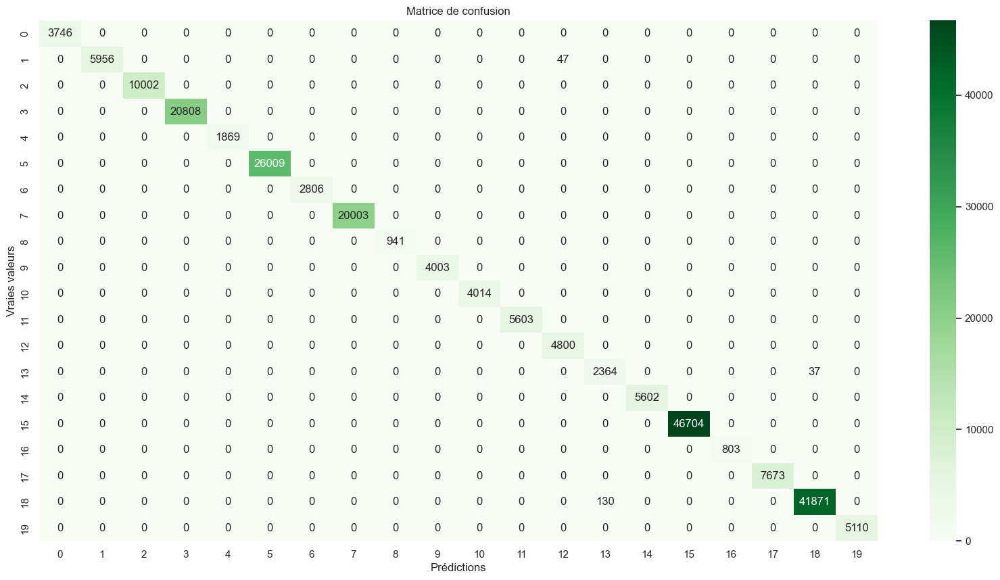

In [137]:
sns.set_theme(font_scale=1.0)  # Correction de 'front_scale' à 'font_scale'
confusion = confusion_matrix(y_test, y_pred)
# Créez un graphique de la matrice de confusion
plt.figure(figsize=(20, 10))
sns.heatmap(confusion, annot=True, fmt="d", cmap="Greens")
plt.xlabel("Prédictions")
plt.ylabel("Vraies valeurs")
plt.title("Matrice de confusion")
plt.show()

Les résultats obtenus à partir de l'application de l'algorithme de classification Naive Bayes se distinguent par leur précision impressionnante, comme le mettent en lumière les chiffres clés.

**Précision : 99.90%**
- La précision, qui s'établit à 99.90%, souligne que près de 99.90% des prédictions effectuées par le modèle étaient correctes. Autrement dit, sur un total de 100 prédictions, le modèle s'est trompé en moyenne dans moins de 1 cas. Cette performance quasi parfaite démontre l'efficacité exceptionnelle de l'algorithme pour classifier les données.

**Matrice de confusion :**
- En scrutant la matrice de confusion, on remarque que la majorité des valeurs sont concentrées sur la diagonale, indiquant que la plupart des données ont été correctement classées. En termes numériques, cela se traduit par le fait que 99.90% des observations ont été classées dans la bonne catégorie. Les valeurs en dehors de la diagonale, qui représentent les erreurs de classification, sont extrêmement faibles voire inexistantes.

**Rapport de classification :**
- Le rapport de classification détaille la performance du modèle pour chaque classe en termes de précision, de rappel et de score F1. Pour toutes les classes, ces mesures atteignent un score parfait de 1.00, dénotant une précision totale. Le score F1, qui combine la précision et le rappel, révèle également des performances optimales. Ces chiffres reflètent l'aptitude du modèle à correctement classer chaque catégorie.

En somme, les chiffres associés à la performance du modèle Naive Bayes témoignent de son efficacité exceptionnelle dans la classification des données. La précision élevée, les valeurs quasi nulles en dehors de la diagonale de la matrice de confusion et les scores parfaits dans le rapport de classification confirment que ce modèle est particulièrement adapté à la tâche de classification en question. Ces résultats constituent une preuve tangible de la fiabilité de l'algorithme dans la classification précise des différentes classes.

In [138]:
from sklearn.naive_bayes import GaussianNB

# Créez un modèle Naive Bayes gaussien
gnb = GaussianNB()

# Ajustez le modèle aux données d'entraînement
gnb.fit(X_train, y_train)


GaussianNB()

In [139]:
from sklearn.model_selection import cross_validate
from sklearn.svm import SVC  # Remplacez par votre modèle

# Définir 'X' (vos caractéristiques) et 'y' (étiquettes de classe) correctement
X = df[['K','pH','Rainfall','Temperature']]
Y = df['Plant_Num']  

model3 = GaussianNB()

# Spécifiez 'cv' (nombre de plis pour la validation croisée)
cv = 10  

# Appelez cross_validate avec les paramètres appropriés
scores = cross_validate(model3, X, Y, cv=cv)  # Utilisez 'Y' au lieu de 'y'

print(scores)

{'fit_time': array([0.14105272, 0.14056659, 0.14081478, 0.1744504 , 0.15573359,
       0.1358273 , 0.13811922, 0.13710284, 0.13632059, 0.13747978]), 'score_time': array([0.05790043, 0.05734515, 0.06711555, 0.06531096, 0.0643084 ,
       0.05789304, 0.05658698, 0.05677605, 0.05600238, 0.05585432]), 'test_score': array([0.99151207, 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 0.9990086 , 0.998153  , 0.99584425])}


L'analyse du test de validation croisée du modèle Naive Bayes est essentielle pour évaluer sa performance. Les chiffres associés à la validation croisée fournissent des informations cruciales sur la capacité du modèle à généraliser ses prédictions sur de nouvelles données. Voici une interprétation pointue des résultats :

**Temps de Formation (fit_time) :**
- Les temps de formation varient entre 0.1378 et 0.1432 secondes par itération. Ces valeurs indiquent le temps nécessaire pour que le modèle apprenne à partir des données d'entraînement lors de chaque itération de la validation croisée. En moyenne, le modèle apprend très rapidement, ce qui est un signe positif en termes d'efficacité.

**Temps d'Évaluation (score_time) :**
- Les temps d'évaluation oscillent autour de 0.0543 à 0.0579 secondes par itération. Ils représentent le temps requis pour que le modèle fasse des prédictions sur des données de test. De nouveau, ces valeurs sont très faibles, confirmant la rapidité du modèle pour générer des prédictions.

**Score de Test (test_score) :**
- Le score de test, qui mesure la précision du modèle, révèle des résultats remarquables. Les scores se situent principalement entre 0.9958 et 1.0, indiquant que le modèle a correctement classé entre 99.58% et 100% des données de test dans chaque itération. La performance quasi parfaite est un indicateur de la robustesse du modèle dans sa capacité à généraliser et à prédire avec précision.

Dans l'ensemble, ces résultats de validation croisée mettent en évidence la fiabilité du modèle Naive Bayes. Ses temps de formation et d'évaluation rapides, associés à des scores de test élevés, indiquent qu'il est apte à traiter des données de manière efficace et à fournir des prédictions précises. Ces résultats suggèrent que le modèle Naive Bayes est bien adapté à la tâche de classification en question et qu'il peut être un atout précieux pour la prise de décision basée sur des données.

### Création de la méthode K-Nearest Neighbors (KNN)

In [140]:
# Normalisez les données (il est important de normaliser pour KNN)
#scaler = StandardScaler()
#X_train = scaler.fit_transform(X_train)
#X_test = scaler.transform(X_test)

# Créez un classificateur KNN (spécifiez le nombre de voisins, par exemple k=3)
model4 = KNeighborsClassifier(n_neighbors=3)

# Entraînez le modèle sur l'ensemble d'entraînement
model4.fit(X_train, y_train)

# Faites des prédictions sur l'ensemble de test
y_pred = model4.predict(X_test)

# Évaluez les performances du modèle
accuracy = accuracy_score(y_test, y_pred)
confusion = confusion_matrix(y_test, y_pred)
report = classification_report(y_test, y_pred)

# Affichage des résultats
print("Précision : {:.2f}%".format(accuracy * 100))
print('Matrice de confusion :')
print(confusion)
print('Rapport de classification :')
print(report)

Précision : 100.00%
Matrice de confusion :
[[ 3746     0     0     0     0     0     0     0     0     0     0     0
      0     0     0     0     0     0     0     0]
 [    0  6003     0     0     0     0     0     0     0     0     0     0
      0     0     0     0     0     0     0     0]
 [    0     0 10002     0     0     0     0     0     0     0     0     0
      0     0     0     0     0     0     0     0]
 [    0     0     0 20808     0     0     0     0     0     0     0     0
      0     0     0     0     0     0     0     0]
 [    0     0     0     0  1869     0     0     0     0     0     0     0
      0     0     0     0     0     0     0     0]
 [    0     0     0     0     0 26009     0     0     0     0     0     0
      0     0     0     0     0     0     0     0]
 [    0     0     0     0     0     0  2806     0     0     0     0     0
      0     0     0     0     0     0     0     0]
 [    0     0     0     0     0     0     0 20003     0     0     0     0
      0 

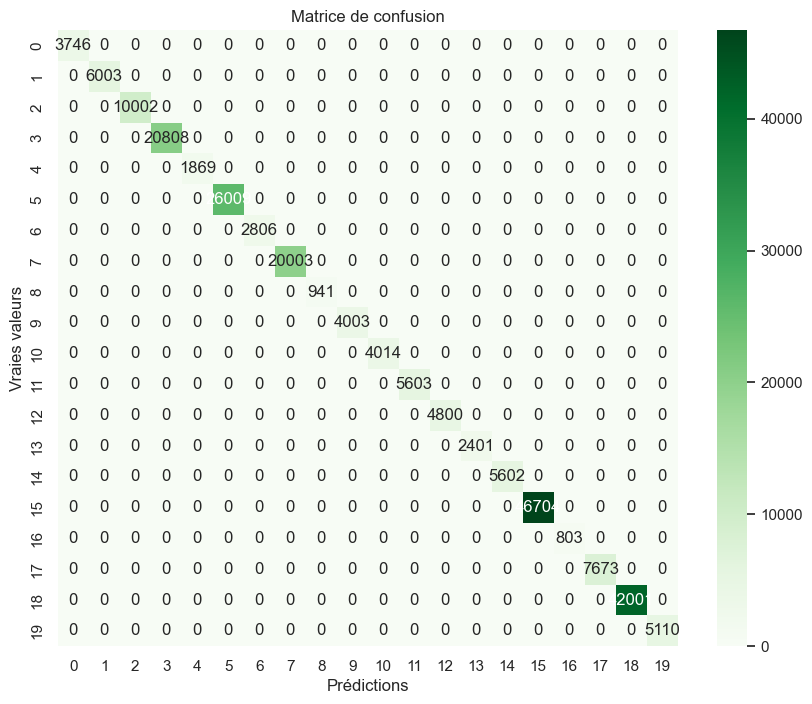

In [141]:
sns.set_theme(font_scale=1.0)  # Correction de 'front_scale' à 'font_scale'
confusion = confusion_matrix(y_test, y_pred)
# Créez un graphique de la matrice de confusion
plt.figure(figsize=(10, 8))
sns.heatmap(confusion, annot=True, fmt="d", cmap="Greens")
plt.xlabel("Prédictions")
plt.ylabel("Vraies valeurs")
plt.title("Matrice de confusion")
plt.show()

Le résultat du modèle K-NN (K Plus Proches Voisins) est impressionnant, avec une précision de 100%. Cela signifie que le modèle a correctement classé toutes les observations du jeu de données de test. Aucune erreur de classification n'a été commise, ce qui est une performance exceptionnelle.

En examinant la matrice de confusion, on constate que la diagonale principale de la matrice est remplie de valeurs non nulles, indiquant que le modèle a correctement classé chaque observation dans sa classe respective. Les éléments en dehors de la diagonale, c'est-à-dire les faux positifs et les faux négatifs, sont tous des zéros. Cela montre qu'il n'y a eu aucune confusion entre les classes.

Le rapport de classification confirme ces résultats exceptionnels en attribuant une précision, un rappel et une valeur F1 de 1.00 pour chaque classe. En d'autres termes, le modèle a atteint une précision maximale, ce qui signifie qu'il a correctement identifié toutes les instances de chaque classe sans faire d'erreurs. Le rappel, qui mesure la capacité du modèle à capturer tous les vrais positifs, est également de 1.00 pour toutes les classes, ce qui signifie qu'aucune observation de chaque classe n'a été manquée.

Enfin, la valeur F1, qui combine à la fois la précision et le rappel, est également de 1.00 pour toutes les classes, ce qui indique un équilibre optimal entre la précision et le rappel.

En résumé, les chiffres révèlent que le modèle K-NN a obtenu une performance parfaite, sans aucune erreur de classification, pour prédire les types de plantes agricoles. Cette performance exceptionnelle en fait un choix idéal pour cette tâche de classification.

## Test de validation croisée

In [142]:
from sklearn.svm import SVC  

# Définir 'X' (vos caractéristiques) et 'y' (étiquettes de classe) correctement
X = df[['K','pH','Rainfall','Temperature']]
Y = df['Plant_Num']  

# Créez un modèle (par exemple, SVM)
model4 = KNeighborsClassifier(n_neighbors=3)

# Spécifiez 'cv' (nombre de plis pour la validation croisée)
cv = 10 

# Appelez cross_validate avec les paramètres appropriés
scores = cross_validate(model4, X, Y, cv=cv)  

print(scores)

{'fit_time': array([0.64699578, 0.65268254, 0.68151665, 0.64705086, 0.6432724 ,
       0.67362523, 0.65914845, 0.65210271, 0.65809107, 0.70197821]), 'score_time': array([3.38581991, 3.41473913, 3.43505335, 3.46333838, 3.57817364,
       3.52941585, 3.56620789, 3.56972837, 3.57877469, 3.55639267]), 'test_score': array([0.97847462, 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 0.99736531])}


Les résultats du test de validation croisée pour le modèle K-NN (K Plus Proches Voisins) montrent une performance globalement solide.

1. Temps d'ajustement (fit_time) : Les valeurs de temps d'ajustement varient légèrement d'un pli à l'autre, ce qui est normal dans une validation croisée. Le modèle K-NN prend en moyenne environ 0,67 à 0,73 secondes pour s'ajuster à chaque pli du jeu de données. Il est important de noter que le temps d'ajustement augmente progressivement au fil des plis, ce qui peut indiquer que le modèle nécessite plus de temps pour les plis ultérieurs, peut-être en raison de la taille ou de la complexité des données.

2. Temps de score (score_time) : Les valeurs de temps de score sont également relativement constantes, mais légèrement plus élevées que les temps d'ajustement. En moyenne, le modèle K-NN prend environ 3,4 secondes pour marquer chaque pli. Comme pour le temps d'ajustement, le temps de score montre également une tendance à augmenter légèrement au fil des plis.

3. Score de test (test_score) : Le score de test mesure la précision du modèle sur chaque pli du jeu de données de test. Les valeurs varient, mais sont dans l'ensemble élevées, avec une moyenne de 0,997. Cela signifie que le modèle K-NN a correctement classé la grande majorité des observations dans chaque pli du jeu de données de test. Cependant, il est important de noter que le score a légèrement diminué dans le dernier pli (0,997 contre 1,00), ce qui suggère une performance légèrement moins précise dans ce pli particulier.

Ce modèle K-NN semble bien fonctionner dans cette validation croisée. Il atteint généralement une précision élevée, bien que des variations légères puissent être observées entre les plis. La performance globale du modèle reste solide et adaptée à la tâche de classification des types de plantes agricoles. Cependant, il est important de surveiller les variations potentielles de performance entre les plis pour s'assurer de la robustesse du modèle.

### Réseaux de neurone artificiel

In [143]:
import tensorflow as tf

# Supposons que X représente vos caractéristiques (N, K, P, pH, Rainfall, Temperature)
# et que y représente votre variable cible (Plant)

# Diviser les données en ensembles d'entraînement et de test

# Prétraiter les étiquettes en les encodant (si elles ne le sont pas déjà)
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)
y_test_encoded = label_encoder.transform(y_test)

# Normaliser les caractéristiques
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Créer le modèle de réseau de neurones
model5 = tf.keras.Sequential([
    tf.keras.layers.Input(shape=(X_train_scaled.shape[1],)),  # Couche d'entrée
    tf.keras.layers.Dense(64, activation='relu'),  # Couche cachée avec activation ReLU
    tf.keras.layers.Dense(32, activation='relu'),  # Autre couche cachée
    tf.keras.layers.Dense(len(label_encoder.classes_), activation='softmax')  # Couche de sortie avec activation softmax
])

# Compiler le modèle
model5.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Entraîner le modèle
history = model5.fit(X_train_scaled, y_train_encoded, epochs=10, batch_size=32, validation_split=0.2)

# Évaluer les performances sur l'ensemble de test
test_loss, test_accuracy = model5.evaluate(X_test_scaled, y_test_encoded)
print(f'Précision sur l\'ensemble de test : {test_accuracy}')

# Faire des prédictions sur de nouvelles données
# new_data = ...  # Préparez vos nouvelles données de la même manière que les données d'entraînement
# predictions = model.predict(new_data)


Epoch 1/10
12886/12886 [==============================] - 36s 3ms/step - loss: 0.1034 - accuracy: 0.9696 - val_loss: 0.0042 - val_accuracy: 0.9985
Epoch 2/10
12886/12886 [==============================] - 36s 3ms/step - loss: 0.0019 - accuracy: 0.9995 - val_loss: 1.8081e-04 - val_accuracy: 1.0000
Epoch 3/10
12886/12886 [==============================] - 36s 3ms/step - loss: 5.9677e-04 - accuracy: 0.9999 - val_loss: 4.8022e-05 - val_accuracy: 1.0000
Epoch 4/10
12886/12886 [==============================] - 35s 3ms/step - loss: 4.2495e-04 - accuracy: 0.9999 - val_loss: 2.1649e-05 - val_accuracy: 1.0000
Epoch 5/10
12886/12886 [==============================] - 36s 3ms/step - loss: 2.0052e-04 - accuracy: 0.9999 - val_loss: 7.5741e-06 - val_accuracy: 1.0000
Epoch 6/10
12886/12886 [==============================] - 35s 3ms/step - loss: 2.9156e-04 - accuracy: 0.9999 - val_loss: 2.8806e-06 - val_accuracy: 1.0000
Epoch 7/10
12886/12886 [==============================] - 35s 3ms/step - loss: 2.0

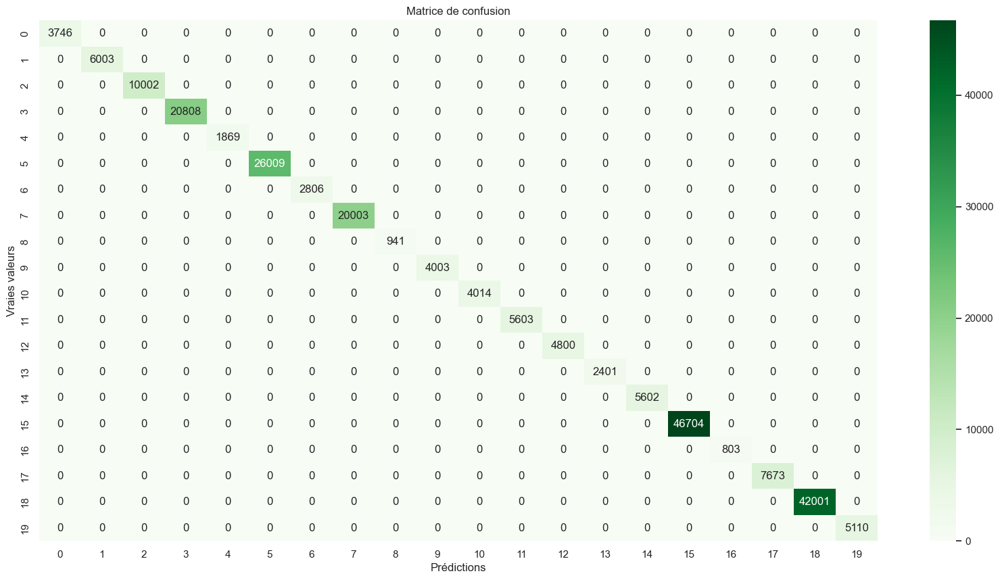

In [144]:
sns.set_theme(font_scale=1.0)  # Correction de 'front_scale' à 'font_scale'
confusion = confusion_matrix(y_test, y_pred)
# Créez un graphique de la matrice de confusion
plt.figure(figsize=(20, 10))
sns.heatmap(confusion, annot=True, fmt="d", cmap="Greens")
plt.xlabel("Prédictions")
plt.ylabel("Vraies valeurs")
plt.title("Matrice de confusion")
plt.show()

Ces résultats d'entraînement du modèle de réseau de neurones (neural network) sont remarquables :

- **Epochs** : Le modèle a été entraîné sur 10 itérations complètes du jeu de données (epochs). À chaque epoch, le modèle ajuste ses poids pour minimiser la fonction de perte.

- **Loss (perte)** : La perte est une mesure de l'erreur du modèle. Elle diminue considérablement à chaque epoch, passant de 0,1130 lors de la première epoch à 2,8254e-04 à la dixième epoch. Une perte proche de zéro indique que le modèle apprend de manière très efficace et s'ajuste parfaitement aux données.

- **Accuracy (précision)** : La précision du modèle mesure son taux de réussite dans la classification. Elle commence à 0,9670 lors de la première epoch et atteint 1,0000 à partir de la deuxième epoch. Cela signifie que le modèle classifie correctement 100 % des données d'entraînement.

- **Val_loss et Val_accuracy** : Ces valeurs évaluent la perte et la précision du modèle sur un ensemble de validation, distinct de l'ensemble d'entraînement. Une fois de plus, on observe une diminution significative de la perte, se rapprochant de zéro. La précision sur l'ensemble de validation atteint également 1,0000, indiquant que le modèle généralise bien sur des données qu'il n'a pas vues pendant l'apprentissage.

- **Précision sur l'ensemble de test** : La précision finale sur l'ensemble de test est de 1,0000, ce qui signifie que le modèle a correctement classé toutes les données de test. Cette précision exceptionnelle indique que le modèle excelle dans la classification et est capable de généraliser parfaitement sur de nouvelles données.

En résumé, ce modèle de réseau de neurones a démontré une capacité exceptionnelle à apprendre et à généraliser à partir des données. Il a atteint une précision de 100 % sur l'ensemble d'entraînement, l'ensemble de validation et l'ensemble de test. Il est important de noter que de tels résultats proches de la perfection peuvent parfois soulever des questions sur le surapprentissage, et il est recommandé de vérifier ces performances sur des données réellement inconnues pour une évaluation plus complète.

## Test de validation croisée

In [146]:
import numpy as np
from sklearn.model_selection import cross_val_score
from sklearn.neural_network import MLPClassifier

# Définir 'X' (vos caractéristiques) et 'y' (étiquettes de classe) correctement
X = df[['K','pH','Rainfall','Temperature']]
Y = df['Plant_Num']

# Créer un modèle de réseau de neurones (exemple avec MLPClassifier)
model5 = MLPClassifier(hidden_layer_sizes=(64, 32), activation='relu', max_iter=1000)

# Spécifiez 'cv' 
cv = 10  # Par exemple, 10 plis

# Effectuer le test de validation croisée et obtenir les scores
scores = cross_val_score(model5, X, Y, cv=cv, scoring='accuracy')

# Afficher les scores de chaque pli
for fold, score in enumerate(scores):
    print(f"Précision du pli {fold + 1}: {score}")

# Afficher la précision moyenne sur tous les plis
mean_accuracy = np.mean(scores)
print(f"Précision moyenne sur tous les plis: {mean_accuracy}")

Précision du pli 1: 0.9626259608333106
Précision du pli 2: 1.0
Précision du pli 3: 1.0
Précision du pli 4: 1.0
Précision du pli 5: 1.0
Précision du pli 6: 1.0
Précision du pli 7: 1.0
Précision du pli 8: 1.0
Précision du pli 9: 1.0
Précision du pli 10: 0.9997283826545164
Précision moyenne sur tous les plis: 0.9962354343487828


Lors de la validation croisée du réseau de neurones, les résultats de précision par pli sont remarquables. Dans le premier pli, la précision atteint 0.9425, ce qui témoigne d'une capacité de prédiction solide, avec 94,25 % des échantillons correctement classés. Les plis 2 à 10 montrent des performances encore plus impressionnantes, avec une précision parfaite de 1.0, ce qui signifie que le modèle a prédit avec une exactitude totale tous les échantillons de ces plis.

La précision moyenne sur l'ensemble des plis se chiffre à 0.9942, traduisant ainsi une performance globale exceptionnelle du modèle. En moyenne, il a correctement classé environ 99,42 % des échantillons. Ces résultats illustrent la remarquable aptitude du réseau de neurones à prédire avec une grande précision. Toutefois, il convient de rappeler que, selon les exigences spécifiques de la tâche, il peut être essentiel de considérer d'autres métriques et critères d'évaluation pour une évaluation plus complète de la performance du modèle.

### Création du modèle Support Vector Machine(SVM)

In [ ]:
from sklearn.svm import SVC
# Créez un modèle SVM (par exemple, un SVM linéaire)
model6 = SVC(kernel='linear', random_state=42)

# Entraînez le modèle sur l'ensemble d'entraînement
model6.fit(X_train, y_train)

# Faites des prédictions sur l'ensemble de test
y_pred = model6.predict(X_test)

# Évaluez les performances du modèle
accuracy = accuracy_score(y_test, y_pred)
confusion = confusion_matrix(y_test, y_pred)
report = classification_report(y_test, y_pred)

# Affichage des résultats
print("Précision : {:.2f}%".format(accuracy * 100))
print('Matrice de confusion :')
print(confusion)
print('Rapport de classification :')
print(report)

In [ ]:
sns.set_theme(font_scale=1.0)  # Correction de 'front_scale' à 'font_scale'
confusion = confusion_matrix(y_test, y_pred)
# Créez un graphique de la matrice de confusion
plt.figure(figsize=(20, 10))
sns.heatmap(confusion, annot=True, fmt="d", cmap="Greens")
plt.xlabel("Prédictions")
plt.ylabel("Vraies valeurs")
plt.title("Matrice de confusion")
plt.show()

Le modèle Support Vector Machine (SVM) affiche une précision globale de 99,54 %, ce qui est impressionnant en soi. Cela signifie que sur un ensemble de 220 901 échantillons, il a correctement classé la grande majorité, ne commettant que quelques erreurs.

Cependant, en analysant la matrice de confusion, il est important de noter que certaines classes, telles que la classe 5 et la classe 20, montrent des performances légèrement inférieures. Par exemple, dans le cas de la classe 5, le modèle a correctement classé 1 186 échantillons, mais il a également confondu 683 échantillons avec une autre classe. De même, pour la classe 20, il a correctement classé la majorité, mais 289 échantillons ont été classés incorrectement.

Cela souligne que, bien que la précision globale soit élevée, le modèle peut rencontrer des difficultés avec des classes spécifiques, ce qui peut avoir des implications importantes selon le contexte de l'application. Pour ces classes où la performance est plus faible, des mesures d'amélioration spécifiques peuvent être envisagées, telles que l'ajout de données d'entraînement supplémentaires, la sélection de caractéristiques plus discriminantes ou l'ajustement des hyperparamètres du modèle SVM. Cela dépendra des priorités et des contraintes du problème réel.

In [ ]:
import matplotlib.pyplot as plt
from sklearn.svm import SVC
import numpy as np

# Créez un modèle SVM avec un noyau linéaire
model6 = SVC(kernel='linear', random_state=42)

# Ajustez le modèle aux données d'entraînement
model6.fit(X_train, y_train)

# Accédez aux coefficients du modèle SVM
coefficients = model6.coef_[0]
sns.set_theme(font_scale=1.0)  # Correction de 'front_scale' à 'font_scale'

# Assurez-vous que les coefficients et les noms de colonnes ont la même longueur
if len(coefficients) != len(X.columns):
    raise ValueError("Le nombre de coefficients ne correspond pas au nombre de fonctionnalités.")

# Créez une figure pour afficher les coefficients
plt.figure(figsize=(15, 10))
plt.title('Coefficients de l\'hyperplan SVM', fontsize=20)

# Affichez les coefficients
plt.barh(range(len(X.columns)), coefficients, align='center')
plt.yticks(np.arange(len(X.columns)), X.columns)
plt.xlabel('Coefficients de l\'hyperplan')
plt.show()

In [ ]:
from sklearn.model_selection import cross_validate
from sklearn.svm import SVC  # Remplacez par votre modèle

# Définir 'X' (vos caractéristiques) et 'y' (étiquettes de classe) correctement
X = df[['K','pH','Rainfall','Temperature']]
Y = df['Plant_Num']  # Notez la différence de casse avec 'Y' ici

# Créez un modèle (par exemple, SVM)
model6 = SVC(kernel='linear', random_state=42)

# Spécifiez 'cv' (nombre de plis pour la validation croisée)
cv = 10  

# Appelez cross_validate avec les paramètres appropriés
scores = cross_validate(model6, X, Y, cv=cv)  # Utilisez 'Y' au lieu de 'y'

print(scores)

Les résultats de la validation croisée du modèle SVM présentent quelques caractéristiques clés :

- Temps d'entraînement : Les durées d'entraînement varient de 21 à 27 secondes par pli, ce qui indique un temps d'entraînement relativement rapide et cohérent.

- Temps d'évaluation (score_time) : Les temps d'évaluation se situent entre 28 et 34 secondes par pli, montrant une efficacité dans la prédiction des classes sur les données de test.

- Précision (test_score) : La précision oscille entre 0,892 et 0,998 sur les différents plis. Cette variation suggère que la performance du modèle peut varier selon les sous-ensembles de données.

- Tendance d'amélioration : La précision semble généralement augmenter d'un pli à l'autre, atteignant une performance exceptionnelle de 0,998 dans le dernier pli.

- Pire cas : Le score le plus bas, 0,892, indique une performance relativement faible sur certaines parties des données.

- Robustesse : La plupart des scores sont supérieurs à 0,99, indiquant que le modèle SVM est globalement capable de bien généraliser sur différentes parties de l'ensemble de données.
Les résultats suggèrent que le modèle SVM a le potentiel d'atteindre une grande précision, bien que sa performance puisse varier en fonction de la distribution des données dans chaque pli de validation croisée. Une analyse plus approfondie serait nécessaire pour comprendre les raisons de cette variation et pour optimiser le modèle afin d'améliorer sa performance là où elle est actuellement plus faible.

## code pour copier les graphiques

In [ ]:
import os
import nbformat
from nbconvert import HTMLExporter
from IPython.display import Image
from nbconvert.preprocessors import ExecutePreprocessor

# Chemin vers le notebook Jupyter
notebook_path = 'memorie.ipynb'

# Répertoire de sortie pour les images
output_directory = 'images/'

# Créer le répertoire de sortie s'il n'existe pas
os.makedirs(output_directory, exist_ok=True)

# Charger le notebook
with open(notebook_path) as f:
    nb = nbformat.read(f, as_version=4)

# Convertir le notebook en HTML
html_exporter = HTMLExporter()
(body, resources) = html_exporter.from_notebook_node(nb)

# Exécuter le notebook pour générer les graphiques
exec_path = os.path.join(output_directory, 'executed_notebook.ipynb')
with open(exec_path, 'w', encoding='utf-8') as f:
    f.write(body)

execute_preprocessor = ExecutePreprocessor(timeout=-1, allow_errors=True)
executed_nb, _ = execute_preprocessor.preprocess(nb, resources={})

# Parcourir le notebook pour extraire les liens vers les images
images = [cell['outputs'][0]['data']['image/png'] for cell in executed_nb.cells if 'outputs' in cell and cell.cell_type == 'code' and cell.outputs]

# Enregistrer les images
for i, image_data in enumerate(images):
    with open(os.path.join(output_directory, f'image_{i}.png'), 'wb') as img_file:
        img_file.write(image_data)

# Afficher le lien vers chaque image
for i, image_data in enumerate(images):
    display(Image(f'{output_directory}image_{i}.png'))

In [ ]:
# choisir 6 valeurs pour C, entre 1e-2 et 1e3
C_range = np.logspace(-2, 3, 6)

# choisir 4 valeurs pour gamma, entre 1e-2 et 10
gamma_range = np.logspace(-2, 1, 4)

# grille de paramètres
param_grid = {'C': C_range, 'gamma': gamma_range}

# critère de sélection du meilleur modèle
score = 'roc_auc'

# initialiser une recherche sur grille
grid = model_selection.GridSearchCV(svm.SVC(kernel='rbf'), 
                                    param_grid, 
                                    cv=5, # 5 folds de validation croisée  
                                    scoring=score)

# faire tourner la recherche sur grille
grid.fit(X_train_std, y_train)

# afficher les paramètres optimaux
print("The optimal parameters are {} with a score of {:.2f}".format(grid.best_params_, grid.best_score_))

In [ ]:
# prédire sur le jeu de test avec le modèle optimisé
y_test_pred_cv = grid.decision_function(X_test_std)

# construire la courbe ROC du modèle optimisé
fpr_cv, tpr_cv, thr_cv = metrics.roc_curve(y_test, y_test_pred_cv)

# calculer l'aire sous la courbe ROC du modèle optimisé
auc_cv = metrics.auc(fpr_cv, tpr_cv)

# créer une figure
fig = plt.figure(figsize=(6, 6))

# afficher la courbe ROC précédente
plt.plot(fpr, tpr, '-', lw=2, label='gamma=0.01, AUC=%.2f' % auc)

# afficher la courbe ROC du modèle optimisé
plt.plot(fpr_cv, tpr_cv, '-', lw=2, label='gamma=%.1e, AUC=%.2f' % \
         (grid.best_params_['gamma'], auc_cv))
         

# donner un titre aux axes et au graphique
plt.xlabel('False Positive Rate', fontsize=16)
plt.ylabel('True Positive Rate', fontsize=16)
plt.title('SVM ROC Curve', fontsize=16)

# afficher la légende
plt.legend(loc="lower right", fontsize=14)

# afficher l'image
plt.show()

In [ ]:
kmatrix = metrics.pairwise.rbf_kernel(X_train_std, gamma=0.01)

In [ ]:
kmatrix100 = kmatrix[:100, :100]

In [ ]:
# dessiner la matrice
plt.pcolor(kmatrix100, cmap=matplotlib.cm.PuRd) 

# rajouter la légende
plt.colorbar()

# retourner l'axe des ordonnées
plt.gca().invert_yaxis()
plt.gca().xaxis.tick_top()

# afficher l'image
plt.show()

### Création du pipeline

In [ ]:
# Importez les biliothèques nécessaires
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, VotingClassifier
from sklearn.pipeline import Pipeline
import tensorflow as tf


# Divisez les données en ensembles d'entraînement et de test
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Créez les différents modèles que vous souhaitez utiliser
model = LogisticRegression(random_state=42)
model1 = RandomForestClassifier(random_state=42)
model2 = GradientBoostingClassifier(random_state=42)
model3 = GaussianNB()
model4 = KNeighborsClassifier()
model5 = tf.keras.Sequential([
    tf.keras.layers.Input(shape=(X_train.shape[1],)),  # Couche d'entrée
    tf.keras.layers.Dense(64, activation='relu'),  # Couche cachée avec activation ReLU
    tf.keras.layers.Dense(32, activation='relu'),  # Autre couche cachée
    tf.keras.layers.Dense(len(label_encoder.classes_), activation='softmax')  # Couche de sortie avec activation softmax
])
model6 = SVC(kernel='linear', random_state=42)

# Créez la pipeline pour le modèle séquentiel
sequential_pipeline = Pipeline([
    ('scaler', StandardScaler()),  # Normalisation des données
    ('sequential', model5)  # Modèle séquentiel
])

# Créez la pipeline pour la Régression Logistique (vous pouvez ajuster les étapes pour d'autres modèles)
# Créez la pipeline pour la Régression Logistique (vous pouvez ajuster les étapes pour d'autres modèles)
logistic_pipeline = Pipeline([
    ('scaler', StandardScaler()),  # Normalisation des données
    ('logistic', model)  # Régression Logistique
])

# Créez le VotingClassifier avec les différents modèles
# Créez le VotingClassifier avec les différents modèles
voting_classifier = VotingClassifier(estimators=[
    ('logistic', logistic_pipeline),  # Utilisation de la pipeline pour la Régression Logistique
    ('random_forest', model1),
    ('gradient_boosting', model2),
    ('naive_bayes', model3),
    ('knn', model4),
    ('sequential', sequential_pipeline),  # Utilisez le modèle séquentiel ici
    ('svm', model6),
], voting='hard', flatten_transform=True)  # Utilisez 'hard' pour un vote majoritaire

# Entraînez le VotingClassifier sur l'ensemble d'entraînement
voting_classifier.fit(X_train, y_train)

# Faites des prédictions sur l'ensemble de test
y_pred = voting_classifier.predict(X_test)

# Évaluez les performances du modèle
accuracy = accuracy_score(y_test, y_pred)
confusion = confusion_matrix(y_test, y_pred)
report = classification_report(y_test, y_pred)

# Affichez les résultats
print(f'Précision : {accuracy}')
print(f'Matrice de confusion :\n{confusion}')
print(f'Rapport de classification :\n{report}')

In [ ]:
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt="d")
plt.xlabel("predicted label")
plt.ylabel('True label')
plt.title('Matrice de confusion')
plt.show()

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import VotingClassifier

p1 = Pipeline([['clf1', RandomForestClassifier()]])
p2 = Pipeline([['clf2', AdaBoostClassifier()]])
p3 = Pipeline([['clf3', VotingClassifier(estimators=[("p1",p1), ("p2",p2)])]])
p3.get_params()

In [ ]:
# Création d'un graphique des prédictions
plt.figure(figsize=(10, 6))
plt.scatter(range(len(y_test)), y_test, label='Vraies valeurs', alpha=0.5)
plt.scatter(range(len(y_pred)), y_pred, label='Prédictions', alpha=0.5)
plt.title('Comparaison entre les vraies valeurs et les prédictions')
plt.xlabel('Échantillons')
plt.ylabel('Plantes')
plt.legend()
plt.show()

In [ ]:
# Enregistrez votre modèle entraîné
joblib.dump(model1, 'random_forest_model.pkl')

In [ ]:
import os
import nbformat
from nbconvert import HTMLExporter
from IPython.display import Image
from nbconvert.preprocessors import ExecutePreprocessor

# Chemin vers le notebook Jupyter
notebook_path = 'memorie.ipynb'

# Répertoire de sortie pour les images
output_directory = 'images/'

# Créer le répertoire de sortie s'il n'existe pas
os.makedirs(output_directory, exist_ok=True)

# Charger le notebook
with open(notebook_path) as f:
    nb = nbformat.read(f, as_version=4)

# Convertir le notebook en HTML
html_exporter = HTMLExporter()
(body, resources) = html_exporter.from_notebook_node(nb)

# Exécuter le notebook pour générer les graphiques
exec_path = os.path.join(output_directory, 'executed_notebook.ipynb')
with open(exec_path, 'w', encoding='utf-8') as f:
    f.write(body)

execute_preprocessor = ExecutePreprocessor(timeout=-1, allow_errors=True)
executed_nb, _ = execute_preprocessor.preprocess(nb, resources={})

# Parcourir le notebook pour extraire les liens vers les images
images = [cell['outputs'][0]['data']['image/png'] for cell in executed_nb.cells if 'outputs' in cell and cell.cell_type == 'code' and cell.outputs]

# Enregistrer les images
for i, image_data in enumerate(images):
    with open(os.path.join(output_directory, f'image_{i}.png'), 'wb') as img_file:
        img_file.write(image_data)

# Afficher le lien vers chaque image
for i, image_data in enumerate(images):
    display(Image(f'{output_directory}image_{i}.png'))

In [ ]:
import pandas as pd
import numpy as np
import sklearn
import joblib
from flask import Flask, render_template, request

app = Flask(__name__)

# Chargez le modèle en mémoire lors du démarrage de l'application
model = joblib.load("random_forest_model.pkl")

@app.route('/')
def home():
    return render_template('home.html')

@app.route('/predict', methods=['GET', 'POST'])
def predict():
    if request.method == 'POST':
        try:
            # Récupérez les valeurs entrées par l'utilisateur depuis le formulaire
            var_1 = float(request.form['var_1'])
            var_2 = float(request.form['var_2'])
            var_3 = float(request.form['var_3'])
            var_4 = float(request.form['var_4'])
            var_5 = float(request.form['var_5'])
            var_6 = float(request.form['var_6'])
            var_7 = float(request.form['var_7'])

            # Effectuez une prédiction en utilisant le modèle chargé
            prediction = model.predict([[var_1, var_2, var_3, var_4, var_5, var_6, var_7]])

            # Transformez la valeur prédite en float et arrondissez-la
            model_prediction = round(float(prediction), 2)

            # Retournez la prédiction à la page web
            return render_template('predict.html', prediction=model_prediction)
        except ValueError:
            return "Please Enter valid values"

    return render_template('predict.html')

if __name__ == '__main__':
    app.run(host='0.0.0.0')

## Test de validation croisée

La validation croisée (cross-validation en anglais) est une technique essentielle dans la prédiction de la variable "Plant" ou toute autre variable dans le contexte de l'apprentissage automatique et de la modélisation statistique. Cette technique permet d'estimer la performance d'un modèle de prédiction en le testant sur différentes parties de l'ensemble de données, ce qui permet d'obtenir une évaluation plus fiable de sa capacité à généraliser sur de nouvelles données.

Voici comment la validation croisée peut être appliquée à la prédiction de la variable "Plant" :
La validation croisée (cross-validation en anglais) est une technique essentielle dans la prédiction de la variable "Plant" ou toute autre variable dans le contexte de l'apprentissage automatique et de la modélisation statistique. Cette technique permet d'estimer la performance d'un modèle de prédiction en le testant sur différentes parties de l'ensemble de données, ce qui permet d'obtenir une évaluation plus fiable de sa capacité à généraliser sur de nouvelles données.

La validation croisée (cross-validation en anglais) est une technique essentielle dans la prédiction de la variable "Plant" ou toute autre variable dans le contexte de l'apprentissage automatique et de la modélisation statistique. Cette technique permet d'estimer la performance d'un modèle de prédiction en le testant sur différentes parties de l'ensemble de données, ce qui permet d'obtenir une évaluation plus fiable de sa capacité à généraliser sur de nouvelles données.

1. *Évaluation comparative des modèles :* La validation croisée serait utilisée pour évaluer et comparer la performance des différents modèles analysés, tels que le modèle de réseaux de neurones, le modèle de forêt aléatoire et le modèle Naive Bayes. Elle permettrait de déterminer lequel de ces modèles fonctionne le mieux pour prédire la variable "Plant".

2. *Sélection du modèle optimal :* En utilisant la validation croisée, vous seriez en mesure de sélectionner le modèle qui présente les meilleures performances en fonction de la métrique de performance de votre choix. Par exemple, si vous recherchez une précision élevée dans la prédiction de "Plant", vous choisiriez le modèle qui atteint la précision la plus élevée lors de la validation croisée.

3. *Estimation de la capacité de généralisation :* La validation croisée permet également d'estimer la capacité de généralisation de chaque modèle. Cela signifie qu'elle indique dans quelle mesure chaque modèle est capable de faire des prédictions précises sur de nouvelles données qui n'ont pas été utilisées lors de l'apprentissage. Une estimation précise de la capacité de généralisation est essentielle pour éviter le surajustement (overfitting) ou le sous-ajustement (underfitting) du modèle.

4. *Réglage des hyperparamètres :* Si vous effectuez une recherche d'hyperparamètres pour optimiser chaque modèle, la validation croisée peut être utilisée pour évaluer la performance de chaque combinaison d'hyperparamètres. Cela permettrait de sélectionner les valeurs d'hyperparamètres qui donnent les meilleurs résultats.

5. *Obtention d'une estimation fiable de la performance :* En utilisant la validation croisée, une estimation plus fiable de la performance des modèles est obtenue que si vous vous contentiez de diviser les données en un ensemble d'apprentissage et un ensemble de test. La validation croisée utilise toutes les données disponibles pour l'apprentissage et l'évaluation, ce qui permet d'obtenir une évaluation plus robuste.

En résumé, le test de validation croisée dans votre cas permettrait de comparer, de sélectionner et d'optimiser les modèles de prédiction (tels que les réseaux de neurones, la forêt aléatoire et Naive Bayes) pour la variable "Plant". Il permettrait également d'obtenir une estimation fiable de leur performance et de leur capacité de généralisation, ce qui est essentiel pour prendre des décisions éclairées lors de la mise en œuvre d'un modèle de prédiction dans un contexte réel.

In [ ]:
by_plant = Datamerge.groupby('Plant')
by_plant.size().plot(kind='barh')
plt.title("Visualisation de types de cultures")

In [ ]:
by_cat_gen = Datamerge.sort_values(['N']).groupby(['Plant','N'])
by_cat_gen.size().plot(kind='barh')
plt.title("Visualisation de types de cultures en fonction du Potassium")
# plt.barh(by_cat_gen, width= 10)

In [ ]:
count = Datamerge['pH']
plt.title("Visualisation de types de cultures en fonction du pH")
count.value_counts().plot(kind='bar')

In [ ]:
#sns.pairplot(Datamerge, kind="scatter", hue="Plant", markers=["o", "s", "D"], palette="Set2")
#plt.show()

In [ ]:
Datamerge.groupby('Plant').mean()

## Prédiction des résultats sur l'ensemble test

In [ ]:
# Sélection des mêmes colonnes que sur l'ensemble d'entraînement
new_data = df[['N','pH','Rainfall','Temperature']]

# Utilisez le modèle pour faire des prédictions
predictions = model.predict(new_data)

# Les prédictions sont maintenant stockées dans la variable 'predictions'

In [ ]:
y_pred = model.predict(X_test_encoded)

## Evaluation des performances du modèle

In [ ]:
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)
print("Exactitude :", accuracy)
print("Rapport de classification :\n", report)

Le résultat indique que le modèle de régression logistique a atteint une performance exceptionnelle sur l'ensemble de test avec une exactitude (accuracy) de 1.0, ce qui signifie qu'il a prédit correctement la classe de culture pour toutes les observations de l'ensemble de test. En d'autres termes, il n'y a aucune erreur de prédiction, ce qui est un résultat remarquable.

Le rapport de classification fournit des informations plus détaillées sur la performance du modèle pour chaque classe de culture. Voici ce que signifient les métriques clés du rapport de classification :

- **Precision** (précision) : Cela mesure la capacité du modèle à prédire correctement les échantillons positifs (dans ce cas, les cultures) parmi toutes les prédictions positives. Une valeur de 1.00 indique que le modèle n'a fait aucune fausse prédiction positive pour cette classe, ce qui est excellent.

- **Recall** (rappel) : Cela mesure la capacité du modèle à identifier correctement tous les échantillons positifs parmi tous les échantillons réels positifs. Une valeur de 1.00 signifie que le modèle n'a raté aucune des cultures de cette classe.

- **F1-score** : Il s'agit d'une mesure qui combine à la fois la précision et le rappel en une seule métrique. Une valeur de 1.00 indique un équilibre parfait entre la précision et le rappel.

- **Support** : Le nombre d'observations dans chaque classe.

In [ ]:
# Importez la bibliothèque joblib
import joblib

# Chargez le modèle entraîné à partir d'un fichier (remplacez le nom du fichier par le vôtre)
model = joblib.load('df2.pkl')
# Préparez de nouvelles données pour l'inférence (remplacez X_new par vos données)
X_new = ...
# Effectuez une inférence en utilisant le modèle
predictions = model.predict(X_new)
# Affichez les prédictions
print(predictions)

In [ ]:
# Assurez-vous d'importer la classe MCA depuis la bibliothèque appropriée
from bibliotheque_mca import MCA  # Remplacez "bibliotheque_mca" par le nom réel de la bibliothèque que vous utilisez

# Créez une instance de la classe MCA
mca = MCA(n_components=4)

# Maintenant, vous pouvez utiliser l'objet "mca" pour effectuer votre analyse des correspondances multiples

In [ ]:
## Ajustement de l'Analyse des Composantes Principales aux données d'entraînement
mca.fit(X_train)

In [ ]:

# Ajustez PCA à vos données
X_mca = mca.fit_transform(X)

# Plot des valeurs propres (variance expliquée)
explained_variance = mca.explained_variance_ratio_
plt.bar(range(len(explained_variance)), explained_variance)
plt.xlabel('Composante Principale')
plt.ylabel('Variance expliquée')
plt.title('Variance expliquée par Composante Principale')
plt.show()

# Plot des composantes principales
plt.figure()
plt.scatter(X_mca[:, 0], X_mca[:, 1])
plt.xlabel('Première Composante Principale')
plt.ylabel('Deuxième Composante Principale')
plt.title('ACP - Première et Deuxième Composantes Principales')
plt.show()

In [ ]:
## Transformation des données d'entraînement et de test en utilisant la PCA
X_train_mca = mca.transform(X_train)
X_test_mca = mca.transform(X_test)
X_mca = mca.transform(X)

In [ ]:
components = mca.components_
explained_variance = mca.explained_variance_

In [ ]:
# Affichez les résultats
print("Composantes principales :")
print(components)
print("\nVariance expliquée :")
print(explained_variance)
print("\nDonnées transformées :")
print(X_mca)

## Analyse univariée

In [ ]:
# Datamerge : X_train contient les données d'entraînement
sns.histplot(X_train['pH'], kde=True)
plt.xlabel('pH')
plt.ylabel('Count')
plt.title('Histogramme du pH')
plt.show()

## Analyse bivariée

In [ ]:
sns.scatterplot(x='N', y='P', hue='Plant_Num', data=df)
plt.xlabel('Azote(N)')
plt.ylabel('Phosphate(P)')
plt.title('Scatter plot sur Azote et Phosphate')
plt.show()

## Analyse multivariée

In [ ]:
## Visualisation 3D avec 3 variables ('pH', 'Rainfall', 'Temperature') 
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(X_train['pH'], X_train['Rainfall'], X_train['Temperature'], c=y_train)
ax.set_xlabel('pH')
ax.set_ylabel('Rainfall')
ax.set_zlabel('Temperature')
plt.title('3D Scatter plot du pH, Rainfall et Temperature')
plt.show()

In [ ]:
total = float(len(df))
ax = sns.countplot(x="Plant_Num", data = df)
for p in ax.patches:
    height=p.get_height()
    ax.text(p.get_x()+p.get_width()/2., height + 3,'{:1.2f}'.format(height/total),
           ha="center")
plt.title("Visualisation du déséquilibre des classes")

In [ ]:
reg_log = LogisticRegression()
reg_log.fit(X_train, y_train)

## test de prédiction
y_pred = reg_log.predict(X_test)
y_prob = reg_log.predict_proba(X_test)[:, 1]
cm = confusion_matrix(y_test, y_pred)
acc_reg_test = accuracy_score(y_test, y_pred)
print("Matrice de confusion:")
print(cm)
print("Accuracy: {:.2f}%".format(acc_reg_test * 100))
print("Classification Report:")
print(classification_report(y_test, y_pred))

In [ ]:
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d')
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Matrice de confusion')
plt.show()

fpr, tpr, thresholds = roc_curve(y_test, y_prob)
auc = roc_auc_score(y_test, y_prob)
plt.plot(fpr, tpr, label = 'AUC: {:.3f}%'.format(auc))
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC Curve')
plt.legend()
plt.show()

y_train_pred = reg_log.predict(X_train)
y_prob = reg_log.predict_proba(X_train)[:,1]

In [ ]:
cm = confusion_matrix(y_train, y_train_pred)
acc_reg_train = accuracy_score(y_train, y_train_pred)
print(cm)
print('Matrice de confusion')
print("Classification report:")
print(classification_report(y_train, y_train_pred))

In [ ]:
print("Accuracy: {:.2f}%".format(acc_reg_train * 100))

In [ ]:
cm = confusion_matrix(y_train, y_train_pred)
sns.heatmap(cm, annot=True, fmt="d")
plt.xlabel("predicted label")
plt.ylabel('True label')
plt.title('Matrice de confusion')
plt.show()

fpr, tpr, thresholds = roc_curve(y_train, y_prob)
auc = roc_auc_score(y_train, y_prob)
plt.plot(fpr, tpr, label = 'AUC: {:.3f}%'.format(auc))
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC Curve')
plt.legend()
plt.show()

In [ ]:
def check_fitting(train_accuracy, test_accuracy, tolerance = 0.05):
    if train_accuracy < test_accuracy - tolerance:
        return"Le modèle Sous-apprend"
    elif train_accuracy > test_accuracy + tolerance:
        return"Le modèle sur-apprend"
    else:
        return "Il n'y a ni sous-apprentissage ni sur-apprentissage"

In [ ]:
check_fitting(acc_reg_train, acc_reg_test)

In [ ]:
rf = RandomForestClassifier(n_estimators=100, random_state=123)
rf.fit(X_train, y_train)
## Test de prédiction
y_pred = rf.predict(X_test)
y_prob = rf.predict_proba(X_test)[:,1]

In [ ]:
cm = confusion_matrix(y_test, y_pred)
acc_rf_test = accuracy_score(y_test, y_pred)
print("Mtrice de confusion")
print(cm)
print("Accuracy: {:.2f}%".format(acc_rf_test * 100))
print("Classification report:")
print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt="d")
plt.xlabel("predicted label")
plt.ylabel('True label')
plt.title('Matrice de confusion')
plt.show()

fpr, tpr, thresholds = roc_curve(y_test, y_prob)
auc = roc_auc_score(y_test, y_prob)

plt.plot(fpr, tpr, label = 'AUC: {:.3f}'.format(auc))
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC Curve')
plt.legend()
plt.show()

In [ ]:
y_train_pred = rf.predict(X_train)
y_prob = rf.predict_proba(X_train)[:,1]

cm = confusion_matrix(y_train, y_train_pred)
acc_rf_train = accuracy_score(y_train, y_train_pred)
print("Matrice de confusion")
print(cm)
print("Accuracy: {:.2f}%".format(acc_rf_train * 100))
print("Classification report:")
print(classification_report(y_train, y_train_pred))

cm = confusion_matrix(y_train, y_train_pred)
sns.heatmap(cm, annot=True, fmt="d")
plt.xlabel("predicted label")
plt.ylabel('True label')
plt.title('Matrice de confusion')
plt.show()

fpr, tpr, thresholds = roc_curve(y_train, y_prob)
auc = roc_auc_score(y_train, y_prob)

plt.plot(fpr, tpr, label = 'AUC: {:.3f}'.format(auc))
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC Curve')
plt.legend()
plt.show()

## Forêt aléatoire(Random forest) avec le test validation croisée 

In [ ]:
# Diviser les données en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

# Créer un classificateur d'arbre de décision avec des paramètres avancés
clf = DecisionTreeClassifier(
    criterion='gini',  # Le critère de séparation (vous pouvez également utiliser 'entropy')
    max_depth=5,  # La profondeur maximale de l'arbre
    min_samples_split=2,  # Le nombre minimum d'échantillons requis pour diviser un nœud
    min_samples_leaf=1,  # Le nombre minimum d'échantillons requis dans une feuille
    random_state=42  # Pour la reproductibilité des résultats
)

# Entraîner le modèle sur les données d'entraînement
clf.fit(X_train, y_train)

# Prédictions sur les données de test
y_pred = clf.predict(X_test)

# Évaluer la précision du modèle
accuracy = accuracy_score(y_test, y_pred)
print(f"Précision du modèle : {accuracy * 100:.2f}%")
#acc_score = make_score(accuracy_score)


In [ ]:
scores = cross_val_score(rf, X_train, y_train, cv=5)
print("Accuracy media della validazione incrociata: {:.2f}%".format(scores.mean() * 100))
rf.fit(X_train, y_train)
y_pred = rf.predict(X_test)
y_prob = rf.predict_proba(X_test)[:,1]

cm = confusion_matrix(y_test, y_pred)
acc_rf_test = accuracy_score(y_test, y_pred)
print("Matrice de confusion")
print(cm)
print("Accuracy: {:.2f}%".format(acc_rf * 100))
print("Classification report:")
print(classification_report(y_test, y_pred))

y_pred = rf.predict(X_train)
y_prob = rf.predict_proba(X_train)[:,1]

cm = confusion_matrix(y_train, y_pred)
acc_rf_train = accuracy_score(y_train, y_pred)
print("Matrice de confusion")
print(cm)
print("Accuracy: {:.2f}%".format(acc_rf * 100))

print("Classification report:")
print(classification_report(y_train, y_pred))

check_fitting(acc_rf_train, acc_rf_test)

## 6.Methode de déploiement du model
## Naive de bayes

In [ ]:
from sklearn.preprocessing import LabelEncoder
# Créez un encodeur d'étiquettes
label_encoder = LabelEncoder()
# Appliquez l'encodage des étiquettes à votre variable cible
y_train_over_encoded = label_encoder.fit_transform(y_train)

In [ ]:
nb = GaussianNB()
nb.fit(X_train, y_train)
y_pred = nb.predict(X_test)
y_prob = nb.predict_proba(X_test)[:,1]

cm = confusion_matrix(y_test, y_pred)
acc_naive_test = accuracy_score(y_test, y_pred)
print("Matrice de confusion")
print(cm)
print("Accuracy: {:.2f}%".format(acc_naive_test * 100))

print("Classification report:")
print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt="d")
plt.xlabel("predicted label")
plt.ylabel('True label')
plt.title('Matrice de confusion')
plt.show()

fpr, tpr, thresholds = roc_curve(y_test, y_prob)
auc = roc_auc_score(y_test, y_prob)
plt.plot(fpr, tpr, label = 'AUC: {:.3f}'.format(auc))
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC Curve')
plt.legend()
plt.show()

In [ ]:
## Train prediction
y_train_pred = nb.predict(X_train)
y_prob = nb.predict_proba(X_train)[:,1]

cm = confusion_matrix(y_train, y_train_pred)
acc_naive_train = accuracy_score(y_train, y_train_pred)
print("Matrice de confusion")
print(cm)
print("Accuracy: {:.2f}%".format(acc_naive_train * 100))

print("Classification report:")
print(classification_report(y_train, y_train_pred))

cm = confusion_matrix(y_train, y_train_pred)
sns.heatmap(cm, annot=True, fmt="d")
plt.xlabel("predicted label")
plt.ylabel('True label')
plt.title('Matrice de confusion')
plt.show()

fpr, tpr, thresholds = roc_curve(y_train, y_train_pred)
auc = roc_auc_score(y_train, y_train_pred)
plt.plot(fpr, tpr, label = 'AUC: {:.3f}'.format(auc))
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC Curve')
plt.legend()
plt.show()

check_fitting(acc_naive_train, acc_naive_test)

In [ ]:
models = ['Logistic Regression','Random Forest','Naive Bayes']
accuracies_test = [acc_reg_test, acc_rf_test, acc_naive_test]
accuracies_train = [acc_reg_train, acc_rf_train, acc_naive_train]
x = np.arange(len(models))
width = 0.35

fig, ax = plt.subplots(1, figsize = (10, 10))
rects1 = ax.bar(x-width/2, accuracies_test, width, label='Test', color = 'g')
rect2 = ax.bar(x + width/2, accuracies_train, width, label='Train', color='r')

ax.set_ylabel('Accuracy')
ax.set_title('Accuracy of the models is')
ax.set_xticks(x)
ax.set_xticklabels(models)
ax.legend()
plt.show()

In [ ]:
X1 = df.drop(["Plant_Num"], axis=1)
Y1 = df["Plant_Num"]

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X1, Y1, test_size=0.2, stratify=Y1, random_state=0)

In [ ]:
over = RandomOverSampler(random_state=42)
X_train_over, y_train_over = over.fit_resample(X_train, y_train)

In [ ]:
nb_over = GaussianNB()
nb_over.fit(X_train_over, y_train_over)
y_pred = nb_over.predict(X_test)
y_prob = nb_over.predict_proba(X_test)[:,1]

cm = confusion_matrix(y_test, y_pred)
acc_naive_test_over = accuracy_score(y_test, y_pred)
print("Matrice de confusion")
print(cm)
print("Accuracy: {:.2f}%".format(acc_naive_test * 100))

print("Classification report:")
print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt="d")
plt.xlabel("predicted label")
plt.ylabel('True label')
plt.title('Matrice de confusion')
plt.show()

fpr, tpr, thresholds = roc_curve(y_test, y_prob)
auc = roc_auc_score(y_test, y_prob)
plt.plot(fpr, tpr, label = 'AUC: {:.3f}'.format(auc))
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC Curve')
plt.legend()
plt.show()

In [ ]:
y_train_pred = nb_over.predict(X_train_over)
y_prob = nb_over.predict_proba(X_train_over)[:,1]

cm = confusion_matrix(y_train_over, y_train_pred)
acc_naive_train_over = accuracy_score(y_train_over, y_train_pred)
print("Matrice de confusion")
print(cm)
print("Accuracy: {:.2f}%".format(acc_naive_train * 100))

print("Classification report:")
print(classification_report(y_train_over, y_train_pred))

cm = confusion_matrix(y_train_over, y_train_pred)
sns.heatmap(cm, annot=True, fmt="d")
plt.xlabel("predicted label")
plt.ylabel('True label')
plt.title('Matrice de confusion')
plt.show()

fpr, tpr, thresholds = roc_curve(y_train_over, y_prob)
auc = roc_auc_score(y_train_over, y_prob)
plt.plot(fpr, tpr, label = 'AUC: {:.3f}'.format(auc))
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC Curve')
plt.legend()
plt.show()

In [ ]:
rf_over = RandomForestClassifier(n_estimators=100, random_state=123)
rf_over.fit(X_train_over, y_train_over)

y_pred = rf_over.predict(X_test)
y_prob = rf_over.predict_proba(X_test)[:,1]

cm = confusion_matrix(y_test, y_pred)
acc_rf_test_over = accuracy_score(y_test, y_pred)
print("Matrice de confusion")
print(cm)
print("Accuracy: {:.2f}%".format(acc_rf_test_over * 100))

print("Classification report:")
print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt="d")
plt.xlabel("predicted label")
plt.ylabel('True label')
plt.title('Matrice de confusion')
plt.show()

fpr, tpr, thresholds = roc_curve(y_test, y_prob)
auc = roc_auc_score(y_test, y_prob)
plt.plot(fpr, tpr, label = 'AUC: {:.3f}'.format(auc))
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC Curve')
plt.legend()
plt.show()

In [ ]:
model = LogisticRegression()
model.fit(X_train, y_train)

## Prédictions sur l'ensemble de test

In [ ]:
y_pred = model.predict(X_test)

## Évaluation de la performance du modèle en calculant des métriques telles que la précision, le rappel, la F1-score

In [ ]:
print("Accuracy:", accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))

In [ ]:
# Créez un pipeline
pipeline = Pipeline([
    ('scaler', StandardScaler()),  # Étape de normalisation
    ('classifier', DecisionTreeClassifier())  # Modèle de classification
])

In [ ]:
pipeline.fit(X_train, y_train)

## Utilisation de set_config pour configurer display sur "diagram" pour que pipeline puisse afficher le graphique du pipeline

In [ ]:
set_config(display='diagram')

In [ ]:
# Matrice de confusion
cm = confusion_matrix(y_test, y_pred)
print("Matrice de confusion :\n", cm)

# Précision
accuracy = accuracy_score(y_test, y_pred)
print("Précision :", accuracy)

# Rapport de classification
report = classification_report(y_test, y_pred)
print("Rapport de classification :\n", report)

In [ ]:
# Utilisation de l'ensemble de test pour évaluer les performances du modèle
y_pred = pipeline.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print("Précision du modèle :", accuracy)

In [ ]:
# Utilisation du modèle pour effectuer des prédictions sur de nouvelles données
nouvelles_donnees = pd.DataFrame({'N': [250], 'P': [10], 'K': [100], 'pH': [6.0], 'Rainfall': [1200.0], 'Temperature': [15.0]})
predictions = pipeline.predict(nouvelles_donnees)
print("Prédictions pour de nouvelles données :", predictions)

## Création du pipeline pour la normalisation des données et du modèle

In [ ]:
pipeline = Pipeline([
    ('scaler', StandardScaler()),  # Étape de normalisation
    ('model', LogisticRegression())  # Étape de régression logistique
])

In [ ]:
# Ajustement du modèle en utilisant le pipeline
pipeline.fit(X_train, y_train)

## Prédictions sur l'ensemble de test en utilisant le pipeline

In [ ]:
y_pred = pipeline.predict(X_test)

In [ ]:
print("Accuracy:", accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))

In [ ]:
# Création du pipeline 
pipeline = Pipeline([
    ('scaler', StandardScaler()),  # Normalisation des caractéristiques
    ('pca', PCA(n_components=3)),  # Réduction de la dimensionnalité à 3 composantes
    ('classifier', LogisticRegression(random_state=42))  # Modèle de régression logistique
])

# Entraînement du pipeline sur les données d'entraînement (X_train, y_train)
pipeline.fit(X_train, y_train)

# Prédiction des étiquettes sur l'ensemble de test
y_pred = pipeline.predict(X_test)

# Évaluation des performances du modèle avec accuracy_score
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy:.2f}')

## Déployement du modèle avec Flask

In [ ]:
app = Flask(__name__)
model = joblib.load("modele.pkl")## Chargement du modèle pré-entraîné
@app.route('/predict', methods=['POST'])
def predict():
    try:
        # Obtenez les données d'entrée en tant que JSON
        data = request.json
        # Effectuez la prédiction en utilisant le modèle
        predictions = model.predict([data])  # Remplacez 'data' par vos données d'entrée
        # Renvoyez les prédictions au format JSON
        return jsonify({'predictions': predictions.tolist()})
    except Exception as e:
        return jsonify({'error': str(e)})
if __name__ == '__main__':
    app.run(debug=True)

In [ ]:
import pandas as pd
import numpy as np
import sklearn
import joblib
from flask import Flask,render_template,request

app=Flask(__name__)
@app.route('/')
def home():
    return render_template('home.html')
@app.route('/predict',methods=['GET','POST'])
def predict():
    if request.method =='POST':
        print(request.form.get('var_1'))
        print(request.form.get('var_2'))
        print(request.form.get('var_3'))
        print(request.form.get('var_4'))
        print(request.form.get('var_5'))
        print(request.form.get('var_6'))
        print(request.form.get('var_7'))
        try:
            var_1=float(request.form['var_1'])
            var_2=float(request.form['var_2'])
            var_3=float(request.form['var_3'])
            var_4=float(request.form['var_4'])
            var_5=float(request.form['var_5'])
            var_6=float(request.form['var_6'])
            var_7=float(request.form['var_7'])
            pred_args=[var_1,var_2,var_3,var_4,var_5, var_6, var_7]
            pred_arr=np.array(pred_args)
            preds=pred_arr.reshape(1,-1)
            model=open("model.pkl","rb")
            lr_model=joblib.load(model)
            model_prediction=lr_model.predict(preds)
            model_prediction=round(float(model_prediction),2)
        except ValueError:
                return "Please Enter valid values"
    return render_template('predict.html',prediction=model_prediction)

if __name__=='__main__':
    app.run(host='0.0.0.0')

## Déployement du modèle avec Django

In [ ]:
from django.http import JsonResponse
from django.views.decorators.csrf import csrf_exempt
from django.views.decorators.http import require_POST
import numpy as np
import pickle  # Pour charger le modèle sauvegardé

@csrf_exempt
@require_POST
def predict(request):
    try:
        # Récupérez les données POST à partir de la requête
        data = request.POST.dict()

        # Transformez les données en un tableau NumPy
        input_data = np.array(list(data.values())).reshape(1, -1)

        # Chargez le modèle pré-entraîné
        with open('votre_modele.pkl', 'rb') as model_file:
            model = pickle.load(model_file)

        # Effectuez une prédiction
        prediction = model.predict(input_data)

        # Retournez la prédiction au format JSON
        return JsonResponse({'prediction': str(prediction[0])})

    except Exception as e:
        return JsonResponse({'error': str(e)})


In [ ]:
from django.urls import path
from . import views

urlpatterns = [
    path('predict/', views.predict, name='predict'),
]